<a href="https://colab.research.google.com/github/arpanbiswas52/varTBO/blob/main/dKLBO_spectral_MicroscopyVersion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **dKLBO Spectral**
Dec, 2022

This is modified BO recommder system framework for connect with microscope. Here we replaced the standard GP kernels to dKL kernel


## *   Rama Vasudevan proposed the idea
## *   Arpan Biswas developed dKLBO recommder system framework
## *   Rama Vasudevan, Yongtao Liu adapted to make it compatible with microscopy measurement



#Problem Description
Build a BO framework-

Here we have a image data, where X is the input location of the image

Each location in the image, we have a spectral data, from where user select if the data is good/bad (discrete choice). We take the means of all good spectral only to generate the target spectral.

At the mid of execution, the user also have option to either eliminate (or update the preferance) all the previously stored (if user suddenly find a desired spectral) spectral, and put more weights on new found spectral.

The goal is to build a optimization (BO) model where we adaptively sample towards region (in image) of good spectral, and find optimal location point closest to the current chosen target spectral (as per user voting).

#Workflow: Run BO to find the optimal location for user-desired spectral as per voting
Here we vote the quality of spectral

User interaction part:

During the play (for each function evaluation)-

- View spectral image. User have three rating options as 0, 1, 2: 0-Bad, 1-Good, 2-Very good. **To answer 0-Bad spectral, user can just jit ENTER to save time**

- If user rated as Good or Very Good, and user already have a current target spectral (user already selected at least one good/very good spectral in earlier iterations), another message pops up if the user want to update preference of new spectral Vs the current target spectral(Y or N). **To answer No, user can just jit ENTER to save time**

  - If user choose "Y", user have option (any number between 0-10) to provide weights of new spectral. For example: If user provide 10 as input, the updated target spectral will be only the new chosen spectral and all the other earlier selected good spectral will be eliminated from target.

  - If user choose "N", as default the updated target spectral is the mean of all the earlier selected spectral and the new spectral.

- User will get prompt at each BO iteration if they are satisfied with current target spectral or need further updating(Y or N). **To answer No, user can just jit ENTER to save time**

  - If user select Y, target spectral will be updated as per voting of new spectral and **human-guided dynamic objective evaluation** will be conducted

  - If user select N, target spectral will be fixed and an **automated objective evaluation** will be conducted for future BO iteration (like normal BO and no further prompt of target updating)


After END OF PLAY, the code automatically save below data (serially) in optim.results.npy

- Best locations, from evaluated samples and GP estimated

- User rating of spectral at each evaluated locations in image

- the matrices of evaluated location and the respective obj values

In [2]:
!pip install --upgrade --no-cache-dir gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0


In [3]:
!pip install --upgrade torch==1.8.1 torchvision==0.9.1
!pip install smt
!pip install atomai
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 804.1 MB 5.7 kB/s 
     |████████████████████████████████| 17.4 MB 101.6 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.13.0+cu116
    Uninstalling torch-1.13.0+cu116:
      Successfully uninstalled torch-1.13.0+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.0+cu116
    Uninstalling torchvision-0.14.0+cu116:
      Successfully uninstalled torchvision-0.14.0+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.14.0 requires torch==1.13.0, but you have torch 1.8.1 which is incompatible.
torchaudio 0.13.0+cu116 requires torch==1.13.0, but you have torch 1.8.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-pyth

In [4]:
import sys
import gdown
import torch
from torchvision import datasets, transforms
from torchmetrics.functional import structural_similarity_index_measure as ssim2
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import pickle
import numpy as np
import random
#import kornia as K
#import kornia.metrics as metrics
from PIL import Image
from typing import Tuple
import ipywidgets as widgets
from IPython.display import display
import pylab as pl
from IPython.display import clear_output
import pdb
from skimage.transform import resize
from mpl_toolkits.axes_grid1 import make_axes_locatable
#import gpim
from sklearn.decomposition import PCA
import matplotlib.gridspec as gridspec
from copy import deepcopy

from typing import Union
import pickle

from mpl_toolkits.axes_grid1 import make_axes_locatable
from smt.sampling_methods import LHS
from torch.optim import SGD
from torch.optim import Adam
from scipy.stats import norm
from scipy.interpolate import interp1d
from skimage.metrics import structural_similarity as ssim
from skimage import filters
from skimage.restoration import denoise_bilateral
import atomai as aoi
from atomai import utils

import time

In [5]:
class play_varTBO():

    def __init__(self):
      pass

    @classmethod
    def func_automated_obj(self, idx_x, idx_y, new_spec_x, new_spec_y, target_func):
        idx1 = int(idx_x)
        idx2 = int(idx_y)
        rf = 10
        #print(wcount_good)
        if (wcount_good == 0): #We dont find a good loop yet from all initial sampling and thus target is unknown
            ssim_spec = np.random.rand(1)*(1) # Unif[0, 1] A sufficiently large value as we want to avoid selecting bad loops,


        else:
            #Calculate ssim between target and ith loop shape
            pred = new_spec_y
            target = target_func
            ssim_spec = ssim(target, pred, data_range=pred.max() - pred.min())

        #This is the basic setting of obj func-- we can incorporate more info as per domain knowledge to improve
        #Into maximization problem
        obj = rf * ssim_spec  #Maximize reward and negative mse
        #print(obj)
        return obj

    @classmethod
    def func_human_interacted_obj(self, idx_x, idx_y, new_spec_x, new_spec_y, wcount_good, target_func, vote):
        idx1 = int(idx_x)
        idx2 = int(idx_y)
        rf = 1
        #print(wcount_good)
        if (wcount_good == 0): #We dont find a good loop yet from all initial sampling and thus target is unknown
            ssim_spec = np.random.rand(1)*(1) # Unif[0, 1] A sufficiently large value as we want to avoid selecting bad loops,
            # When we have a target, we will recalculate again to get more accuract estimate
            R = vote*rf

        else:
            #Calculate dissimilarity (mse) between target and ith loop shape

            pred = new_spec_y
            target = target_func
            ssim_spec = ssim(target, pred, data_range=pred.max() - pred.min())
            #plt.plot(new_spec_x, new_spec_y)
            #plt.show()
            #dev2_spectral = (target_func-new_spec_y)**2
            #mse_spectral = torch.mean(dev2_spectral)
            #Calculate reward as per voting, this will minimize the risk of similar function values of good and bad loop shape with similar mse
            R = vote*rf

        #This is the basic setting of obj func-- we can incorporate more info as per domain knowledge to improve
        #Into maximization problem
        obj = R + ssim_spec #Maximize reward and ssim
        #print(mse_spectral)
        return obj

    @classmethod
    def optimize_dKLgp(self, train_X, train_Y):
        data_dim = train_X.shape[-1]

        dklgp_surro = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
        
        dklgp_surro.fit(train_X, train_Y, training_cycles=200)
        return dklgp_surro


    @classmethod
    def cal_posterior(self, gp_surro, test_X):
        y_pred_means = np.zeros((len(test_X), 1))
        y_pred_vars = np.zeros((len(test_X), 1))
        mean, var = gp_surro.predict(test_X, batch_size=len(test_X))
        #mean = torch.from_numpy(mean)
        #var = torch.from_numpy(var)
        y_pred_means[:, 0] = mean
        y_pred_vars[:, 0] = var
       
        return y_pred_means, y_pred_vars
    
    @classmethod
    def acqmanEI(self, y_means, y_vars, train_Y, ieval):
        #y_means = y_means.detach().numpy()
        #y_vars = y_vars.detach().numpy()
        y_std = np.sqrt(y_vars)
        fmax = train_Y.max()
        #fmax = fmax.detach().numpy()
        best_value = fmax
        EI_val = np.zeros(len(y_vars))
        Z = np.zeros(len(y_vars))
        eta = 0.01

        for i in range(0, len(y_std)):
            if (y_std[i] <=0):
                EI_val[i] = 0
            else:
                Z[i] =  (y_means[i]-best_value-eta)/y_std[i]
                EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])

        # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
        EI_val[ieval] = -1
        acq_val = np.max(EI_val)
        acq_cand = [k for k, j in enumerate(EI_val) if j == acq_val]
        #print(acq_val)
        return acq_cand, acq_val, EI_val

    @classmethod
    def augment_newdata_KL(self, acq_X, acq_X_norm, acq_indices, train_X, train_X_norm, train_indices, train_Y, 
                           new_spec_x, new_spec_y, eval_spec, img_space, var_params, u, m):
        wcount_good, pref, target_func = var_params[0], var_params[1], var_params[2]

        nextX = acq_X
        nextX_norm = acq_X_norm
        nextind = acq_indices
        train_X_norm = np.vstack((train_X_norm, nextX_norm))
        train_X = np.vstack((train_X, nextX))
        train_indices = np.vstack((train_indices, nextind))

        p = np.zeros((1, 1))
        #x = torch.empty((1,2))
        idx_x = int(train_indices[-1, 0])
        idx_y = int(train_indices[-1, 1])

        
        if (u == 0):
            print("Are you satisfied with current target? (y- yes or press ENTER- No)")
            update_target = str(input("Answer: "))
            if (update_target == "Y" or update_target == 'y'):
                print("Spectral target now fixed. Continue automated BO...")
                #First time switching to automated BO, need to recalculate the objectives again
                plt.plot(new_spec_x, new_spec_y)
                plt.title('loc:' +str(idx_y) +"," + str(idx_x), fontsize = 20)
                plt.show()
                train_Y = np.zeros((train_X.shape[0], 1))
                u = 1 # This is a switching parameter to not call for update target every iteration once the user is satisfied
                for i in range(0, train_X.shape[0]):
                    idx_x = int(train_indices[i, 0])
                    idx_y = int(train_indices[i, 1])
                    spec_y = eval_spec_y[idx_x, idx_y, :]
                    #print(idx_x, idx_y, spec_y)
                    train_Y[i, 0] = self.func_automated_obj(idx_x, idx_y, new_spec_x, spec_y, target_func)
  
            else:
                print("User still searching for best target. Continue BO with human interaction...")

                #Vote for new spectral sample and update(or not) target spectral function
                p[0, 0], wcount_good, target_func = self.generate_targetobj(idx_x, idx_y, new_spec_x, new_spec_y, img_space, wcount_good, target_func)
                pref = np.vstack((pref, p)) #Augment pref matrix

                if (p[0, 0] == 0):
                  # If target loop is not updated, we eval for the new samples only as the
                  # func value for others remain the same

                    next_feval = np.zeros((1, 1))
                    next_feval[0, 0] = self.func_human_interacted_obj(idx_x, idx_y, new_spec_x, new_spec_y, wcount_good, target_func, pref[-1, 0])
                    train_Y = np.vstack((train_Y, next_feval))
                else:
                    # If target loop is updated, we reevaluate the obj of old spectral samples and 
                    # eval for the new samples
                    train_Y = np.zeros((train_X.shape[0], 1))
                    for i in range(0, train_X.shape[0]):
                        #x[0, 0] = train_X[i, 0]
                        #x[0, 1] = train_X[i, 1]
                        idx_x = int(train_indices[i, 0])
                        idx_y = int(train_indices[i, 1])
                        spec_y = eval_spec_y[idx_x, idx_y, :]
                        #print(idx_x, idx_y, spec_y)
                        train_Y[i, 0] = self.func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good, target_func, pref[i, 0])
        else:
            plt.plot(new_spec_x, new_spec_y)
            plt.title('loc:' +str(idx_y) +"," + str(idx_x), fontsize = 20)
            plt.show()
            next_feval = np.zeros((1, 1))
            next_feval[0, 0] = self.func_automated_obj(idx_x, idx_y, new_spec_x, new_spec_y, target_func)
            train_Y = np.vstack((train_Y, next_feval)) 

        var_params = [wcount_good, pref, target_func]
        m = m + 1
        return train_X, train_X_norm, train_indices, train_Y, var_params, u, m

    @classmethod
    def generate_targetobj(self, idx_x, idx_y, new_spec_x, new_spec_y, img_space, wcount_good, target_func):
      #count_good= 0
      idx1 = int(idx_x)
      idx2 = int(idx_y)
      if (wcount_good == 0):
        # Figure for user choice
        fig,ax=plt.subplots(ncols=2,figsize=(12,5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker = 'x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' +str(idx2) +"," + str(idx1), fontsize = 20)
        plt.show()

      else:
        # Figure for user choice
        fig,ax=plt.subplots(ncols=3,figsize=(18,5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker = 'x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' +str(idx2) +"," + str(idx1), fontsize = 20)
        ax[2].plot(new_spec_x,target_func)
        ax[2].set_title('Current target function', fontsize = 20)
        plt.show()

      print("Rating: 0-Bad or press ENTER, 1-Good, 2-Very good")
      time.sleep(0.5)
      vote = (input("enter rating: "))
      # For bad spectral, we can also input null values to accelerate the voting- This is similar to skipping voting for bad spectral
      #For good ones, user need to vote as either 1 or 2
      if (vote == ""):
        vote = 0
        print(vote)
      else:
        vote = float(vote)
        print(vote)

      if(vote>0):
        newspec_wt = 1
        if ((wcount_good) > 0): #Only if we already have selected good spectral in early iterations
          print("Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No")
          newspec_pref = str(input("Answer: "))
          # For no pref update, we can also press enter (skip) to accelerate the process
          if (newspec_pref == 'Y' or newspec_pref == 'y'):
            print("Provide weights between 0 and 10: \n10 being all the weights to new spectral as new target.")
            newspec_wt = float(input("enter weightage: "))/10
            print(newspec_wt)
          else:
            newspec_wt = 0.5
        wcount_good =wcount_good + vote
        target_func = (((1-newspec_wt)*target_func*(wcount_good-vote))+(newspec_wt*vote*new_spec_y))/(((
            wcount_good-vote)*(1-newspec_wt)) + (vote*newspec_wt))
      return vote, wcount_good, target_func    

    @classmethod
    def estimate (self, train_indices, train_Y, indices, y_pred_means):
        #Best solution among the evaluated data
        loss = np.max(train_Y)
        ind = np.argmax(train_Y)
        X_opt = np.zeros((1,2))
        X_opt[0, 0] = train_indices[ind, 0]
        X_opt[0, 1] = train_indices[ind, 1]
        #print(loss, ind)

        # Best estimated solution from GP model considering the non-evaluated solution
        loss = np.max(y_pred_means)
        ind = np.argmax(y_pred_means)
        X_opt_GP = np.zeros((1,2))
        X_opt_GP[0, 0] = indices[ind, 0]
        X_opt_GP[0, 1] = indices[ind, 1]
        #print(loss, ind)

        return X_opt, X_opt_GP


# Help function

In [6]:
def plot_results(train_indices, train_Y, indices, y_pred_means, y_pred_vars, X_opt, X_opt_GP, img_space, i):
  pen = 10**0
  #Objective map
  fig,ax=plt.subplots(ncols=3,figsize=(18,5))
  a= ax[0].imshow(img_space, origin = "lower")
  ax[0].scatter(train_indices[:,1], train_indices[:,0], c=train_Y, cmap='jet', linewidth=0.2)
  ax[0].scatter(X_opt[0, 1], X_opt[0, 0], marker='x', c='r')
  ax[0].scatter(X_opt_GP[0, 1], X_opt_GP[0, 0], marker='o', c='r')
  ax[0].axes.xaxis.set_visible(False)
  ax[0].axes.yaxis.set_visible(False)

  a = ax[1].scatter(indices[:,1], indices[:,0], c=y_pred_means/pen, cmap='viridis', linewidth=0.2)
  ax[1].scatter(train_indices[:,1], train_indices[:,0], marker='o', c='g')
  ax[1].scatter(X_opt[0, 1], X_opt[0, 0], marker='x', c='r')
  ax[1].scatter(X_opt_GP[0, 1], X_opt_GP[0, 0], marker='o', c='r')
  divider = make_axes_locatable(ax[1])
  cax = divider.append_axes('right', size='5%', pad=0.05)
  fig.colorbar(a, cax=cax, orientation='vertical')
  ax[1].set_title('Objective (GP mean) map', fontsize=10)
  ax[1].axes.xaxis.set_visible(False)
  ax[1].axes.yaxis.set_visible(False)
  #ax[1].colorbar(a)

  b = ax[2].scatter(indices[:,1], indices[:,0], c=y_pred_vars/(pen**2), cmap='viridis', linewidth=0.2)
  divider = make_axes_locatable(ax[2])
  cax = divider.append_axes('right', size='5%', pad=0.05)
  fig.colorbar(b, cax=cax, orientation='vertical')
  ax[2].set_title('Objective (GP var) map', fontsize=10)
  ax[2].axes.xaxis.set_visible(False)
  ax[2].axes.yaxis.set_visible(False)
  #ax[2].colorbar(b)

  plt.savefig('acquisition_results_step=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
  plt.show()


#Load Dataset

In [ ]:
!gdown https://drive.google.com/uc?id=1By3GELJIYuco4lsPm_DsckZCYSzfKwi_
pickle_file_loc = r'beps_data_50x50.p'
original_data = pickle.load(open(pickle_file_loc, "rb"))
beps_all = original_data['results_beps']

Downloading...
From: https://drive.google.com/uc?id=1By3GELJIYuco4lsPm_DsckZCYSzfKwi_
To: /content/beps_data_50x50.p
100% 1.95G/1.95G [00:10<00:00, 194MB/s]


In [ ]:
spec_length = 64  #spectral data length

amp_slices = []
for ind in range(len(beps_all)):
    amp_slices.append(beps_all[ind][1][2])
amp_slices = np.array(amp_slices)
img = amp_slices[:,16].reshape(50,50)

vdc_full = np.array(beps_all[0][1][0])
vdc_vec = vdc_full[-64:]

amp_mat = amp_slices[:,-128:][:,1::2]
amp_masked = np.zeros_like(amp_mat)


spec_length = amp_mat.shape[-1]  #spectral data length
specim = np.reshape(amp_mat, (img.shape[0], img.shape[1], spec_length))

print(img.shape, vdc_vec.shape, amp_slices.shape, specim.shape)

(50, 50) (64,) (2500, 256) (50, 50, 64)


In [ ]:
window_size = 4

coordinates = aoi.utils.get_coord_grid(img, step=1, return_dict=False)
features, targets, indices = aoi.utils.extract_patches_and_spectra(
    specim, img, coordinates=coordinates, window_size=window_size, avg_pool=1)

features.shape, targets.shape

/usr/local/lib/python3.8/dist-packages/atomai/utils/img.py:450: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  spectra = torch.tensor(spectra).unsqueeze(1)


((2209, 4, 4), (2209, 64))

In [ ]:
norm_ = lambda x: (x - x.min()) / x.ptp()
features, targets = norm_(features), norm_(targets)

In [ ]:
n, d1, d2 = features.shape
num_start = int(10)
N = int(100)
m = 0
spec_length = 64  #spectral data length



spec_length = amp_mat.shape[-1]  #spectral data length

coordinates = utils.get_coord_grid(img, 1)
X_feas = features.reshape(n, d1*d2)

X_feas_norm = features.reshape(n, d1*d2)

amp_masked = np.zeros_like(targets)
np.random.seed(10)

idx = np.random.randint(0, len(X_feas), num_start)
for ind in range(num_start):
    amp_masked[int(idx[ind]),:] = targets[int(idx[ind]),:]

train_X = X_feas[idx]
train_X_norm = X_feas_norm[idx]
#indices = torch.from_numpy(indices)
train_indices = indices[idx]

print(X_feas.shape, X_feas_norm.shape,train_X.shape, train_X_norm.shape, train_indices.shape, amp_masked.shape)

(2209, 16) (2209, 16) (10, 16) (10, 16) (10, 2) (2209, 64)


# Initial evaluation

#Goal: Voting based on existance and higher prominance of left ear of spectral loop

i is 0, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #1


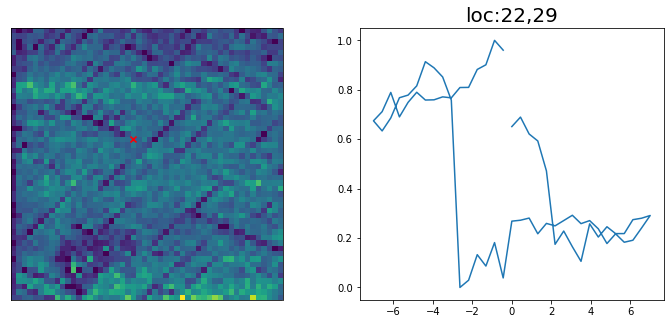

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
i is 1, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #2


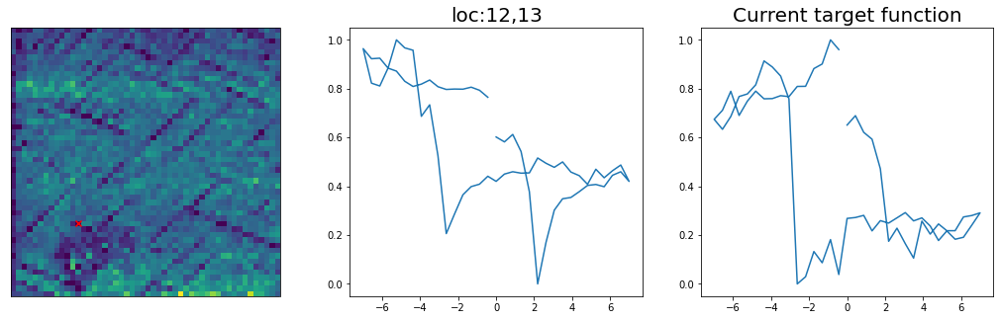

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 2, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #3


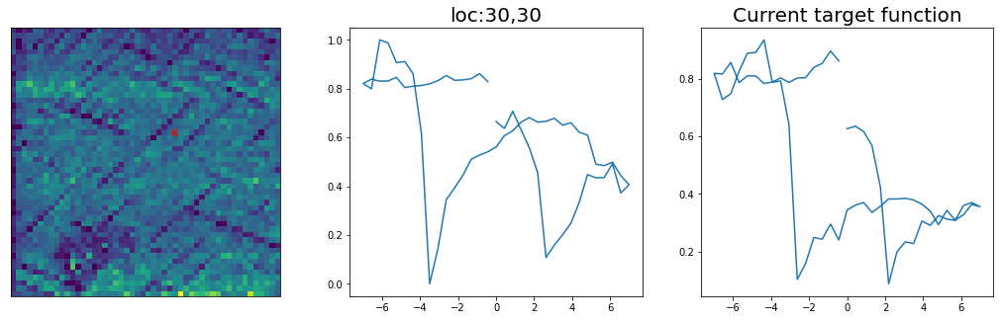

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 3, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #4


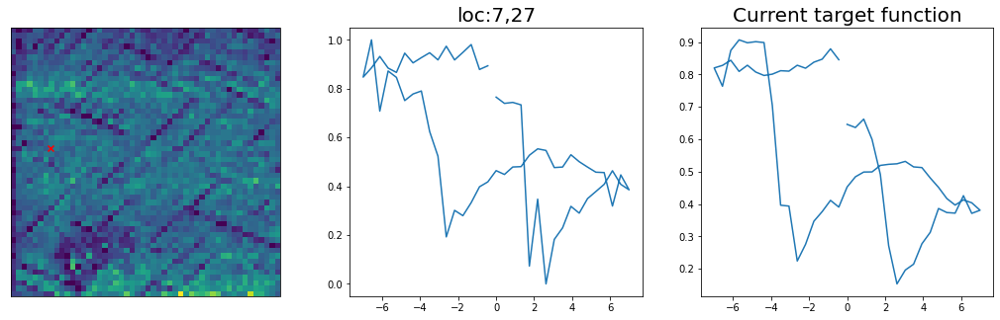

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 4, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #5


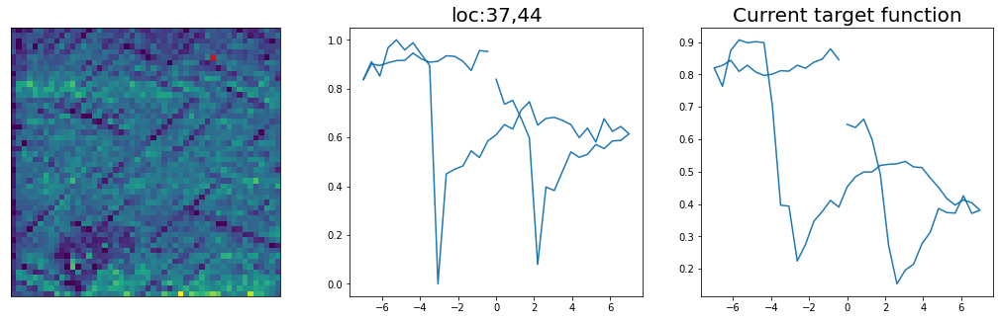

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 5, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #6


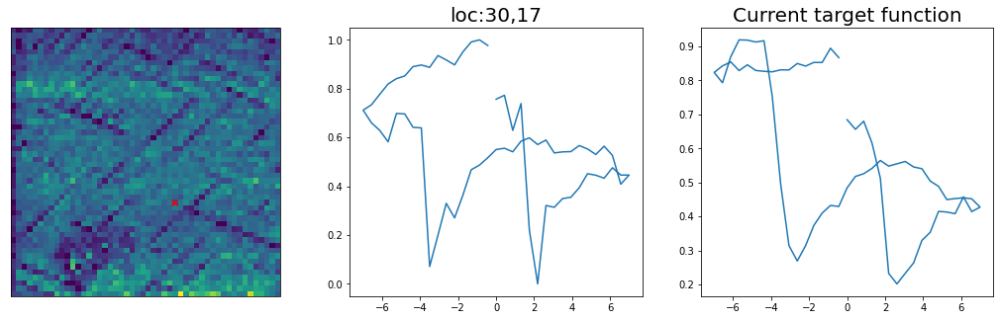

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 6, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #7


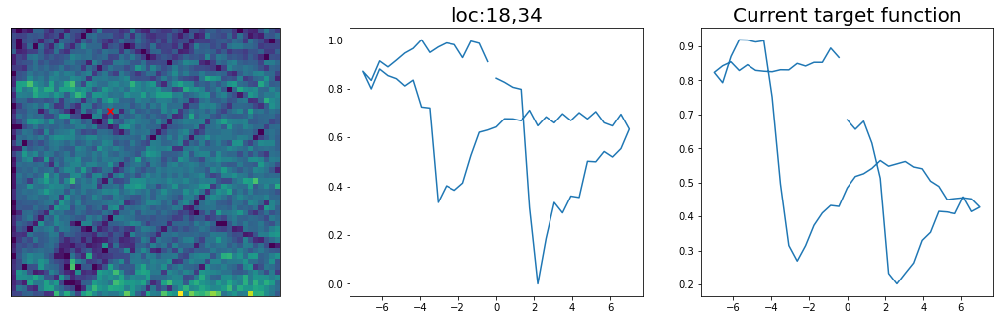

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 7, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #8


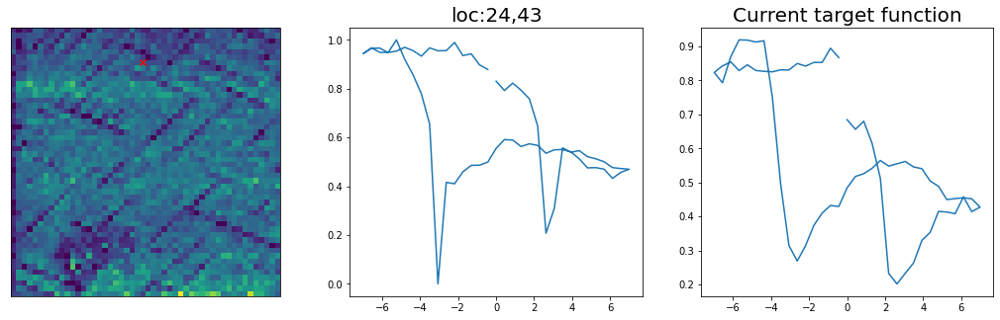

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 8, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #9


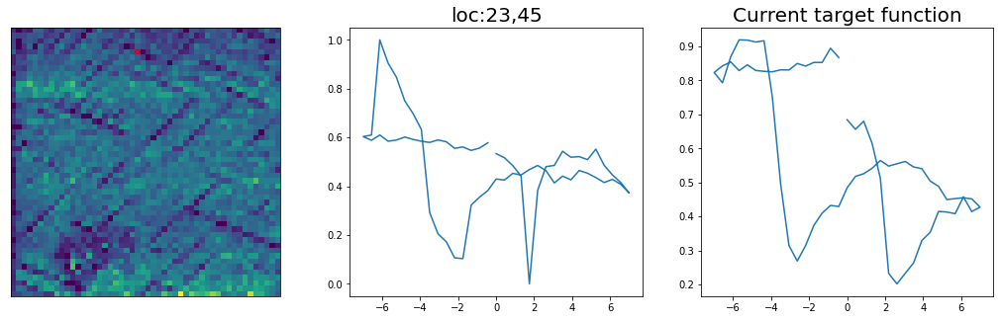

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 9, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #10


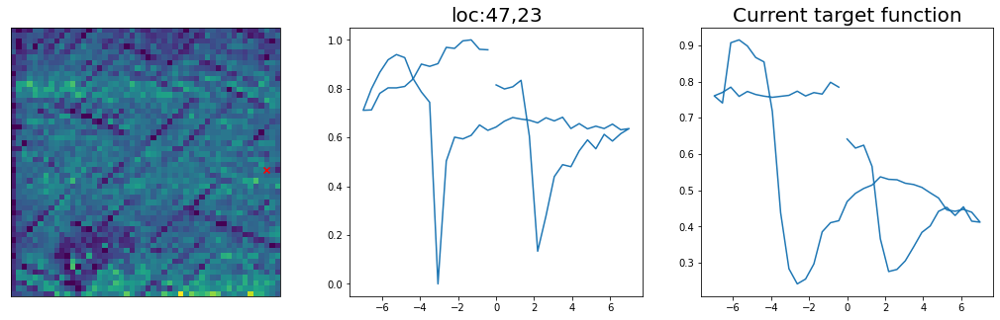

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 


In [ ]:
def return_new_measurement(full_dataset, points_measured):
    ampdat_masked = np.zeros_like(full_dataset)
    ampdat_masked[points_measured,:] = full_dataset[points_measured,:]
    return ampdat_masked, points_measured

# set parameters
IV = np.copy(amp_masked)
points_measured = np.array(idx)
last_points_measured = np.array(points_measured)
vdc = vdc_vec

train_Y = np.zeros((num_start, 1))
pref = np.zeros((num_start, 1))
init_spec = np.zeros((num_start, spec_length))
# Define a sparse grid to store evaluated spectral locations
eval_spec_y = np.zeros((img.shape[0],img.shape[0],spec_length))
#Evaluate initial training data
x = np.zeros((1,2))

# First generate target loop, based on initial training data
wcount_good= 0
target_func = np.zeros(spec_length)

mask = np.isin(points_measured, last_points_measured, invert = True)
new_points_measured = points_measured[mask]
last_points_measured = np.append(last_points_measured, new_points_measured)

for i in range(0, num_start):
    
    ##******************experiment start*******************##
    time.sleep(0.1)

    idx_x = int(train_indices[i, 0])
    idx_y = int(train_indices[i, 1])

    next_loc = np.asarray([idx_x, idx_y])
    
    print("i is {}, measurement done".format(i))
    
    mask = np.isin(points_measured, last_points_measured, invert = True)
    new_points_measured = points_measured[mask]
    last_points_measured = np.append(last_points_measured, new_points_measured)
    print('points measured {}'.format(points_measured))
    print('new_points_measured {}'.format(new_points_measured))

    new_iv = IV[last_points_measured,:]

    #new_spec_x = torch.from_numpy(vdc_vec)
    #new_spec_y = torch.from_numpy(new_iv)[i,:]

    new_spec_x = vdc_vec
    new_spec_y = new_iv[i,:]
    

    new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())

    init_spec[i,] = new_spec_y
    eval_spec_y[idx_x, idx_y, :] = new_spec_y
    print("\n\nSample #" + str(m + 1))
    pref[i, 0], wcount_good, target_func = play_varTBO.generate_targetobj(idx_x, idx_y, new_spec_x,new_spec_y, 
                                                              img, wcount_good, target_func)
    m = m + 1


# Once target loop is defined (unless are loops are selected bad by user), we compute the obj
for i in range(0, num_start):
  idx_x = int(train_indices[i, 0])
  idx_y = int(train_indices[i, 1])
  spec_y = eval_spec_y[idx_x, idx_y, :]
  #print(idx_x, idx_y, spec_y)
  train_Y[i, 0] = play_varTBO.func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good, target_func, pref[i, 0])

var_params = [wcount_good, pref, target_func]
test_X, test_X_norm, train_X, train_X_norm, train_Y, var_params, idx, m \
= X_feas, X_feas_norm, train_X, train_X_norm, train_Y, var_params, idx, m


In [ ]:
train_Y

array([[1.41914762],
       [1.5633236 ],
       [2.74668432],
       [0.49160942],
       [1.64459959],
       [0.5916148 ],
       [0.61730717],
       [0.60482012],
       [2.59947537],
       [2.72793544]])

# Initial evaluation complete. Start BO

Epoch 1/200 ... Training loss: 1.6184
Epoch 10/200 ... Training loss: 1.5306
Epoch 20/200 ... Training loss: 1.3342
Epoch 30/200 ... Training loss: 1.2236
Epoch 40/200 ... Training loss: 1.1497
Epoch 50/200 ... Training loss: 1.0887
Epoch 60/200 ... Training loss: 1.0334
Epoch 70/200 ... Training loss: 0.9824
Epoch 80/200 ... Training loss: 0.9344
Epoch 90/200 ... Training loss: 0.8884
Epoch 100/200 ... Training loss: 0.8439
Epoch 110/200 ... Training loss: 0.8004
Epoch 120/200 ... Training loss: 0.7576
Epoch 130/200 ... Training loss: 0.7152
Epoch 140/200 ... Training loss: 0.6732
Epoch 150/200 ... Training loss: 0.6315
Epoch 160/200 ... Training loss: 0.59
Epoch 170/200 ... Training loss: 0.5486
Epoch 180/200 ... Training loss: 0.5075
Epoch 190/200 ... Training loss: 0.4665
Epoch 200/200 ... Training loss: 0.4256
step:  1
Sample #11




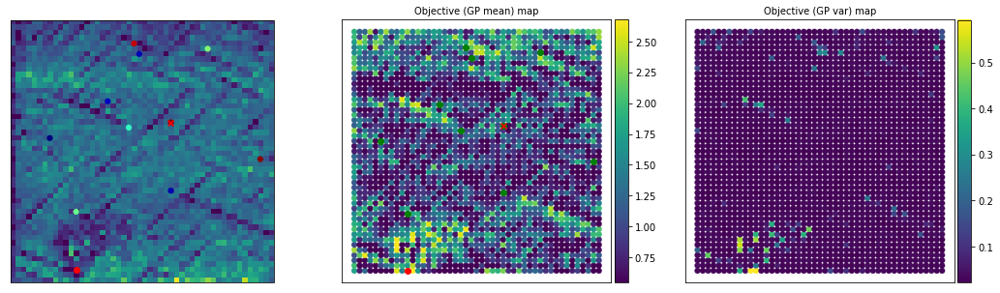

Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: 
User still searching for best target. Continue BO with human interaction...


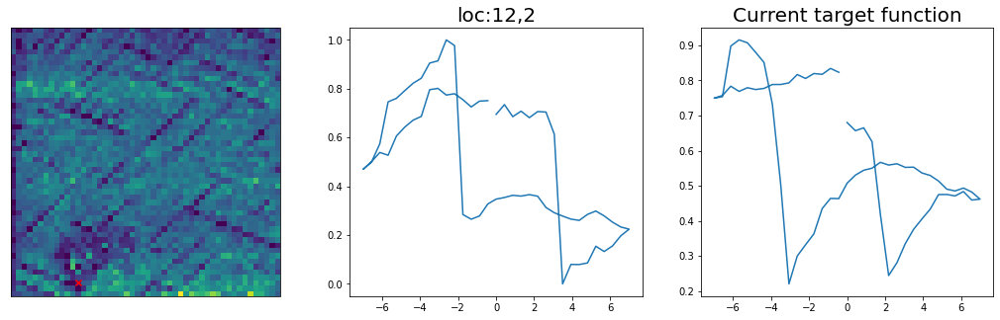

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Epoch 1/200 ... Training loss: 1.6423
Epoch 10/200 ... Training loss: 1.4847
Epoch 20/200 ... Training loss: 1.2836
Epoch 30/200 ... Training loss: 1.1696
Epoch 40/200 ... Training loss: 1.0923
Epoch 50/200 ... Training loss: 1.0332
Epoch 60/200 ... Training loss: 0.9797
Epoch 70/200 ... Training loss: 0.93
Epoch 80/200 ... Training loss: 0.883
Epoch 90/200 ... Training loss: 0.8377
Epoch 100/200 ... Training loss: 0.7935
Epoch 110/200 ... Training loss: 0.75
Epoch 120/200 ... Training loss: 0.7071
Epoch 130/200 ... Training loss: 0.6645
Epoch 140/200 ... Training loss: 0.6221
Epoch 150/200 ... Training loss: 0.5799
Epoch 160/200 ... Training loss: 0.5387
Epoch 170/200 ... Training loss: 0.4968
Epoch 180/200 ... Training loss: 0.4543
Epoch 190/200 ... Training loss: 0.4125
Epoch 200/200 ... Training loss: 0.37

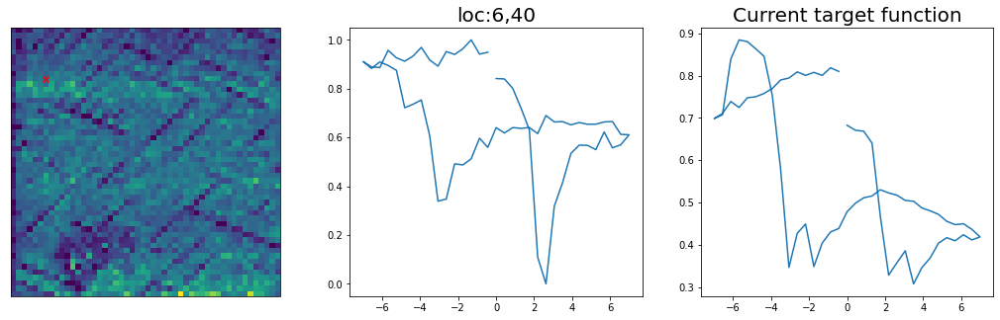

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
Epoch 1/200 ... Training loss: 1.5868
Epoch 10/200 ... Training loss: 1.4002
Epoch 20/200 ... Training loss: 1.2686
Epoch 30/200 ... Training loss: 1.144
Epoch 40/200 ... Training loss: 1.0662
Epoch 50/200 ... Training loss: 1.0181
Epoch 60/200 ... Training loss: 0.9474
Epoch 70/200 ... Training loss: 0.8955
Epoch 80/200 ... Training loss: 0.8467
Epoch 90/200 ... Training loss: 0.8
Epoch 100/200 ... Training loss: 0.7545
Epoch 110/200 ... Training loss: 0.7098
Epoch 120/200 ... Training loss: 0.6657
Epoch 130/200 ... Training loss: 0.6218
Epoch 140/200 ... Training loss: 0.5784
Epoch 150/200 ... Training loss: 0.5349
Epoch 160/200 ... Training loss: 0.4907
Epoch 170/200 ... Training loss: 0.4462
Epoch 180/200 ... Training loss: 0.4028
Epoch 190/200 ... Training loss: 0.3595
Epoch 200/200 ... Training loss: 0.3164
step:  3
Sample #13




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: 
User still searching for best target. Continue BO with human interaction...


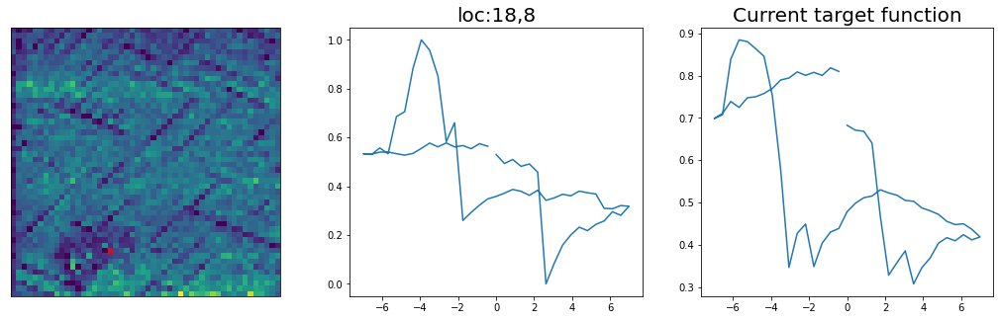

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Epoch 1/200 ... Training loss: 1.6014
Epoch 10/200 ... Training loss: 1.3403
Epoch 20/200 ... Training loss: 1.1817
Epoch 30/200 ... Training loss: 1.0881
Epoch 40/200 ... Training loss: 1.0207
Epoch 50/200 ... Training loss: 0.9622
Epoch 60/200 ... Training loss: 0.9096
Epoch 70/200 ... Training loss: 0.8606
Epoch 80/200 ... Training loss: 0.8137
Epoch 90/200 ... Training loss: 0.7682
Epoch 100/200 ... Training loss: 0.7237
Epoch 110/200 ... Training loss: 0.6797
Epoch 120/200 ... Training loss: 0.6361
Epoch 130/200 ... Training loss: 0.5929
Epoch 140/200 ... Training loss: 0.5501
Epoch 150/200 ... Training loss: 0.5068
Epoch 160/200 ... Training loss: 0.4633
Epoch 170/200 ... Training loss: 0.4203
Epoch 180/200 ... Training loss: 0.3786
Epoch 190/200 ... Training loss: 0.3404
Epoch 200/200 ... Training loss:

/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: y
Spectral target now fixed. Continue automated BO...


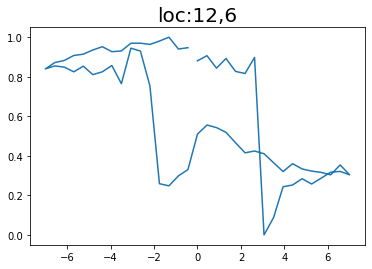

Epoch 1/200 ... Training loss: 3.1617
Epoch 10/200 ... Training loss: 2.7801
Epoch 20/200 ... Training loss: 2.56
Epoch 30/200 ... Training loss: 2.3323
Epoch 40/200 ... Training loss: 2.168
Epoch 50/200 ... Training loss: 2.0308
Epoch 60/200 ... Training loss: 1.9187
Epoch 70/200 ... Training loss: 1.8229
Epoch 80/200 ... Training loss: 1.7174
Epoch 90/200 ... Training loss: 1.6157
Epoch 100/200 ... Training loss: 1.4578
Epoch 110/200 ... Training loss: 1.337
Epoch 120/200 ... Training loss: 1.2273
Epoch 130/200 ... Training loss: 1.1274
Epoch 140/200 ... Training loss: 1.0342
Epoch 150/200 ... Training loss: 0.9466
Epoch 160/200 ... Training loss: 0.8647
Epoch 170/200 ... Training loss: 0.7806
Epoch 180/200 ... Training loss: 0.702
Epoch 190/200 ... Training loss: 0.6296
Epoch 200/200 ... Training loss: 0.5746
step:  5
Sample #15




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


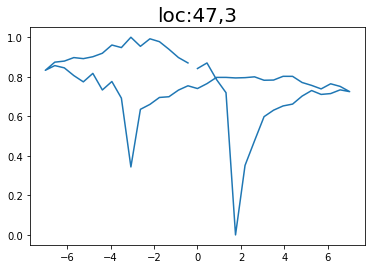

Epoch 1/200 ... Training loss: 3.0523
Epoch 10/200 ... Training loss: 2.7214
Epoch 20/200 ... Training loss: 2.4444
Epoch 30/200 ... Training loss: 2.2351
Epoch 40/200 ... Training loss: 2.0936
Epoch 50/200 ... Training loss: 1.9465
Epoch 60/200 ... Training loss: 1.8346
Epoch 70/200 ... Training loss: 1.7399
Epoch 80/200 ... Training loss: 1.6385
Epoch 90/200 ... Training loss: 1.5096
Epoch 100/200 ... Training loss: 1.3383
Epoch 110/200 ... Training loss: 1.2288
Epoch 120/200 ... Training loss: 1.1046
Epoch 130/200 ... Training loss: 0.9941
Epoch 140/200 ... Training loss: 0.8906
Epoch 150/200 ... Training loss: 0.7946
Epoch 160/200 ... Training loss: 0.7037
Epoch 170/200 ... Training loss: 0.6262
Epoch 180/200 ... Training loss: 0.5376
Epoch 190/200 ... Training loss: 0.4543
Epoch 200/200 ... Training loss: 0.3796
step:  6
Sample #16




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


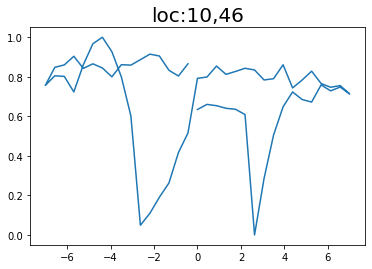

Epoch 1/200 ... Training loss: 2.9362
Epoch 10/200 ... Training loss: 2.6432
Epoch 20/200 ... Training loss: 2.3536
Epoch 30/200 ... Training loss: 2.1579
Epoch 40/200 ... Training loss: 2.0046
Epoch 50/200 ... Training loss: 1.8758
Epoch 60/200 ... Training loss: 1.7664
Epoch 70/200 ... Training loss: 1.6653
Epoch 80/200 ... Training loss: 1.5408
Epoch 90/200 ... Training loss: 1.4188
Epoch 100/200 ... Training loss: 1.306
Epoch 110/200 ... Training loss: 1.203
Epoch 120/200 ... Training loss: 1.1102
Epoch 130/200 ... Training loss: 1.0182
Epoch 140/200 ... Training loss: 0.9365
Epoch 150/200 ... Training loss: 0.8595
Epoch 160/200 ... Training loss: 0.801
Epoch 170/200 ... Training loss: 0.7228
Epoch 180/200 ... Training loss: 0.6482
Epoch 190/200 ... Training loss: 0.5818
Epoch 200/200 ... Training loss: 0.5121
step:  7
Sample #17




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


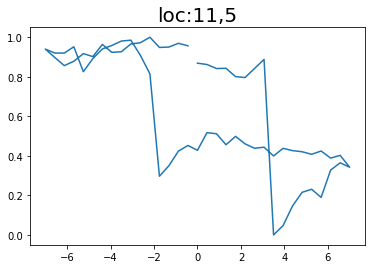

Epoch 1/200 ... Training loss: 2.8251
Epoch 10/200 ... Training loss: 2.4615
Epoch 20/200 ... Training loss: 2.2535
Epoch 30/200 ... Training loss: 2.0858
Epoch 40/200 ... Training loss: 1.9478
Epoch 50/200 ... Training loss: 1.8113
Epoch 60/200 ... Training loss: 1.6895
Epoch 70/200 ... Training loss: 1.5718
Epoch 80/200 ... Training loss: 1.4407
Epoch 90/200 ... Training loss: 1.3089
Epoch 100/200 ... Training loss: 1.1998
Epoch 110/200 ... Training loss: 1.0986
Epoch 120/200 ... Training loss: 1.0031
Epoch 130/200 ... Training loss: 0.9175
Epoch 140/200 ... Training loss: 0.8269
Epoch 150/200 ... Training loss: 0.7461
Epoch 160/200 ... Training loss: 0.665
Epoch 170/200 ... Training loss: 0.5927
Epoch 180/200 ... Training loss: 0.5223
Epoch 190/200 ... Training loss: 0.4531
Epoch 200/200 ... Training loss: 0.3866
step:  8
Sample #18




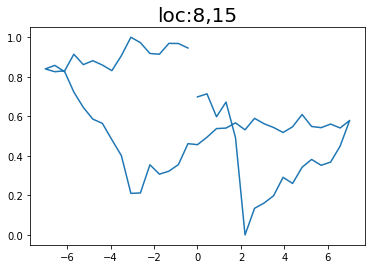

Epoch 1/200 ... Training loss: 2.7193
Epoch 10/200 ... Training loss: 2.4032
Epoch 20/200 ... Training loss: 2.1742
Epoch 30/200 ... Training loss: 2.0179
Epoch 40/200 ... Training loss: 1.886
Epoch 50/200 ... Training loss: 1.7391
Epoch 60/200 ... Training loss: 1.6226
Epoch 70/200 ... Training loss: 1.5145
Epoch 80/200 ... Training loss: 1.4025
Epoch 90/200 ... Training loss: 1.2751
Epoch 100/200 ... Training loss: 1.1669
Epoch 110/200 ... Training loss: 1.0614
Epoch 120/200 ... Training loss: 0.9667
Epoch 130/200 ... Training loss: 0.8788
Epoch 140/200 ... Training loss: 0.7953
Epoch 150/200 ... Training loss: 0.7198
Epoch 160/200 ... Training loss: 0.6351
Epoch 170/200 ... Training loss: 0.5594
Epoch 180/200 ... Training loss: 0.4854
Epoch 190/200 ... Training loss: 0.4151
Epoch 200/200 ... Training loss: 0.364
step:  9
Sample #19




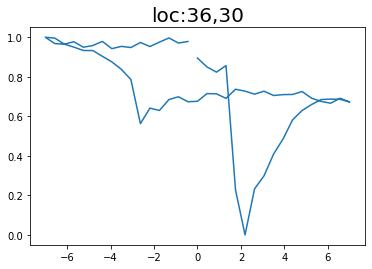

Epoch 1/200 ... Training loss: 2.6172
Epoch 10/200 ... Training loss: 2.3167
Epoch 20/200 ... Training loss: 2.0969
Epoch 30/200 ... Training loss: 1.9449
Epoch 40/200 ... Training loss: 1.8143
Epoch 50/200 ... Training loss: 1.6757
Epoch 60/200 ... Training loss: 1.5449
Epoch 70/200 ... Training loss: 1.5008
Epoch 80/200 ... Training loss: 1.3987
Epoch 90/200 ... Training loss: 1.3035
Epoch 100/200 ... Training loss: 1.203
Epoch 110/200 ... Training loss: 1.0851
Epoch 120/200 ... Training loss: 0.9613
Epoch 130/200 ... Training loss: 0.8514
Epoch 140/200 ... Training loss: 0.7504
Epoch 150/200 ... Training loss: 0.6628
Epoch 160/200 ... Training loss: 0.5829
Epoch 170/200 ... Training loss: 0.4973
Epoch 180/200 ... Training loss: 0.422
Epoch 190/200 ... Training loss: 0.3564
Epoch 200/200 ... Training loss: 0.2975
step:  10
Sample #20




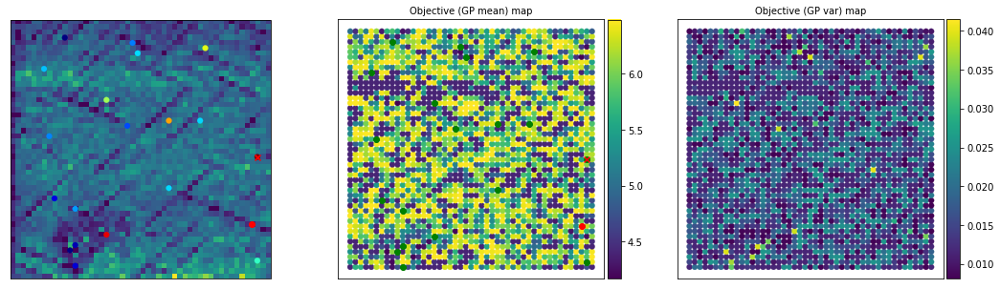

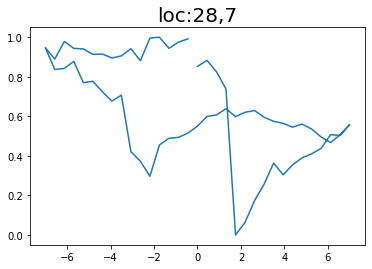

Epoch 1/200 ... Training loss: 2.5173
Epoch 10/200 ... Training loss: 2.2501
Epoch 20/200 ... Training loss: 2.0438
Epoch 30/200 ... Training loss: 1.8988
Epoch 40/200 ... Training loss: 1.7803
Epoch 50/200 ... Training loss: 1.6708
Epoch 60/200 ... Training loss: 1.5592
Epoch 70/200 ... Training loss: 1.4333
Epoch 80/200 ... Training loss: 1.3292
Epoch 90/200 ... Training loss: 1.2279
Epoch 100/200 ... Training loss: 1.1017
Epoch 110/200 ... Training loss: 0.9792
Epoch 120/200 ... Training loss: 0.878
Epoch 130/200 ... Training loss: 0.7873
Epoch 140/200 ... Training loss: 0.705
Epoch 150/200 ... Training loss: 0.6227
Epoch 160/200 ... Training loss: 0.5564
Epoch 170/200 ... Training loss: 0.5127
Epoch 180/200 ... Training loss: 0.4165
Epoch 190/200 ... Training loss: 0.3433
Epoch 200/200 ... Training loss: 0.2715
step:  11
Sample #21




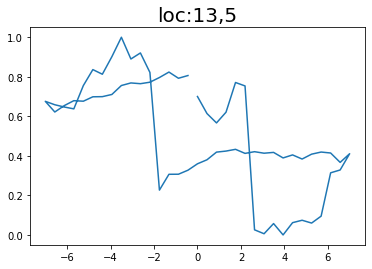

Epoch 1/200 ... Training loss: 2.4338
Epoch 10/200 ... Training loss: 2.1901
Epoch 20/200 ... Training loss: 1.9728
Epoch 30/200 ... Training loss: 1.8325
Epoch 40/200 ... Training loss: 1.7183
Epoch 50/200 ... Training loss: 1.6149
Epoch 60/200 ... Training loss: 1.516
Epoch 70/200 ... Training loss: 1.4165
Epoch 80/200 ... Training loss: 1.2919
Epoch 90/200 ... Training loss: 1.2048
Epoch 100/200 ... Training loss: 1.1328
Epoch 110/200 ... Training loss: 0.975
Epoch 120/200 ... Training loss: 0.9048
Epoch 130/200 ... Training loss: 0.7582
Epoch 140/200 ... Training loss: 0.6601
Epoch 150/200 ... Training loss: 0.5706
Epoch 160/200 ... Training loss: 0.4856
Epoch 170/200 ... Training loss: 0.4178
Epoch 180/200 ... Training loss: 0.3378
Epoch 190/200 ... Training loss: 0.2614
Epoch 200/200 ... Training loss: 0.2222
step:  12
Sample #22




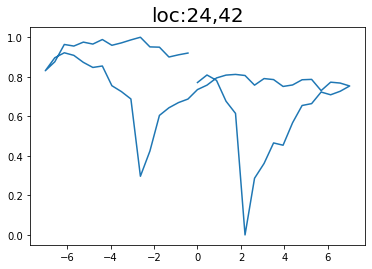

Epoch 1/200 ... Training loss: 2.3648
Epoch 10/200 ... Training loss: 2.0893
Epoch 20/200 ... Training loss: 1.9139
Epoch 30/200 ... Training loss: 1.7793
Epoch 40/200 ... Training loss: 1.6584
Epoch 50/200 ... Training loss: 1.5347
Epoch 60/200 ... Training loss: 1.4436
Epoch 70/200 ... Training loss: 1.3407
Epoch 80/200 ... Training loss: 1.2472
Epoch 90/200 ... Training loss: 1.1604
Epoch 100/200 ... Training loss: 1.0746
Epoch 110/200 ... Training loss: 1.0179
Epoch 120/200 ... Training loss: 0.9048
Epoch 130/200 ... Training loss: 0.7651
Epoch 140/200 ... Training loss: 0.6726
Epoch 150/200 ... Training loss: 0.5832
Epoch 160/200 ... Training loss: 0.4895
Epoch 170/200 ... Training loss: 0.4058
Epoch 180/200 ... Training loss: 0.382
Epoch 190/200 ... Training loss: 0.2701
Epoch 200/200 ... Training loss: 0.191
step:  13
Sample #23




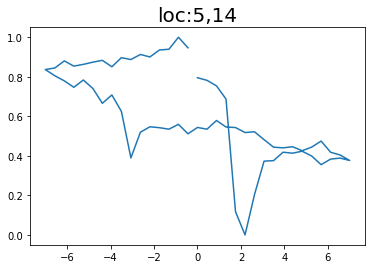

Epoch 1/200 ... Training loss: 2.2954
Epoch 10/200 ... Training loss: 2.0294
Epoch 20/200 ... Training loss: 1.8613
Epoch 30/200 ... Training loss: 1.7309
Epoch 40/200 ... Training loss: 1.6174
Epoch 50/200 ... Training loss: 1.5061
Epoch 60/200 ... Training loss: 1.4177
Epoch 70/200 ... Training loss: 1.3516
Epoch 80/200 ... Training loss: 1.238
Epoch 90/200 ... Training loss: 1.1572
Epoch 100/200 ... Training loss: 1.0686
Epoch 110/200 ... Training loss: 0.9562
Epoch 120/200 ... Training loss: 0.8187
Epoch 130/200 ... Training loss: 0.7212
Epoch 140/200 ... Training loss: 0.6234
Epoch 150/200 ... Training loss: 0.5366
Epoch 160/200 ... Training loss: 0.4661
Epoch 170/200 ... Training loss: 0.3726
Epoch 180/200 ... Training loss: 0.3017
Epoch 190/200 ... Training loss: 0.2384
Epoch 200/200 ... Training loss: 0.2206
step:  14
Sample #24




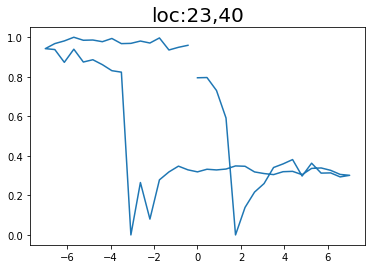

Epoch 1/200 ... Training loss: 2.2408
Epoch 10/200 ... Training loss: 2.0175
Epoch 20/200 ... Training loss: 1.8273
Epoch 30/200 ... Training loss: 1.6991
Epoch 40/200 ... Training loss: 1.5814
Epoch 50/200 ... Training loss: 1.4436
Epoch 60/200 ... Training loss: 1.3285
Epoch 70/200 ... Training loss: 1.2186
Epoch 80/200 ... Training loss: 1.1096
Epoch 90/200 ... Training loss: 0.9933
Epoch 100/200 ... Training loss: 0.8969
Epoch 110/200 ... Training loss: 0.8025
Epoch 120/200 ... Training loss: 0.7368
Epoch 130/200 ... Training loss: 0.6429
Epoch 140/200 ... Training loss: 0.5639
Epoch 150/200 ... Training loss: 0.4833
Epoch 160/200 ... Training loss: 0.4208
Epoch 170/200 ... Training loss: 0.3462
Epoch 180/200 ... Training loss: 0.2777
Epoch 190/200 ... Training loss: 0.2095
Epoch 200/200 ... Training loss: 0.1621
step:  15
Sample #25




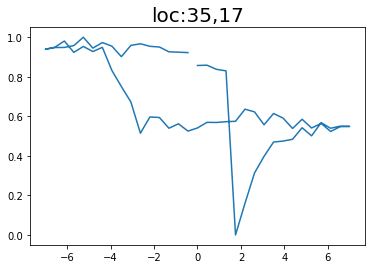

Epoch 1/200 ... Training loss: 2.1835
Epoch 10/200 ... Training loss: 1.9739
Epoch 20/200 ... Training loss: 1.7842
Epoch 30/200 ... Training loss: 1.6521
Epoch 40/200 ... Training loss: 1.5357
Epoch 50/200 ... Training loss: 1.4005
Epoch 60/200 ... Training loss: 1.2915
Epoch 70/200 ... Training loss: 1.1817
Epoch 80/200 ... Training loss: 1.0739
Epoch 90/200 ... Training loss: 0.9652
Epoch 100/200 ... Training loss: 0.8786
Epoch 110/200 ... Training loss: 0.7875
Epoch 120/200 ... Training loss: 0.7138
Epoch 130/200 ... Training loss: 0.6298
Epoch 140/200 ... Training loss: 0.5518
Epoch 150/200 ... Training loss: 0.4808
Epoch 160/200 ... Training loss: 0.4278
Epoch 170/200 ... Training loss: 0.349
Epoch 180/200 ... Training loss: 0.2761
Epoch 190/200 ... Training loss: 0.2097
Epoch 200/200 ... Training loss: 0.1538
step:  16
Sample #26




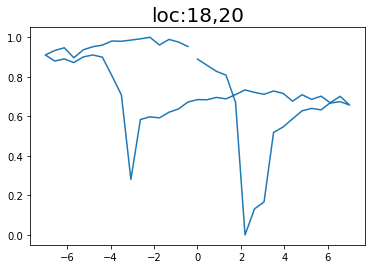

Epoch 1/200 ... Training loss: 2.1661
Epoch 10/200 ... Training loss: 1.9381
Epoch 20/200 ... Training loss: 1.7791
Epoch 30/200 ... Training loss: 1.6469
Epoch 40/200 ... Training loss: 1.5055
Epoch 50/200 ... Training loss: 1.3766
Epoch 60/200 ... Training loss: 1.2625
Epoch 70/200 ... Training loss: 1.1482
Epoch 80/200 ... Training loss: 1.042
Epoch 90/200 ... Training loss: 0.9405
Epoch 100/200 ... Training loss: 0.8456
Epoch 110/200 ... Training loss: 0.7612
Epoch 120/200 ... Training loss: 0.6884
Epoch 130/200 ... Training loss: 0.6128
Epoch 140/200 ... Training loss: 0.5444
Epoch 150/200 ... Training loss: 0.4707
Epoch 160/200 ... Training loss: 0.4025
Epoch 170/200 ... Training loss: 0.3293
Epoch 180/200 ... Training loss: 0.2653
Epoch 190/200 ... Training loss: 0.1987
Epoch 200/200 ... Training loss: 0.1418
step:  17
Sample #27




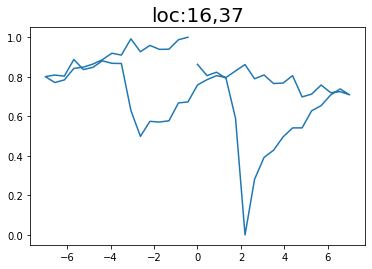

Epoch 1/200 ... Training loss: 2.129
Epoch 10/200 ... Training loss: 1.9295
Epoch 20/200 ... Training loss: 1.7526
Epoch 30/200 ... Training loss: 1.6151
Epoch 40/200 ... Training loss: 1.4675
Epoch 50/200 ... Training loss: 1.3421
Epoch 60/200 ... Training loss: 1.2254
Epoch 70/200 ... Training loss: 1.1145
Epoch 80/200 ... Training loss: 1.0118
Epoch 90/200 ... Training loss: 0.9071
Epoch 100/200 ... Training loss: 0.8207
Epoch 110/200 ... Training loss: 0.7396
Epoch 120/200 ... Training loss: 0.6639
Epoch 130/200 ... Training loss: 0.5999
Epoch 140/200 ... Training loss: 0.5248
Epoch 150/200 ... Training loss: 0.4498
Epoch 160/200 ... Training loss: 0.3831
Epoch 170/200 ... Training loss: 0.3242
Epoch 180/200 ... Training loss: 0.2586
Epoch 190/200 ... Training loss: 0.2012
Epoch 200/200 ... Training loss: 0.1326
step:  18
Sample #28




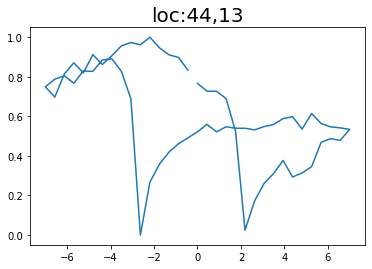

Epoch 1/200 ... Training loss: 2.0811
Epoch 10/200 ... Training loss: 1.8588
Epoch 20/200 ... Training loss: 1.7123
Epoch 30/200 ... Training loss: 1.5691
Epoch 40/200 ... Training loss: 1.4255
Epoch 50/200 ... Training loss: 1.2959
Epoch 60/200 ... Training loss: 1.1843
Epoch 70/200 ... Training loss: 1.0828
Epoch 80/200 ... Training loss: 0.9845
Epoch 90/200 ... Training loss: 0.892
Epoch 100/200 ... Training loss: 0.8102
Epoch 110/200 ... Training loss: 0.7343
Epoch 120/200 ... Training loss: 0.6704
Epoch 130/200 ... Training loss: 0.5956
Epoch 140/200 ... Training loss: 0.5203
Epoch 150/200 ... Training loss: 0.454
Epoch 160/200 ... Training loss: 0.3922
Epoch 170/200 ... Training loss: 0.3322
Epoch 180/200 ... Training loss: 0.2654
Epoch 190/200 ... Training loss: 0.2125
Epoch 200/200 ... Training loss: 0.15
step:  19
Sample #29




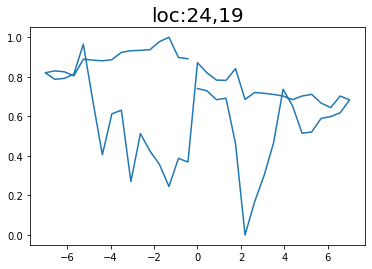

Epoch 1/200 ... Training loss: 2.0444
Epoch 10/200 ... Training loss: 1.8314
Epoch 20/200 ... Training loss: 1.686
Epoch 30/200 ... Training loss: 1.5514
Epoch 40/200 ... Training loss: 1.4073
Epoch 50/200 ... Training loss: 1.2813
Epoch 60/200 ... Training loss: 1.1706
Epoch 70/200 ... Training loss: 1.0668
Epoch 80/200 ... Training loss: 0.9645
Epoch 90/200 ... Training loss: 0.8846
Epoch 100/200 ... Training loss: 0.7933
Epoch 110/200 ... Training loss: 0.7156
Epoch 120/200 ... Training loss: 0.6427
Epoch 130/200 ... Training loss: 0.572
Epoch 140/200 ... Training loss: 0.5031
Epoch 150/200 ... Training loss: 0.4374
Epoch 160/200 ... Training loss: 0.3789
Epoch 170/200 ... Training loss: 0.3037
Epoch 180/200 ... Training loss: 0.2542
Epoch 190/200 ... Training loss: 0.1865
Epoch 200/200 ... Training loss: 0.1243
step:  20
Sample #30




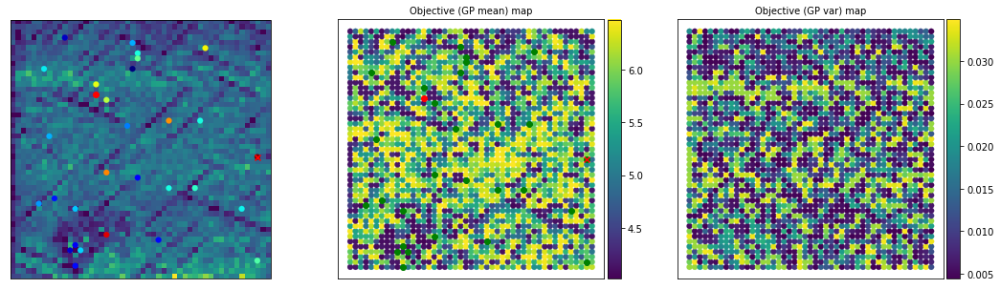

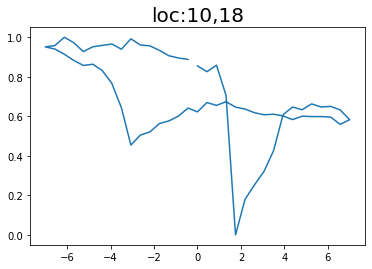

Epoch 1/200 ... Training loss: 2.0075
Epoch 10/200 ... Training loss: 1.816
Epoch 20/200 ... Training loss: 1.6709
Epoch 30/200 ... Training loss: 1.5511
Epoch 40/200 ... Training loss: 1.4238
Epoch 50/200 ... Training loss: 1.3188
Epoch 60/200 ... Training loss: 1.2084
Epoch 70/200 ... Training loss: 1.0648
Epoch 80/200 ... Training loss: 0.9581
Epoch 90/200 ... Training loss: 0.8657
Epoch 100/200 ... Training loss: 0.7883
Epoch 110/200 ... Training loss: 0.6989
Epoch 120/200 ... Training loss: 0.6176
Epoch 130/200 ... Training loss: 0.5609
Epoch 140/200 ... Training loss: 0.4768
Epoch 150/200 ... Training loss: 0.4112
Epoch 160/200 ... Training loss: 0.3352
Epoch 170/200 ... Training loss: 0.2786
Epoch 180/200 ... Training loss: 0.2528
Epoch 190/200 ... Training loss: 0.1743
Epoch 200/200 ... Training loss: 0.1127
step:  21
Sample #31




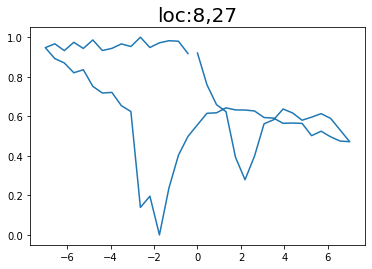

Epoch 1/200 ... Training loss: 1.9843
Epoch 10/200 ... Training loss: 1.8174
Epoch 20/200 ... Training loss: 1.6654
Epoch 30/200 ... Training loss: 1.5606
Epoch 40/200 ... Training loss: 1.462
Epoch 50/200 ... Training loss: 1.3384
Epoch 60/200 ... Training loss: 1.2166
Epoch 70/200 ... Training loss: 1.1811
Epoch 80/200 ... Training loss: 1.0602
Epoch 90/200 ... Training loss: 0.9116
Epoch 100/200 ... Training loss: 0.8547
Epoch 110/200 ... Training loss: 0.7111
Epoch 120/200 ... Training loss: 0.6195
Epoch 130/200 ... Training loss: 0.5309
Epoch 140/200 ... Training loss: 0.4619
Epoch 150/200 ... Training loss: 0.3935
Epoch 160/200 ... Training loss: 0.3049
Epoch 170/200 ... Training loss: 0.2293
Epoch 180/200 ... Training loss: 0.1638
Epoch 190/200 ... Training loss: 0.1044
Epoch 200/200 ... Training loss: 0.0342
step:  22
Sample #32




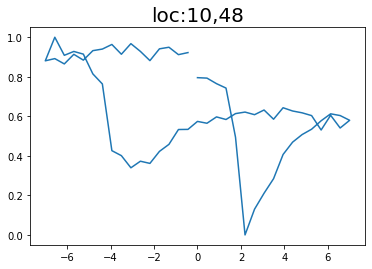

Epoch 1/200 ... Training loss: 1.947
Epoch 10/200 ... Training loss: 1.7578
Epoch 20/200 ... Training loss: 1.6364
Epoch 30/200 ... Training loss: 1.5344
Epoch 40/200 ... Training loss: 1.4356
Epoch 50/200 ... Training loss: 1.3322
Epoch 60/200 ... Training loss: 1.232
Epoch 70/200 ... Training loss: 1.0852
Epoch 80/200 ... Training loss: 0.9419
Epoch 90/200 ... Training loss: 0.8449
Epoch 100/200 ... Training loss: 0.7641
Epoch 110/200 ... Training loss: 0.6746
Epoch 120/200 ... Training loss: 0.5871
Epoch 130/200 ... Training loss: 0.512
Epoch 140/200 ... Training loss: 0.4477
Epoch 150/200 ... Training loss: 0.3691
Epoch 160/200 ... Training loss: 0.2962
Epoch 170/200 ... Training loss: 0.2526
Epoch 180/200 ... Training loss: 0.1888
Epoch 190/200 ... Training loss: 0.1333
Epoch 200/200 ... Training loss: 0.0517
step:  23
Sample #33




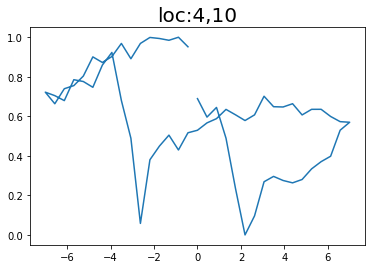

Epoch 1/200 ... Training loss: 1.9109
Epoch 10/200 ... Training loss: 1.7316
Epoch 20/200 ... Training loss: 1.6058
Epoch 30/200 ... Training loss: 1.5044
Epoch 40/200 ... Training loss: 1.4021
Epoch 50/200 ... Training loss: 1.307
Epoch 60/200 ... Training loss: 1.2071
Epoch 70/200 ... Training loss: 1.0667
Epoch 80/200 ... Training loss: 0.9616
Epoch 90/200 ... Training loss: 0.871
Epoch 100/200 ... Training loss: 0.7709
Epoch 110/200 ... Training loss: 0.6712
Epoch 120/200 ... Training loss: 0.5874
Epoch 130/200 ... Training loss: 0.546
Epoch 140/200 ... Training loss: 0.4429
Epoch 150/200 ... Training loss: 0.3788
Epoch 160/200 ... Training loss: 0.3132
Epoch 170/200 ... Training loss: 0.2294
Epoch 180/200 ... Training loss: 0.1841
Epoch 190/200 ... Training loss: 0.1423
Epoch 200/200 ... Training loss: 0.0855
step:  24
Sample #34




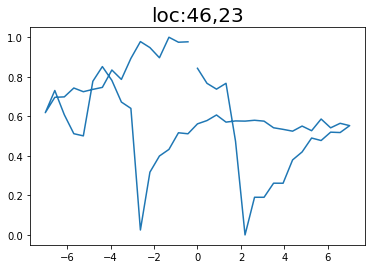

Epoch 1/200 ... Training loss: 1.8774
Epoch 10/200 ... Training loss: 1.7055
Epoch 20/200 ... Training loss: 1.5811
Epoch 30/200 ... Training loss: 1.4846
Epoch 40/200 ... Training loss: 1.3898
Epoch 50/200 ... Training loss: 1.2922
Epoch 60/200 ... Training loss: 1.1885
Epoch 70/200 ... Training loss: 1.0469
Epoch 80/200 ... Training loss: 0.9337
Epoch 90/200 ... Training loss: 0.8492
Epoch 100/200 ... Training loss: 0.7537
Epoch 110/200 ... Training loss: 0.6615
Epoch 120/200 ... Training loss: 0.5725
Epoch 130/200 ... Training loss: 0.5004
Epoch 140/200 ... Training loss: 0.4374
Epoch 150/200 ... Training loss: 0.3757
Epoch 160/200 ... Training loss: 0.2983
Epoch 170/200 ... Training loss: 0.2852
Epoch 180/200 ... Training loss: 0.2191
Epoch 190/200 ... Training loss: 0.121
Epoch 200/200 ... Training loss: 0.0489
step:  25
Sample #35




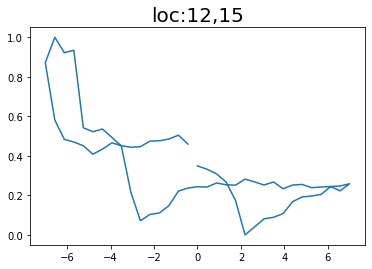

Epoch 1/200 ... Training loss: 1.8467
Epoch 10/200 ... Training loss: 1.6879
Epoch 20/200 ... Training loss: 1.5555
Epoch 30/200 ... Training loss: 1.4613
Epoch 40/200 ... Training loss: 1.3723
Epoch 50/200 ... Training loss: 1.2776
Epoch 60/200 ... Training loss: 1.1767
Epoch 70/200 ... Training loss: 1.0443
Epoch 80/200 ... Training loss: 0.9479
Epoch 90/200 ... Training loss: 0.8576
Epoch 100/200 ... Training loss: 0.7641
Epoch 110/200 ... Training loss: 0.6662
Epoch 120/200 ... Training loss: 0.6137
Epoch 130/200 ... Training loss: 0.5244
Epoch 140/200 ... Training loss: 0.4435
Epoch 150/200 ... Training loss: 0.3839
Epoch 160/200 ... Training loss: 0.3117
Epoch 170/200 ... Training loss: 0.3073
Epoch 180/200 ... Training loss: 0.2009
Epoch 190/200 ... Training loss: 0.1283
Epoch 200/200 ... Training loss: 0.0598
step:  26
Sample #36




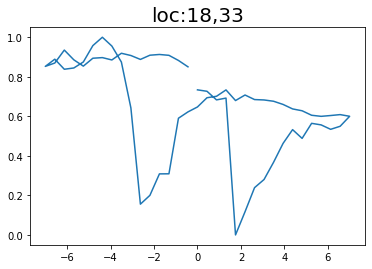

Epoch 1/200 ... Training loss: 1.8272
Epoch 10/200 ... Training loss: 1.6822
Epoch 20/200 ... Training loss: 1.5466
Epoch 30/200 ... Training loss: 1.4493
Epoch 40/200 ... Training loss: 1.3579
Epoch 50/200 ... Training loss: 1.2621
Epoch 60/200 ... Training loss: 1.1567
Epoch 70/200 ... Training loss: 1.0369
Epoch 80/200 ... Training loss: 0.9445
Epoch 90/200 ... Training loss: 0.8414
Epoch 100/200 ... Training loss: 0.7435
Epoch 110/200 ... Training loss: 0.6888
Epoch 120/200 ... Training loss: 0.5844
Epoch 130/200 ... Training loss: 0.5163
Epoch 140/200 ... Training loss: 0.442
Epoch 150/200 ... Training loss: 0.3603
Epoch 160/200 ... Training loss: 0.2951
Epoch 170/200 ... Training loss: 0.2604
Epoch 180/200 ... Training loss: 0.188
Epoch 190/200 ... Training loss: 0.103
Epoch 200/200 ... Training loss: 0.0363
step:  27
Sample #37




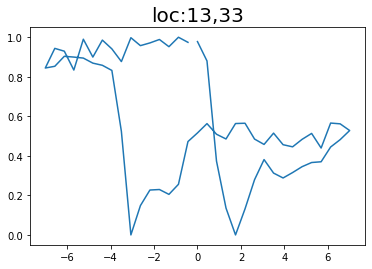

Epoch 1/200 ... Training loss: 1.8094
Epoch 10/200 ... Training loss: 1.661
Epoch 20/200 ... Training loss: 1.5249
Epoch 30/200 ... Training loss: 1.4259
Epoch 40/200 ... Training loss: 1.3347
Epoch 50/200 ... Training loss: 1.2417
Epoch 60/200 ... Training loss: 1.1498
Epoch 70/200 ... Training loss: 1.0484
Epoch 80/200 ... Training loss: 0.9282
Epoch 90/200 ... Training loss: 0.8389
Epoch 100/200 ... Training loss: 0.7391
Epoch 110/200 ... Training loss: 0.6459
Epoch 120/200 ... Training loss: 0.5968
Epoch 130/200 ... Training loss: 0.5101
Epoch 140/200 ... Training loss: 0.4174
Epoch 150/200 ... Training loss: 0.3426
Epoch 160/200 ... Training loss: 0.3219
Epoch 170/200 ... Training loss: 0.2366
Epoch 180/200 ... Training loss: 0.1645
Epoch 190/200 ... Training loss: 0.0906
Epoch 200/200 ... Training loss: 0.1521
step:  28
Sample #38




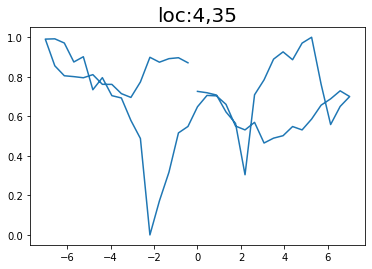

Epoch 1/200 ... Training loss: 2.0593
Epoch 10/200 ... Training loss: 1.9055
Epoch 20/200 ... Training loss: 1.7296
Epoch 30/200 ... Training loss: 1.5589
Epoch 40/200 ... Training loss: 1.4254
Epoch 50/200 ... Training loss: 1.267
Epoch 60/200 ... Training loss: 1.1931
Epoch 70/200 ... Training loss: 1.077
Epoch 80/200 ... Training loss: 0.9953
Epoch 90/200 ... Training loss: 0.9211
Epoch 100/200 ... Training loss: 0.8502
Epoch 110/200 ... Training loss: 0.7901
Epoch 120/200 ... Training loss: 0.7162
Epoch 130/200 ... Training loss: 0.6517
Epoch 140/200 ... Training loss: 0.5975
Epoch 150/200 ... Training loss: 0.5448
Epoch 160/200 ... Training loss: 0.4736
Epoch 170/200 ... Training loss: 0.423
Epoch 180/200 ... Training loss: 0.3671
Epoch 190/200 ... Training loss: 0.3081
Epoch 200/200 ... Training loss: 0.2659
step:  29
Sample #39




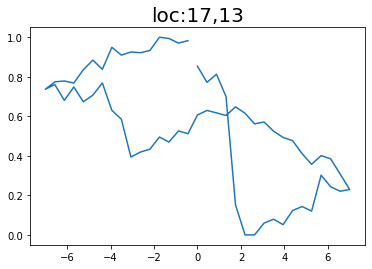

Epoch 1/200 ... Training loss: 2.0262
Epoch 10/200 ... Training loss: 1.8224
Epoch 20/200 ... Training loss: 1.6819
Epoch 30/200 ... Training loss: 1.5047
Epoch 40/200 ... Training loss: 1.3567
Epoch 50/200 ... Training loss: 1.2239
Epoch 60/200 ... Training loss: 1.1501
Epoch 70/200 ... Training loss: 1.0477
Epoch 80/200 ... Training loss: 0.9584
Epoch 90/200 ... Training loss: 0.8835
Epoch 100/200 ... Training loss: 0.8285
Epoch 110/200 ... Training loss: 0.753
Epoch 120/200 ... Training loss: 0.6866
Epoch 130/200 ... Training loss: 0.6265
Epoch 140/200 ... Training loss: 0.5652
Epoch 150/200 ... Training loss: 0.5029
Epoch 160/200 ... Training loss: 0.4425
Epoch 170/200 ... Training loss: 0.402
Epoch 180/200 ... Training loss: 0.356
Epoch 190/200 ... Training loss: 0.2727
Epoch 200/200 ... Training loss: 0.2282
step:  30
Sample #40




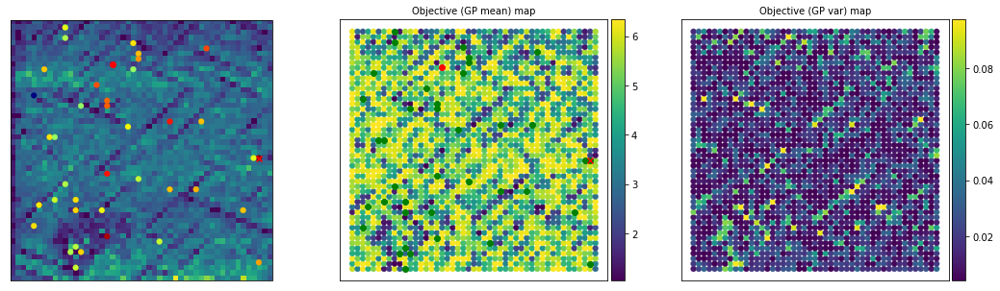

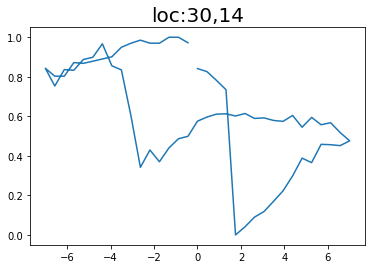

Epoch 1/200 ... Training loss: 2.0607
Epoch 10/200 ... Training loss: 1.9278
Epoch 20/200 ... Training loss: 1.7699
Epoch 30/200 ... Training loss: 1.5997
Epoch 40/200 ... Training loss: 1.4847
Epoch 50/200 ... Training loss: 1.3955
Epoch 60/200 ... Training loss: 1.274
Epoch 70/200 ... Training loss: 1.2167
Epoch 80/200 ... Training loss: 1.0925
Epoch 90/200 ... Training loss: 0.9976
Epoch 100/200 ... Training loss: 0.9268
Epoch 110/200 ... Training loss: 0.8457
Epoch 120/200 ... Training loss: 0.7588
Epoch 130/200 ... Training loss: 0.6848
Epoch 140/200 ... Training loss: 0.6185
Epoch 150/200 ... Training loss: 0.5626
Epoch 160/200 ... Training loss: 0.5043
Epoch 170/200 ... Training loss: 0.4382
Epoch 180/200 ... Training loss: 0.3883
Epoch 190/200 ... Training loss: 0.3264
Epoch 200/200 ... Training loss: 0.2565
step:  31
Sample #41




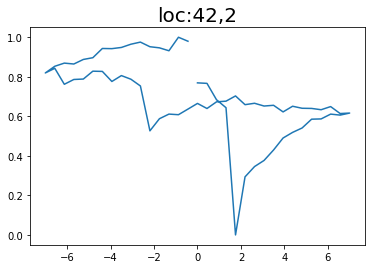

Epoch 1/200 ... Training loss: 2.0496
Epoch 10/200 ... Training loss: 1.8267
Epoch 20/200 ... Training loss: 1.6419
Epoch 30/200 ... Training loss: 1.4932
Epoch 40/200 ... Training loss: 1.3618
Epoch 50/200 ... Training loss: 1.2254
Epoch 60/200 ... Training loss: 1.1364
Epoch 70/200 ... Training loss: 1.0393
Epoch 80/200 ... Training loss: 0.9583
Epoch 90/200 ... Training loss: 0.8909
Epoch 100/200 ... Training loss: 0.8177
Epoch 110/200 ... Training loss: 0.7447
Epoch 120/200 ... Training loss: 0.6879
Epoch 130/200 ... Training loss: 0.6128
Epoch 140/200 ... Training loss: 0.5616
Epoch 150/200 ... Training loss: 0.5944
Epoch 160/200 ... Training loss: 0.461
Epoch 170/200 ... Training loss: 0.379
Epoch 180/200 ... Training loss: 0.3219
Epoch 190/200 ... Training loss: 0.2613
Epoch 200/200 ... Training loss: 0.218
step:  32
Sample #42




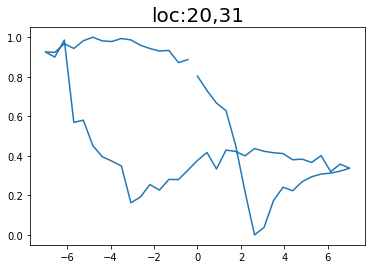

Epoch 1/200 ... Training loss: 2.0217
Epoch 10/200 ... Training loss: 1.8055
Epoch 20/200 ... Training loss: 1.6351
Epoch 30/200 ... Training loss: 1.4822
Epoch 40/200 ... Training loss: 1.3454
Epoch 50/200 ... Training loss: 1.2125
Epoch 60/200 ... Training loss: 1.1111
Epoch 70/200 ... Training loss: 1.034
Epoch 80/200 ... Training loss: 0.9571
Epoch 90/200 ... Training loss: 0.8754
Epoch 100/200 ... Training loss: 0.807
Epoch 110/200 ... Training loss: 0.7357
Epoch 120/200 ... Training loss: 0.6638
Epoch 130/200 ... Training loss: 0.6117
Epoch 140/200 ... Training loss: 0.5439
Epoch 150/200 ... Training loss: 0.503
Epoch 160/200 ... Training loss: 0.4167
Epoch 170/200 ... Training loss: 0.3558
Epoch 180/200 ... Training loss: 0.2988
Epoch 190/200 ... Training loss: 0.2393
Epoch 200/200 ... Training loss: 0.1886
step:  33
Sample #43




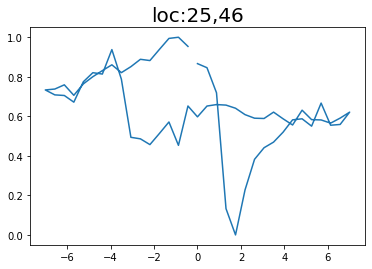

Epoch 1/200 ... Training loss: 1.9963
Epoch 10/200 ... Training loss: 1.8082
Epoch 20/200 ... Training loss: 1.6808
Epoch 30/200 ... Training loss: 1.5222
Epoch 40/200 ... Training loss: 1.4005
Epoch 50/200 ... Training loss: 1.2547
Epoch 60/200 ... Training loss: 1.1561
Epoch 70/200 ... Training loss: 1.0579
Epoch 80/200 ... Training loss: 0.9753
Epoch 90/200 ... Training loss: 0.8911
Epoch 100/200 ... Training loss: 0.8199
Epoch 110/200 ... Training loss: 0.8896
Epoch 120/200 ... Training loss: 0.719
Epoch 130/200 ... Training loss: 0.6289
Epoch 140/200 ... Training loss: 0.5631
Epoch 150/200 ... Training loss: 0.4991
Epoch 160/200 ... Training loss: 0.448
Epoch 170/200 ... Training loss: 0.3711
Epoch 180/200 ... Training loss: 0.3209
Epoch 190/200 ... Training loss: 0.2648
Epoch 200/200 ... Training loss: 0.2407
step:  34
Sample #44




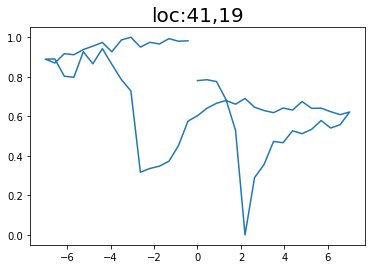

Epoch 1/200 ... Training loss: 1.9735
Epoch 10/200 ... Training loss: 1.7667
Epoch 20/200 ... Training loss: 1.6252
Epoch 30/200 ... Training loss: 1.4719
Epoch 40/200 ... Training loss: 1.3286
Epoch 50/200 ... Training loss: 1.1927
Epoch 60/200 ... Training loss: 1.1035
Epoch 70/200 ... Training loss: 1.0096
Epoch 80/200 ... Training loss: 0.9415
Epoch 90/200 ... Training loss: 0.8672
Epoch 100/200 ... Training loss: 0.8027
Epoch 110/200 ... Training loss: 0.7361
Epoch 120/200 ... Training loss: 0.7402
Epoch 130/200 ... Training loss: 0.6283
Epoch 140/200 ... Training loss: 0.5529
Epoch 150/200 ... Training loss: 0.4895
Epoch 160/200 ... Training loss: 0.439
Epoch 170/200 ... Training loss: 0.3936
Epoch 180/200 ... Training loss: 0.2971
Epoch 190/200 ... Training loss: 0.2688
Epoch 200/200 ... Training loss: 0.1822
step:  35
Sample #45




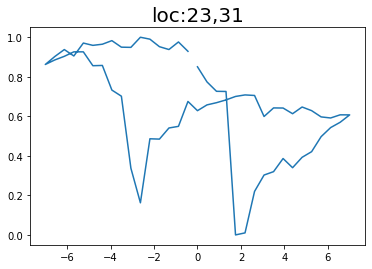

Epoch 1/200 ... Training loss: 1.9565
Epoch 10/200 ... Training loss: 1.7935
Epoch 20/200 ... Training loss: 1.6197
Epoch 30/200 ... Training loss: 1.4596
Epoch 40/200 ... Training loss: 1.3052
Epoch 50/200 ... Training loss: 1.1812
Epoch 60/200 ... Training loss: 1.0877
Epoch 70/200 ... Training loss: 1.0028
Epoch 80/200 ... Training loss: 0.9211
Epoch 90/200 ... Training loss: 0.8689
Epoch 100/200 ... Training loss: 0.7875
Epoch 110/200 ... Training loss: 0.7315
Epoch 120/200 ... Training loss: 0.6636
Epoch 130/200 ... Training loss: 0.6155
Epoch 140/200 ... Training loss: 0.5386
Epoch 150/200 ... Training loss: 0.5305
Epoch 160/200 ... Training loss: 0.4312
Epoch 170/200 ... Training loss: 0.3725
Epoch 180/200 ... Training loss: 0.3189
Epoch 190/200 ... Training loss: 0.2729
Epoch 200/200 ... Training loss: 0.2011
step:  36
Sample #46




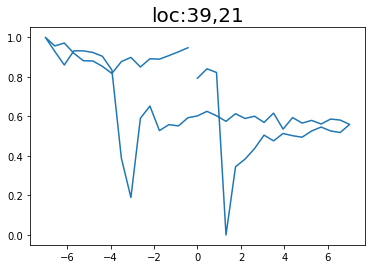

Epoch 1/200 ... Training loss: 1.9329
Epoch 10/200 ... Training loss: 1.7674
Epoch 20/200 ... Training loss: 1.6021
Epoch 30/200 ... Training loss: 1.4513
Epoch 40/200 ... Training loss: 1.3162
Epoch 50/200 ... Training loss: 1.1861
Epoch 60/200 ... Training loss: 1.0939
Epoch 70/200 ... Training loss: 0.9928
Epoch 80/200 ... Training loss: 0.9068
Epoch 90/200 ... Training loss: 0.8348
Epoch 100/200 ... Training loss: 0.7619
Epoch 110/200 ... Training loss: 0.7105
Epoch 120/200 ... Training loss: 0.6282
Epoch 130/200 ... Training loss: 0.5712
Epoch 140/200 ... Training loss: 0.5174
Epoch 150/200 ... Training loss: 0.443
Epoch 160/200 ... Training loss: 0.3796
Epoch 170/200 ... Training loss: 0.3194
Epoch 180/200 ... Training loss: 0.2762
Epoch 190/200 ... Training loss: 0.2052
Epoch 200/200 ... Training loss: 0.3288
step:  37
Sample #47




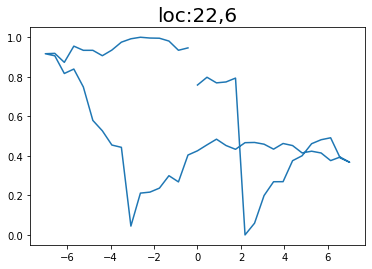

Epoch 1/200 ... Training loss: 1.9077
Epoch 10/200 ... Training loss: 1.7425
Epoch 20/200 ... Training loss: 1.5992
Epoch 30/200 ... Training loss: 1.4411
Epoch 40/200 ... Training loss: 1.3104
Epoch 50/200 ... Training loss: 1.1841
Epoch 60/200 ... Training loss: 1.0886
Epoch 70/200 ... Training loss: 0.9865
Epoch 80/200 ... Training loss: 0.9025
Epoch 90/200 ... Training loss: 0.8209
Epoch 100/200 ... Training loss: 0.7511
Epoch 110/200 ... Training loss: 0.709
Epoch 120/200 ... Training loss: 0.6298
Epoch 130/200 ... Training loss: 0.5677
Epoch 140/200 ... Training loss: 0.505
Epoch 150/200 ... Training loss: 0.4315
Epoch 160/200 ... Training loss: 0.3719
Epoch 170/200 ... Training loss: 0.4031
Epoch 180/200 ... Training loss: 0.2713
Epoch 190/200 ... Training loss: 0.1963
Epoch 200/200 ... Training loss: 0.2046
step:  38
Sample #48




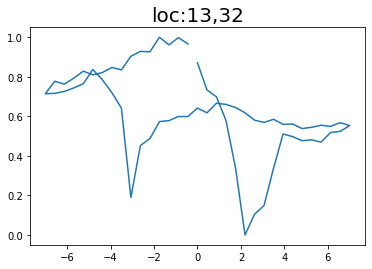

Epoch 1/200 ... Training loss: 1.905
Epoch 10/200 ... Training loss: 1.7759
Epoch 20/200 ... Training loss: 1.6216
Epoch 30/200 ... Training loss: 1.4577
Epoch 40/200 ... Training loss: 1.309
Epoch 50/200 ... Training loss: 1.1694
Epoch 60/200 ... Training loss: 1.0748
Epoch 70/200 ... Training loss: 1.003
Epoch 80/200 ... Training loss: 0.9119
Epoch 90/200 ... Training loss: 0.8339
Epoch 100/200 ... Training loss: 0.7644
Epoch 110/200 ... Training loss: 0.7258
Epoch 120/200 ... Training loss: 0.6583
Epoch 130/200 ... Training loss: 0.5784
Epoch 140/200 ... Training loss: 0.5111
Epoch 150/200 ... Training loss: 0.4519
Epoch 160/200 ... Training loss: 0.3987
Epoch 170/200 ... Training loss: 0.3508
Epoch 180/200 ... Training loss: 0.2877
Epoch 190/200 ... Training loss: 0.2272
Epoch 200/200 ... Training loss: 0.2986
step:  39
Sample #49




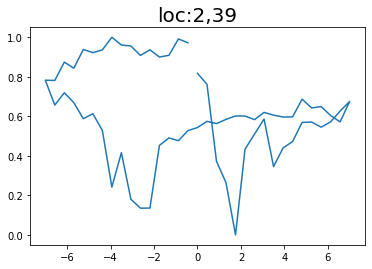

Epoch 1/200 ... Training loss: 1.9254
Epoch 10/200 ... Training loss: 1.7916
Epoch 20/200 ... Training loss: 1.5888
Epoch 30/200 ... Training loss: 1.4393
Epoch 40/200 ... Training loss: 1.3235
Epoch 50/200 ... Training loss: 1.1994
Epoch 60/200 ... Training loss: 1.1101
Epoch 70/200 ... Training loss: 1.0472
Epoch 80/200 ... Training loss: 0.9698
Epoch 90/200 ... Training loss: 0.8648
Epoch 100/200 ... Training loss: 0.7932
Epoch 110/200 ... Training loss: 0.7268
Epoch 120/200 ... Training loss: 0.6619
Epoch 130/200 ... Training loss: 0.6019
Epoch 140/200 ... Training loss: 0.5193
Epoch 150/200 ... Training loss: 0.4702
Epoch 160/200 ... Training loss: 0.4107
Epoch 170/200 ... Training loss: 0.3588
Epoch 180/200 ... Training loss: 0.3252
Epoch 190/200 ... Training loss: 0.2539
Epoch 200/200 ... Training loss: 0.1748
step:  40
Sample #50




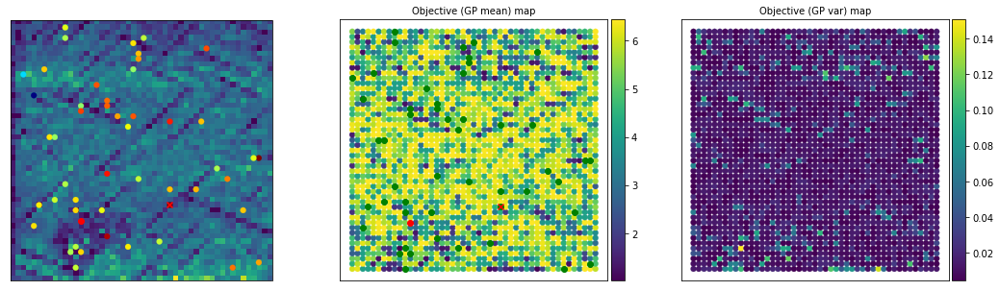

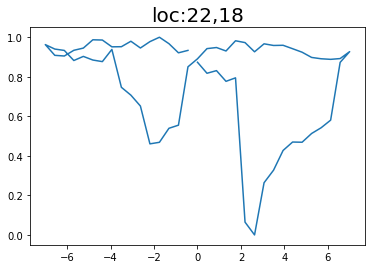

Epoch 1/200 ... Training loss: 1.9051
Epoch 10/200 ... Training loss: 1.7353
Epoch 20/200 ... Training loss: 1.5616
Epoch 30/200 ... Training loss: 1.4201
Epoch 40/200 ... Training loss: 1.3
Epoch 50/200 ... Training loss: 1.1966
Epoch 60/200 ... Training loss: 1.1039
Epoch 70/200 ... Training loss: 1.0427
Epoch 80/200 ... Training loss: 0.9297
Epoch 90/200 ... Training loss: 0.8357
Epoch 100/200 ... Training loss: 0.7565
Epoch 110/200 ... Training loss: 0.6866
Epoch 120/200 ... Training loss: 0.6407
Epoch 130/200 ... Training loss: 0.5667
Epoch 140/200 ... Training loss: 0.5321
Epoch 150/200 ... Training loss: 0.4473
Epoch 160/200 ... Training loss: 0.3858
Epoch 170/200 ... Training loss: 0.3193
Epoch 180/200 ... Training loss: 0.2536
Epoch 190/200 ... Training loss: 0.2996
Epoch 200/200 ... Training loss: 0.1619
step:  41
Sample #51




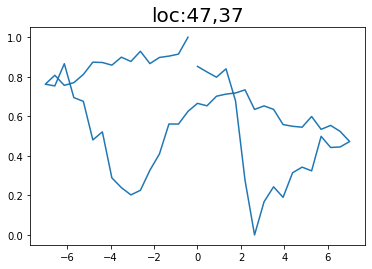

Epoch 1/200 ... Training loss: 1.8828
Epoch 10/200 ... Training loss: 1.7492
Epoch 20/200 ... Training loss: 1.5552
Epoch 30/200 ... Training loss: 1.4102
Epoch 40/200 ... Training loss: 1.2935
Epoch 50/200 ... Training loss: 1.2185
Epoch 60/200 ... Training loss: 1.1191
Epoch 70/200 ... Training loss: 1.0319
Epoch 80/200 ... Training loss: 0.9786
Epoch 90/200 ... Training loss: 0.8904
Epoch 100/200 ... Training loss: 0.7945
Epoch 110/200 ... Training loss: 0.7559
Epoch 120/200 ... Training loss: 0.649
Epoch 130/200 ... Training loss: 0.5697
Epoch 140/200 ... Training loss: 0.5592
Epoch 150/200 ... Training loss: 0.4516
Epoch 160/200 ... Training loss: 0.4547
Epoch 170/200 ... Training loss: 0.3398
Epoch 180/200 ... Training loss: 0.2426
Epoch 190/200 ... Training loss: 0.1875
Epoch 200/200 ... Training loss: 0.1175
step:  42
Sample #52




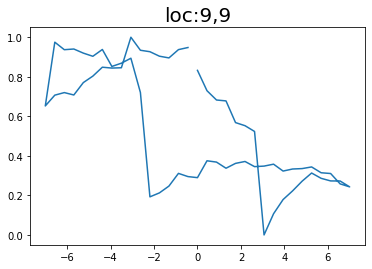

Epoch 1/200 ... Training loss: 1.8656
Epoch 10/200 ... Training loss: 1.7029
Epoch 20/200 ... Training loss: 1.5274
Epoch 30/200 ... Training loss: 1.3896
Epoch 40/200 ... Training loss: 1.2637
Epoch 50/200 ... Training loss: 1.1537
Epoch 60/200 ... Training loss: 1.0515
Epoch 70/200 ... Training loss: 0.9566
Epoch 80/200 ... Training loss: 0.8725
Epoch 90/200 ... Training loss: 0.7957
Epoch 100/200 ... Training loss: 0.7413
Epoch 110/200 ... Training loss: 0.6611
Epoch 120/200 ... Training loss: 0.623
Epoch 130/200 ... Training loss: 0.5424
Epoch 140/200 ... Training loss: 0.4847
Epoch 150/200 ... Training loss: 0.4374
Epoch 160/200 ... Training loss: 0.367
Epoch 170/200 ... Training loss: 0.3
Epoch 180/200 ... Training loss: 0.3127
Epoch 190/200 ... Training loss: 0.2156
Epoch 200/200 ... Training loss: 0.1334
step:  43
Sample #53




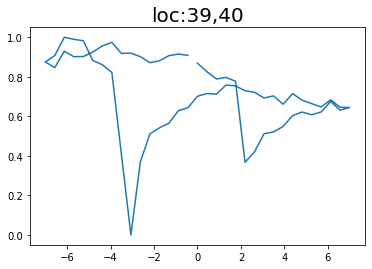

Epoch 1/200 ... Training loss: 1.8811
Epoch 10/200 ... Training loss: 1.7363
Epoch 20/200 ... Training loss: 1.5273
Epoch 30/200 ... Training loss: 1.3916
Epoch 40/200 ... Training loss: 1.2595
Epoch 50/200 ... Training loss: 1.1505
Epoch 60/200 ... Training loss: 1.0314
Epoch 70/200 ... Training loss: 0.9586
Epoch 80/200 ... Training loss: 0.8743
Epoch 90/200 ... Training loss: 0.9171
Epoch 100/200 ... Training loss: 0.7653
Epoch 110/200 ... Training loss: 0.68
Epoch 120/200 ... Training loss: 0.6136
Epoch 130/200 ... Training loss: 0.5527
Epoch 140/200 ... Training loss: 0.5056
Epoch 150/200 ... Training loss: 0.4366
Epoch 160/200 ... Training loss: 0.3993
Epoch 170/200 ... Training loss: 0.3135
Epoch 180/200 ... Training loss: 0.2654
Epoch 190/200 ... Training loss: 0.2627
Epoch 200/200 ... Training loss: 0.1634
step:  44
Sample #54




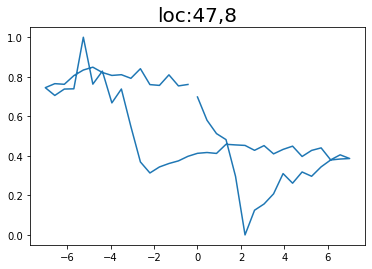

Epoch 1/200 ... Training loss: 1.8792
Epoch 10/200 ... Training loss: 1.7919
Epoch 20/200 ... Training loss: 1.4972
Epoch 30/200 ... Training loss: 1.3652
Epoch 40/200 ... Training loss: 1.2427
Epoch 50/200 ... Training loss: 1.1389
Epoch 60/200 ... Training loss: 1.0325
Epoch 70/200 ... Training loss: 0.9526
Epoch 80/200 ... Training loss: 0.8683
Epoch 90/200 ... Training loss: 0.7882
Epoch 100/200 ... Training loss: 0.722
Epoch 110/200 ... Training loss: 0.6498
Epoch 120/200 ... Training loss: 0.6023
Epoch 130/200 ... Training loss: 0.5259
Epoch 140/200 ... Training loss: 0.5234
Epoch 150/200 ... Training loss: 0.4232
Epoch 160/200 ... Training loss: 0.3478
Epoch 170/200 ... Training loss: 0.3008
Epoch 180/200 ... Training loss: 0.238
Epoch 190/200 ... Training loss: 0.1652
Epoch 200/200 ... Training loss: 0.1118
step:  45
Sample #55




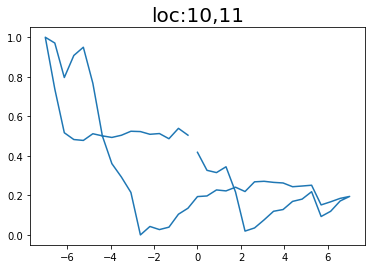

Epoch 1/200 ... Training loss: 1.8674
Epoch 10/200 ... Training loss: 1.774
Epoch 20/200 ... Training loss: 1.5121
Epoch 30/200 ... Training loss: 1.4013
Epoch 40/200 ... Training loss: 1.2723
Epoch 50/200 ... Training loss: 1.1655
Epoch 60/200 ... Training loss: 1.0496
Epoch 70/200 ... Training loss: 0.9729
Epoch 80/200 ... Training loss: 0.8544
Epoch 90/200 ... Training loss: 0.7792
Epoch 100/200 ... Training loss: 0.7181
Epoch 110/200 ... Training loss: 0.6293
Epoch 120/200 ... Training loss: 0.5665
Epoch 130/200 ... Training loss: 0.4989
Epoch 140/200 ... Training loss: 0.5057
Epoch 150/200 ... Training loss: 0.3863
Epoch 160/200 ... Training loss: 0.3484
Epoch 170/200 ... Training loss: 0.2683
Epoch 180/200 ... Training loss: 0.3517
Epoch 190/200 ... Training loss: 0.1843
Epoch 200/200 ... Training loss: 0.0917
step:  46
Sample #56




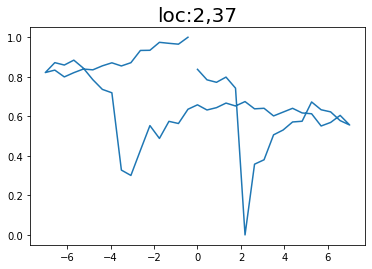

Epoch 1/200 ... Training loss: 1.8525
Epoch 10/200 ... Training loss: 1.6273
Epoch 20/200 ... Training loss: 1.4438
Epoch 30/200 ... Training loss: 1.3097
Epoch 40/200 ... Training loss: 1.1879
Epoch 50/200 ... Training loss: 1.0949
Epoch 60/200 ... Training loss: 0.9753
Epoch 70/200 ... Training loss: 0.9579
Epoch 80/200 ... Training loss: 0.8242
Epoch 90/200 ... Training loss: 0.7472
Epoch 100/200 ... Training loss: 0.6785
Epoch 110/200 ... Training loss: 0.6319
Epoch 120/200 ... Training loss: 0.5568
Epoch 130/200 ... Training loss: 0.4969
Epoch 140/200 ... Training loss: 0.4329
Epoch 150/200 ... Training loss: 0.3646
Epoch 160/200 ... Training loss: 0.3498
Epoch 170/200 ... Training loss: 0.2655
Epoch 180/200 ... Training loss: 0.3367
Epoch 190/200 ... Training loss: 0.1674
Epoch 200/200 ... Training loss: 0.12
step:  47
Sample #57




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


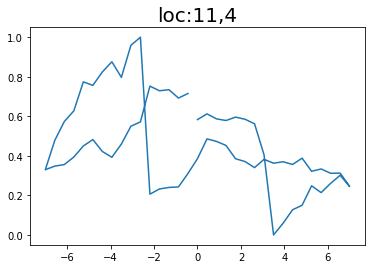

Epoch 1/200 ... Training loss: 1.8425
Epoch 10/200 ... Training loss: 1.7256
Epoch 20/200 ... Training loss: 1.616
Epoch 30/200 ... Training loss: 1.4598
Epoch 40/200 ... Training loss: 1.3076
Epoch 50/200 ... Training loss: 1.1665
Epoch 60/200 ... Training loss: 1.0785
Epoch 70/200 ... Training loss: 0.9843
Epoch 80/200 ... Training loss: 0.909
Epoch 90/200 ... Training loss: 0.8361
Epoch 100/200 ... Training loss: 0.7828
Epoch 110/200 ... Training loss: 0.7014
Epoch 120/200 ... Training loss: 0.6784
Epoch 130/200 ... Training loss: 0.5953
Epoch 140/200 ... Training loss: 0.5265
Epoch 150/200 ... Training loss: 0.4766
Epoch 160/200 ... Training loss: 0.3862
Epoch 170/200 ... Training loss: 0.3235
Epoch 180/200 ... Training loss: 0.2665
Epoch 190/200 ... Training loss: 0.2792
Epoch 200/200 ... Training loss: 0.2395
step:  48
Sample #58




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


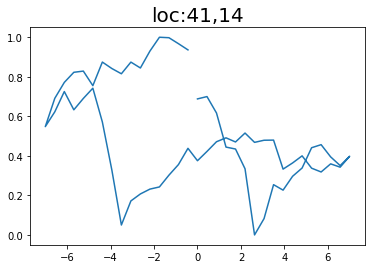

Epoch 1/200 ... Training loss: 1.828
Epoch 10/200 ... Training loss: 1.7926
Epoch 20/200 ... Training loss: 1.6863
Epoch 30/200 ... Training loss: 1.6406
Epoch 40/200 ... Training loss: 1.5863
Epoch 50/200 ... Training loss: 1.5149
Epoch 60/200 ... Training loss: 1.4132
Epoch 70/200 ... Training loss: 1.3322
Epoch 80/200 ... Training loss: 1.2338
Epoch 90/200 ... Training loss: 1.1369
Epoch 100/200 ... Training loss: 1.0174
Epoch 110/200 ... Training loss: 0.9349
Epoch 120/200 ... Training loss: 0.8301
Epoch 130/200 ... Training loss: 0.7621
Epoch 140/200 ... Training loss: 0.672
Epoch 150/200 ... Training loss: 0.7599
Epoch 160/200 ... Training loss: 0.5537
Epoch 170/200 ... Training loss: 0.4615
Epoch 180/200 ... Training loss: 0.3804
Epoch 190/200 ... Training loss: 0.3582
Epoch 200/200 ... Training loss: 0.2455
step:  49
Sample #59




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


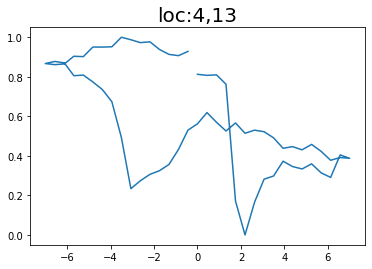

Epoch 1/200 ... Training loss: 1.8098
Epoch 10/200 ... Training loss: 1.7513
Epoch 20/200 ... Training loss: 1.6625
Epoch 30/200 ... Training loss: 1.5723
Epoch 40/200 ... Training loss: 1.5336
Epoch 50/200 ... Training loss: 1.4792
Epoch 60/200 ... Training loss: 1.3084
Epoch 70/200 ... Training loss: 1.128
Epoch 80/200 ... Training loss: 1.0232
Epoch 90/200 ... Training loss: 0.9181
Epoch 100/200 ... Training loss: 0.8353
Epoch 110/200 ... Training loss: 0.7728
Epoch 120/200 ... Training loss: 0.689
Epoch 130/200 ... Training loss: 0.6262
Epoch 140/200 ... Training loss: 0.5806
Epoch 150/200 ... Training loss: 0.4815
Epoch 160/200 ... Training loss: 0.4289
Epoch 170/200 ... Training loss: 0.3697
Epoch 180/200 ... Training loss: 0.2827
Epoch 190/200 ... Training loss: 0.2393
Epoch 200/200 ... Training loss: 0.1732
step:  50
Sample #60




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


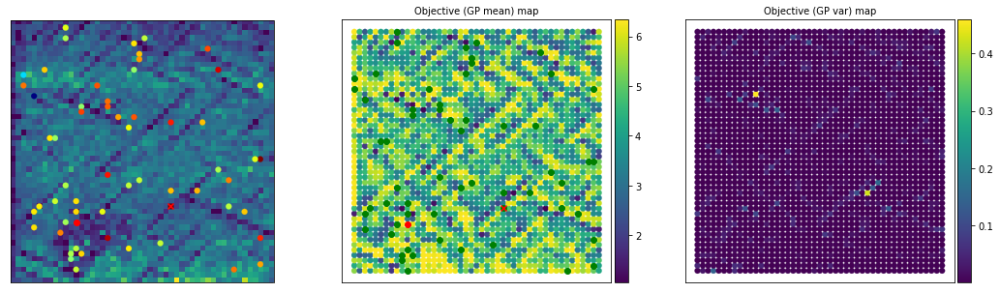

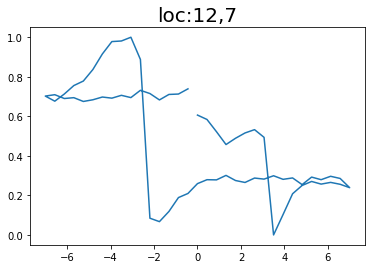

Epoch 1/200 ... Training loss: 1.7945
Epoch 10/200 ... Training loss: 1.7394
Epoch 20/200 ... Training loss: 1.6238
Epoch 30/200 ... Training loss: 1.5481
Epoch 40/200 ... Training loss: 1.4912
Epoch 50/200 ... Training loss: 1.3499
Epoch 60/200 ... Training loss: 1.2078
Epoch 70/200 ... Training loss: 1.0845
Epoch 80/200 ... Training loss: 0.9567
Epoch 90/200 ... Training loss: 0.8609
Epoch 100/200 ... Training loss: 0.764
Epoch 110/200 ... Training loss: 0.7189
Epoch 120/200 ... Training loss: 0.6227
Epoch 130/200 ... Training loss: 0.5804
Epoch 140/200 ... Training loss: 0.4883
Epoch 150/200 ... Training loss: 0.4164
Epoch 160/200 ... Training loss: 0.4788
Epoch 170/200 ... Training loss: 0.3381
Epoch 180/200 ... Training loss: 0.2423
Epoch 190/200 ... Training loss: 0.1909
Epoch 200/200 ... Training loss: 0.1459
step:  51
Sample #61




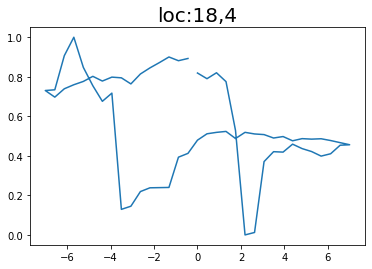

Epoch 1/200 ... Training loss: 1.8013
Epoch 10/200 ... Training loss: 1.6801
Epoch 20/200 ... Training loss: 1.5813
Epoch 30/200 ... Training loss: 1.4293
Epoch 40/200 ... Training loss: 1.279
Epoch 50/200 ... Training loss: 1.2371
Epoch 60/200 ... Training loss: 1.0556
Epoch 70/200 ... Training loss: 0.9421
Epoch 80/200 ... Training loss: 0.8521
Epoch 90/200 ... Training loss: 0.779
Epoch 100/200 ... Training loss: 0.7067
Epoch 110/200 ... Training loss: 0.6508
Epoch 120/200 ... Training loss: 0.5787
Epoch 130/200 ... Training loss: 0.5202
Epoch 140/200 ... Training loss: 0.4909
Epoch 150/200 ... Training loss: 0.4236
Epoch 160/200 ... Training loss: 0.3527
Epoch 170/200 ... Training loss: 0.2939
Epoch 180/200 ... Training loss: 0.2578
Epoch 190/200 ... Training loss: 0.184
Epoch 200/200 ... Training loss: 0.2013
step:  52
Sample #62




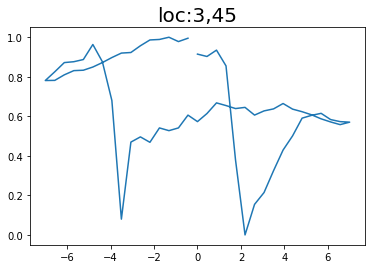

Epoch 1/200 ... Training loss: 1.7929
Epoch 10/200 ... Training loss: 1.7258
Epoch 20/200 ... Training loss: 1.647
Epoch 30/200 ... Training loss: 1.5549
Epoch 40/200 ... Training loss: 1.457
Epoch 50/200 ... Training loss: 1.3643
Epoch 60/200 ... Training loss: 1.2598
Epoch 70/200 ... Training loss: 1.1009
Epoch 80/200 ... Training loss: 0.9963
Epoch 90/200 ... Training loss: 0.857
Epoch 100/200 ... Training loss: 0.7735
Epoch 110/200 ... Training loss: 0.7
Epoch 120/200 ... Training loss: 0.6429
Epoch 130/200 ... Training loss: 0.5713
Epoch 140/200 ... Training loss: 0.4979
Epoch 150/200 ... Training loss: 0.4219
Epoch 160/200 ... Training loss: 0.3585
Epoch 170/200 ... Training loss: 0.3059
Epoch 180/200 ... Training loss: 0.2357
Epoch 190/200 ... Training loss: 0.1791
Epoch 200/200 ... Training loss: 0.2116
step:  53
Sample #63




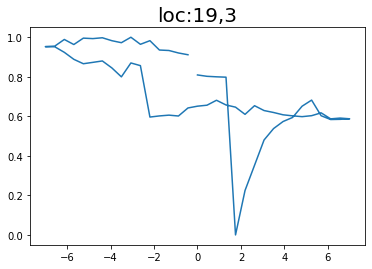

Epoch 1/200 ... Training loss: 1.778
Epoch 10/200 ... Training loss: 1.6572
Epoch 20/200 ... Training loss: 1.5012
Epoch 30/200 ... Training loss: 1.3287
Epoch 40/200 ... Training loss: 1.2683
Epoch 50/200 ... Training loss: 1.1228
Epoch 60/200 ... Training loss: 1.0081
Epoch 70/200 ... Training loss: 0.9195
Epoch 80/200 ... Training loss: 0.9285
Epoch 90/200 ... Training loss: 0.798
Epoch 100/200 ... Training loss: 0.7006
Epoch 110/200 ... Training loss: 0.6275
Epoch 120/200 ... Training loss: 0.568
Epoch 130/200 ... Training loss: 0.495
Epoch 140/200 ... Training loss: 0.4406
Epoch 150/200 ... Training loss: 0.3952
Epoch 160/200 ... Training loss: 0.319
Epoch 170/200 ... Training loss: 0.4577
Epoch 180/200 ... Training loss: 0.2534
Epoch 190/200 ... Training loss: 0.1673
Epoch 200/200 ... Training loss: 0.1418
step:  54
Sample #64




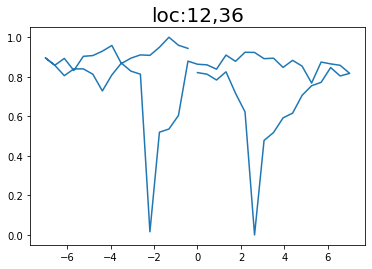

Epoch 1/200 ... Training loss: 1.7944
Epoch 10/200 ... Training loss: 1.7191
Epoch 20/200 ... Training loss: 1.6389
Epoch 30/200 ... Training loss: 1.5618
Epoch 40/200 ... Training loss: 1.5029
Epoch 50/200 ... Training loss: 1.3721
Epoch 60/200 ... Training loss: 1.2333
Epoch 70/200 ... Training loss: 1.1554
Epoch 80/200 ... Training loss: 1.0296
Epoch 90/200 ... Training loss: 0.9342
Epoch 100/200 ... Training loss: 0.8352
Epoch 110/200 ... Training loss: 0.7492
Epoch 120/200 ... Training loss: 0.6761
Epoch 130/200 ... Training loss: 0.6059
Epoch 140/200 ... Training loss: 0.5448
Epoch 150/200 ... Training loss: 0.4778
Epoch 160/200 ... Training loss: 0.4235
Epoch 170/200 ... Training loss: 0.3734
Epoch 180/200 ... Training loss: 0.3068
Epoch 190/200 ... Training loss: 0.2378
Epoch 200/200 ... Training loss: 0.2873
step:  55
Sample #65




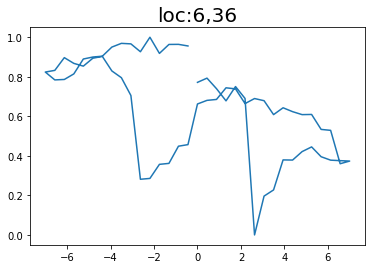

Epoch 1/200 ... Training loss: 1.7837
Epoch 10/200 ... Training loss: 1.677
Epoch 20/200 ... Training loss: 1.5924
Epoch 30/200 ... Training loss: 1.4329
Epoch 40/200 ... Training loss: 1.3
Epoch 50/200 ... Training loss: 1.1988
Epoch 60/200 ... Training loss: 1.1035
Epoch 70/200 ... Training loss: 1.1545
Epoch 80/200 ... Training loss: 0.9903
Epoch 90/200 ... Training loss: 0.8847
Epoch 100/200 ... Training loss: 0.816
Epoch 110/200 ... Training loss: 0.7263
Epoch 120/200 ... Training loss: 0.6471
Epoch 130/200 ... Training loss: 0.5713
Epoch 140/200 ... Training loss: 0.694
Epoch 150/200 ... Training loss: 0.4732
Epoch 160/200 ... Training loss: 0.3902
Epoch 170/200 ... Training loss: 0.3097
Epoch 180/200 ... Training loss: 0.2387
Epoch 190/200 ... Training loss: 0.1809
Epoch 200/200 ... Training loss: 0.1971
step:  56
Sample #66




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


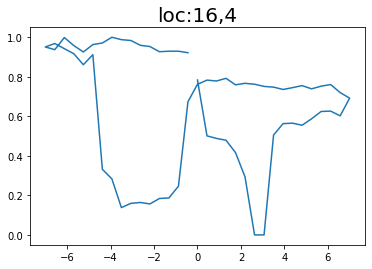

Epoch 1/200 ... Training loss: 1.7737
Epoch 10/200 ... Training loss: 1.6786
Epoch 20/200 ... Training loss: 1.5841
Epoch 30/200 ... Training loss: 1.4725
Epoch 40/200 ... Training loss: 1.3372
Epoch 50/200 ... Training loss: 1.1952
Epoch 60/200 ... Training loss: 1.0709
Epoch 70/200 ... Training loss: 0.9655
Epoch 80/200 ... Training loss: 0.8747
Epoch 90/200 ... Training loss: 0.8061
Epoch 100/200 ... Training loss: 0.7328
Epoch 110/200 ... Training loss: 0.6654
Epoch 120/200 ... Training loss: 0.6054
Epoch 130/200 ... Training loss: 0.5398
Epoch 140/200 ... Training loss: 0.532
Epoch 150/200 ... Training loss: 0.4379
Epoch 160/200 ... Training loss: 0.3697
Epoch 170/200 ... Training loss: 0.4606
Epoch 180/200 ... Training loss: 0.3068
Epoch 190/200 ... Training loss: 0.2201
Epoch 200/200 ... Training loss: 0.1555
step:  57
Sample #67




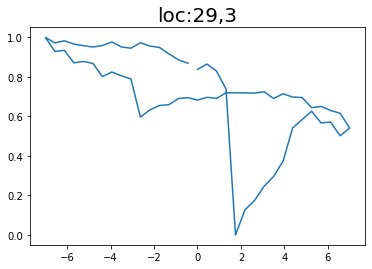

Epoch 1/200 ... Training loss: 1.7641
Epoch 10/200 ... Training loss: 1.6682
Epoch 20/200 ... Training loss: 1.5795
Epoch 30/200 ... Training loss: 1.5104
Epoch 40/200 ... Training loss: 1.3856
Epoch 50/200 ... Training loss: 1.2105
Epoch 60/200 ... Training loss: 1.1055
Epoch 70/200 ... Training loss: 0.9888
Epoch 80/200 ... Training loss: 0.8926
Epoch 90/200 ... Training loss: 0.8002
Epoch 100/200 ... Training loss: 0.7327
Epoch 110/200 ... Training loss: 0.6663
Epoch 120/200 ... Training loss: 0.6103
Epoch 130/200 ... Training loss: 0.5493
Epoch 140/200 ... Training loss: 0.4766
Epoch 150/200 ... Training loss: 0.4605
Epoch 160/200 ... Training loss: 0.3702
Epoch 170/200 ... Training loss: 0.3434
Epoch 180/200 ... Training loss: 0.2438
Epoch 190/200 ... Training loss: 0.2152
Epoch 200/200 ... Training loss: 0.1771
step:  58
Sample #68




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


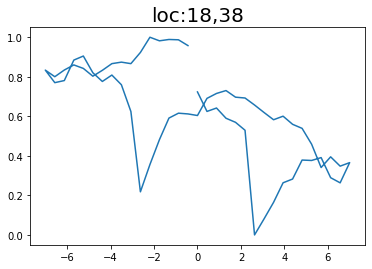

Epoch 1/200 ... Training loss: 1.7501
Epoch 10/200 ... Training loss: 1.6558
Epoch 20/200 ... Training loss: 1.5673
Epoch 30/200 ... Training loss: 1.45
Epoch 40/200 ... Training loss: 1.2822
Epoch 50/200 ... Training loss: 1.1325
Epoch 60/200 ... Training loss: 1.053
Epoch 70/200 ... Training loss: 0.9636
Epoch 80/200 ... Training loss: 0.876
Epoch 90/200 ... Training loss: 0.8042
Epoch 100/200 ... Training loss: 0.7374
Epoch 110/200 ... Training loss: 0.6851
Epoch 120/200 ... Training loss: 0.7221
Epoch 130/200 ... Training loss: 0.6311
Epoch 140/200 ... Training loss: 0.4914
Epoch 150/200 ... Training loss: 0.433
Epoch 160/200 ... Training loss: 0.3676
Epoch 170/200 ... Training loss: 0.3682
Epoch 180/200 ... Training loss: 0.2739
Epoch 190/200 ... Training loss: 0.2299
Epoch 200/200 ... Training loss: 0.1636
step:  59
Sample #69




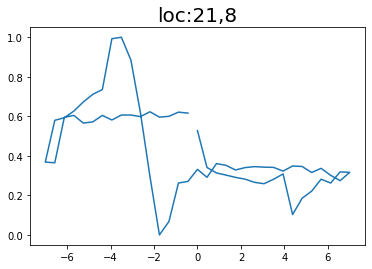

Epoch 1/200 ... Training loss: 1.7365
Epoch 10/200 ... Training loss: 1.6449
Epoch 20/200 ... Training loss: 1.5556
Epoch 30/200 ... Training loss: 1.4158
Epoch 40/200 ... Training loss: 1.2312
Epoch 50/200 ... Training loss: 1.1049
Epoch 60/200 ... Training loss: 0.9998
Epoch 70/200 ... Training loss: 0.9198
Epoch 80/200 ... Training loss: 0.8326
Epoch 90/200 ... Training loss: 0.8085
Epoch 100/200 ... Training loss: 0.7115
Epoch 110/200 ... Training loss: 0.6383
Epoch 120/200 ... Training loss: 0.5742
Epoch 130/200 ... Training loss: 0.5798
Epoch 140/200 ... Training loss: 0.494
Epoch 150/200 ... Training loss: 0.4095
Epoch 160/200 ... Training loss: 0.3479
Epoch 170/200 ... Training loss: 0.3676
Epoch 180/200 ... Training loss: 0.2746
Epoch 190/200 ... Training loss: 0.1856
Epoch 200/200 ... Training loss: 0.1729
step:  60
Sample #70




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


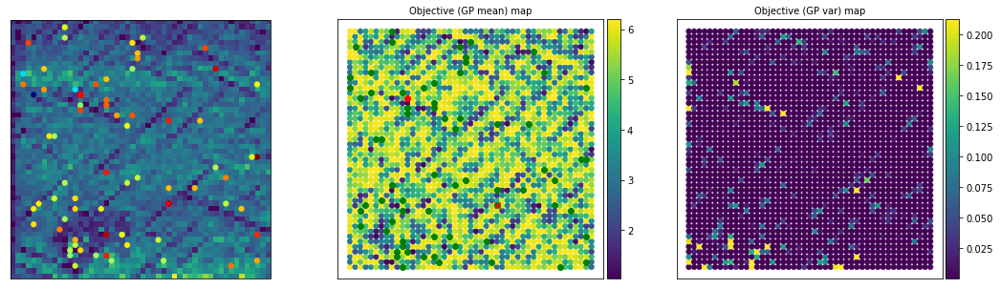

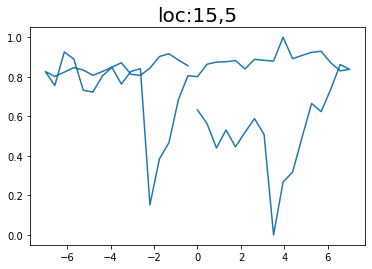

Epoch 1/200 ... Training loss: 1.7453
Epoch 10/200 ... Training loss: 1.6508
Epoch 20/200 ... Training loss: 1.5691
Epoch 30/200 ... Training loss: 1.4053
Epoch 40/200 ... Training loss: 1.2239
Epoch 50/200 ... Training loss: 1.1187
Epoch 60/200 ... Training loss: 1.0246
Epoch 70/200 ... Training loss: 0.9309
Epoch 80/200 ... Training loss: 0.9026
Epoch 90/200 ... Training loss: 0.788
Epoch 100/200 ... Training loss: 0.7226
Epoch 110/200 ... Training loss: 0.6553
Epoch 120/200 ... Training loss: 0.5993
Epoch 130/200 ... Training loss: 0.564
Epoch 140/200 ... Training loss: 0.4791
Epoch 150/200 ... Training loss: 0.5738
Epoch 160/200 ... Training loss: 0.4647
Epoch 170/200 ... Training loss: 0.3421
Epoch 180/200 ... Training loss: 0.2737
Epoch 190/200 ... Training loss: 0.4544
Epoch 200/200 ... Training loss: 0.2551
step:  61
Sample #71




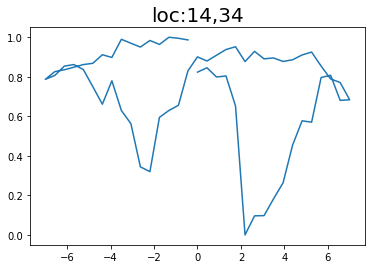

Epoch 1/200 ... Training loss: 1.7313
Epoch 10/200 ... Training loss: 1.6391
Epoch 20/200 ... Training loss: 1.5559
Epoch 30/200 ... Training loss: 1.3791
Epoch 40/200 ... Training loss: 1.2678
Epoch 50/200 ... Training loss: 1.1578
Epoch 60/200 ... Training loss: 1.018
Epoch 70/200 ... Training loss: 0.9168
Epoch 80/200 ... Training loss: 0.8398
Epoch 90/200 ... Training loss: 0.7654
Epoch 100/200 ... Training loss: 0.7281
Epoch 110/200 ... Training loss: 0.6615
Epoch 120/200 ... Training loss: 0.5793
Epoch 130/200 ... Training loss: 0.5087
Epoch 140/200 ... Training loss: 0.4663
Epoch 150/200 ... Training loss: 0.3997
Epoch 160/200 ... Training loss: 0.3515
Epoch 170/200 ... Training loss: 0.2844
Epoch 180/200 ... Training loss: 0.2514
Epoch 190/200 ... Training loss: 0.2612
Epoch 200/200 ... Training loss: 0.1836
step:  62
Sample #72




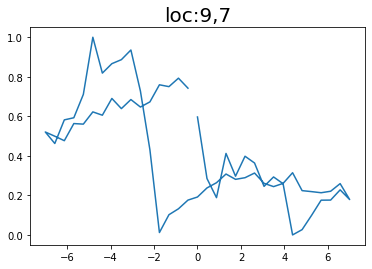

Epoch 1/200 ... Training loss: 1.7295
Epoch 10/200 ... Training loss: 1.6079
Epoch 20/200 ... Training loss: 1.4737
Epoch 30/200 ... Training loss: 1.3434
Epoch 40/200 ... Training loss: 1.2116
Epoch 50/200 ... Training loss: 1.0944
Epoch 60/200 ... Training loss: 0.9729
Epoch 70/200 ... Training loss: 0.8884
Epoch 80/200 ... Training loss: 0.8105
Epoch 90/200 ... Training loss: 0.7284
Epoch 100/200 ... Training loss: 0.6588
Epoch 110/200 ... Training loss: 0.6143
Epoch 120/200 ... Training loss: 0.5408
Epoch 130/200 ... Training loss: 0.4836
Epoch 140/200 ... Training loss: 0.4266
Epoch 150/200 ... Training loss: 0.3662
Epoch 160/200 ... Training loss: 0.3379
Epoch 170/200 ... Training loss: 0.2665
Epoch 180/200 ... Training loss: 0.2602
Epoch 190/200 ... Training loss: 0.1669
Epoch 200/200 ... Training loss: 0.2418
step:  63
Sample #73




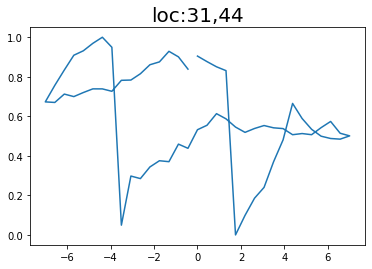

Epoch 1/200 ... Training loss: 1.7173
Epoch 10/200 ... Training loss: 1.6
Epoch 20/200 ... Training loss: 1.4833
Epoch 30/200 ... Training loss: 1.3446
Epoch 40/200 ... Training loss: 1.2103
Epoch 50/200 ... Training loss: 1.0968
Epoch 60/200 ... Training loss: 0.9834
Epoch 70/200 ... Training loss: 0.8807
Epoch 80/200 ... Training loss: 0.8034
Epoch 90/200 ... Training loss: 0.7316
Epoch 100/200 ... Training loss: 0.6779
Epoch 110/200 ... Training loss: 0.5863
Epoch 120/200 ... Training loss: 0.5418
Epoch 130/200 ... Training loss: 0.4725
Epoch 140/200 ... Training loss: 0.4223
Epoch 150/200 ... Training loss: 0.3679
Epoch 160/200 ... Training loss: 0.299
Epoch 170/200 ... Training loss: 0.4888
Epoch 180/200 ... Training loss: 0.2503
Epoch 190/200 ... Training loss: 0.1435
Epoch 200/200 ... Training loss: 0.0775
step:  64
Sample #74




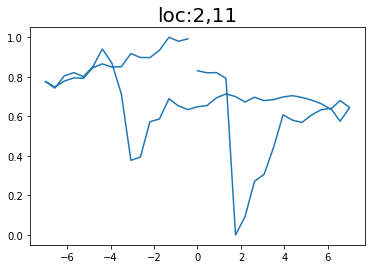

Epoch 1/200 ... Training loss: 1.7194
Epoch 10/200 ... Training loss: 1.6104
Epoch 20/200 ... Training loss: 1.5097
Epoch 30/200 ... Training loss: 1.3577
Epoch 40/200 ... Training loss: 1.1876
Epoch 50/200 ... Training loss: 1.0993
Epoch 60/200 ... Training loss: 0.9542
Epoch 70/200 ... Training loss: 0.8631
Epoch 80/200 ... Training loss: 0.7768
Epoch 90/200 ... Training loss: 0.7
Epoch 100/200 ... Training loss: 0.637
Epoch 110/200 ... Training loss: 0.573
Epoch 120/200 ... Training loss: 0.5039
Epoch 130/200 ... Training loss: 0.436
Epoch 140/200 ... Training loss: 0.3814
Epoch 150/200 ... Training loss: 0.3179
Epoch 160/200 ... Training loss: 0.2612
Epoch 170/200 ... Training loss: 0.1924
Epoch 180/200 ... Training loss: 0.1431
Epoch 190/200 ... Training loss: 0.0922
Epoch 200/200 ... Training loss: 0.0466
step:  65
Sample #75




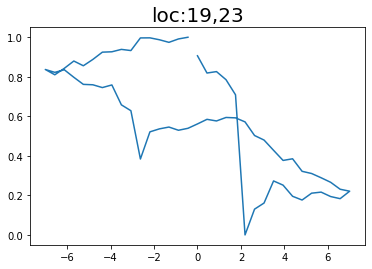

Epoch 1/200 ... Training loss: 1.7068
Epoch 10/200 ... Training loss: 1.5992
Epoch 20/200 ... Training loss: 1.498
Epoch 30/200 ... Training loss: 1.3541
Epoch 40/200 ... Training loss: 1.1886
Epoch 50/200 ... Training loss: 1.0868
Epoch 60/200 ... Training loss: 0.9728
Epoch 70/200 ... Training loss: 0.8754
Epoch 80/200 ... Training loss: 0.8024
Epoch 90/200 ... Training loss: 0.7185
Epoch 100/200 ... Training loss: 0.6455
Epoch 110/200 ... Training loss: 0.5778
Epoch 120/200 ... Training loss: 0.5032
Epoch 130/200 ... Training loss: 0.4595
Epoch 140/200 ... Training loss: 0.3974
Epoch 150/200 ... Training loss: 0.3383
Epoch 160/200 ... Training loss: 0.2538
Epoch 170/200 ... Training loss: 0.2395
Epoch 180/200 ... Training loss: 0.14
Epoch 190/200 ... Training loss: 0.0789
Epoch 200/200 ... Training loss: 0.0342
step:  66
Sample #76




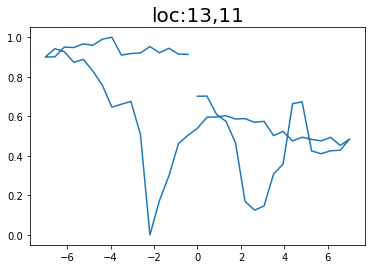

Epoch 1/200 ... Training loss: 1.6957
Epoch 10/200 ... Training loss: 1.5903
Epoch 20/200 ... Training loss: 1.5126
Epoch 30/200 ... Training loss: 1.3616
Epoch 40/200 ... Training loss: 1.2079
Epoch 50/200 ... Training loss: 1.1129
Epoch 60/200 ... Training loss: 0.9781
Epoch 70/200 ... Training loss: 0.9136
Epoch 80/200 ... Training loss: 0.8125
Epoch 90/200 ... Training loss: 0.7263
Epoch 100/200 ... Training loss: 0.6551
Epoch 110/200 ... Training loss: 0.6048
Epoch 120/200 ... Training loss: 0.5299
Epoch 130/200 ... Training loss: 0.6267
Epoch 140/200 ... Training loss: 0.44
Epoch 150/200 ... Training loss: 0.3741
Epoch 160/200 ... Training loss: 0.3042
Epoch 170/200 ... Training loss: 0.2548
Epoch 180/200 ... Training loss: 0.2102
Epoch 190/200 ... Training loss: 0.2297
Epoch 200/200 ... Training loss: 0.141
step:  67
Sample #77




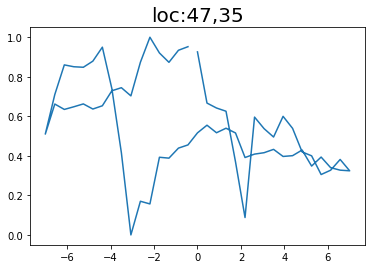

Epoch 1/200 ... Training loss: 1.6887
Epoch 10/200 ... Training loss: 1.5839
Epoch 20/200 ... Training loss: 1.4973
Epoch 30/200 ... Training loss: 1.3358
Epoch 40/200 ... Training loss: 1.2244
Epoch 50/200 ... Training loss: 1.1346
Epoch 60/200 ... Training loss: 1.0042
Epoch 70/200 ... Training loss: 0.9072
Epoch 80/200 ... Training loss: 0.8221
Epoch 90/200 ... Training loss: 0.7651
Epoch 100/200 ... Training loss: 0.6591
Epoch 110/200 ... Training loss: 0.6064
Epoch 120/200 ... Training loss: 0.5312
Epoch 130/200 ... Training loss: 0.4801
Epoch 140/200 ... Training loss: 0.4733
Epoch 150/200 ... Training loss: 0.3828
Epoch 160/200 ... Training loss: 0.3781
Epoch 170/200 ... Training loss: 0.3283
Epoch 180/200 ... Training loss: 0.2147
Epoch 190/200 ... Training loss: 0.136
Epoch 200/200 ... Training loss: 0.0844
step:  68
Sample #78




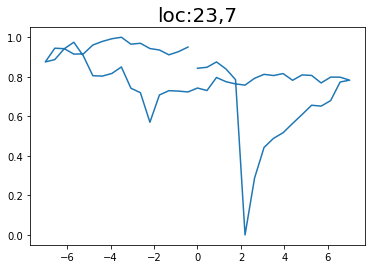

Epoch 1/200 ... Training loss: 1.6785
Epoch 10/200 ... Training loss: 1.5719
Epoch 20/200 ... Training loss: 1.4702
Epoch 30/200 ... Training loss: 1.3197
Epoch 40/200 ... Training loss: 1.1659
Epoch 50/200 ... Training loss: 1.0218
Epoch 60/200 ... Training loss: 0.9106
Epoch 70/200 ... Training loss: 0.8215
Epoch 80/200 ... Training loss: 0.7656
Epoch 90/200 ... Training loss: 0.6817
Epoch 100/200 ... Training loss: 0.6059
Epoch 110/200 ... Training loss: 0.5367
Epoch 120/200 ... Training loss: 0.473
Epoch 130/200 ... Training loss: 0.4363
Epoch 140/200 ... Training loss: 0.3546
Epoch 150/200 ... Training loss: 0.3072
Epoch 160/200 ... Training loss: 0.2257
Epoch 170/200 ... Training loss: 0.1965
Epoch 180/200 ... Training loss: 0.1323
Epoch 190/200 ... Training loss: 0.062
Epoch 200/200 ... Training loss: -0.007
step:  69
Sample #79




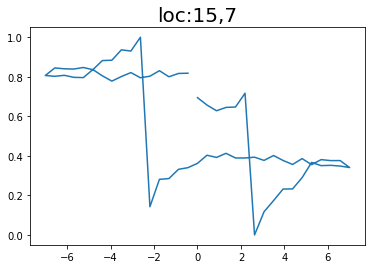

Epoch 1/200 ... Training loss: 1.6711
Epoch 10/200 ... Training loss: 1.5209
Epoch 20/200 ... Training loss: 1.3397
Epoch 30/200 ... Training loss: 1.2618
Epoch 40/200 ... Training loss: 1.0425
Epoch 50/200 ... Training loss: 0.9341
Epoch 60/200 ... Training loss: 0.8636
Epoch 70/200 ... Training loss: 0.7642
Epoch 80/200 ... Training loss: 0.6901
Epoch 90/200 ... Training loss: 0.6246
Epoch 100/200 ... Training loss: 0.5702
Epoch 110/200 ... Training loss: 0.5034
Epoch 120/200 ... Training loss: 0.4484
Epoch 130/200 ... Training loss: 0.385
Epoch 140/200 ... Training loss: 0.32
Epoch 150/200 ... Training loss: 0.365
Epoch 160/200 ... Training loss: 0.2092
Epoch 170/200 ... Training loss: 0.1524
Epoch 180/200 ... Training loss: 0.1089
Epoch 190/200 ... Training loss: 0.0383
Epoch 200/200 ... Training loss: -0.0078
step:  70
Sample #80




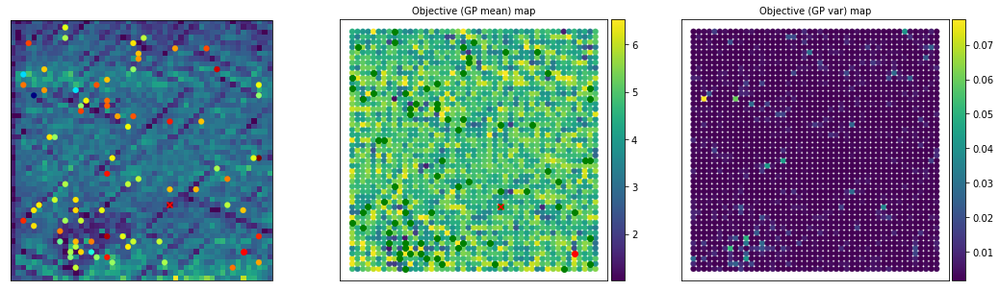

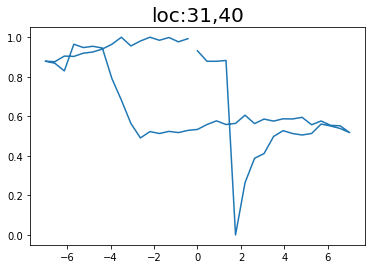

Epoch 1/200 ... Training loss: 1.6907
Epoch 10/200 ... Training loss: 1.5306
Epoch 20/200 ... Training loss: 1.3498
Epoch 30/200 ... Training loss: 1.1739
Epoch 40/200 ... Training loss: 1.0779
Epoch 50/200 ... Training loss: 0.953
Epoch 60/200 ... Training loss: 0.8523
Epoch 70/200 ... Training loss: 0.7825
Epoch 80/200 ... Training loss: 0.705
Epoch 90/200 ... Training loss: 0.6383
Epoch 100/200 ... Training loss: 0.5806
Epoch 110/200 ... Training loss: 0.5467
Epoch 120/200 ... Training loss: 0.4604
Epoch 130/200 ... Training loss: 0.3955
Epoch 140/200 ... Training loss: 0.3311
Epoch 150/200 ... Training loss: 0.2728
Epoch 160/200 ... Training loss: 0.2161
Epoch 170/200 ... Training loss: 0.1998
Epoch 180/200 ... Training loss: 0.1296
Epoch 190/200 ... Training loss: 0.0506
Epoch 200/200 ... Training loss: 0.0325
step:  71
Sample #81




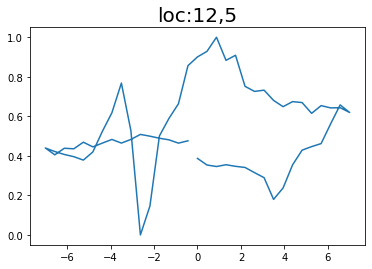

Epoch 1/200 ... Training loss: 1.6822
Epoch 10/200 ... Training loss: 1.5676
Epoch 20/200 ... Training loss: 1.4142
Epoch 30/200 ... Training loss: 1.2454
Epoch 40/200 ... Training loss: 1.0888
Epoch 50/200 ... Training loss: 0.9738
Epoch 60/200 ... Training loss: 0.9036
Epoch 70/200 ... Training loss: 0.8023
Epoch 80/200 ... Training loss: 0.7251
Epoch 90/200 ... Training loss: 0.658
Epoch 100/200 ... Training loss: 0.5999
Epoch 110/200 ... Training loss: 0.5326
Epoch 120/200 ... Training loss: 0.4872
Epoch 130/200 ... Training loss: 0.4083
Epoch 140/200 ... Training loss: 0.3766
Epoch 150/200 ... Training loss: 0.2992
Epoch 160/200 ... Training loss: 0.2575
Epoch 170/200 ... Training loss: 0.1756
Epoch 180/200 ... Training loss: 0.1561
Epoch 190/200 ... Training loss: 0.0904
Epoch 200/200 ... Training loss: 0.027
step:  72
Sample #82




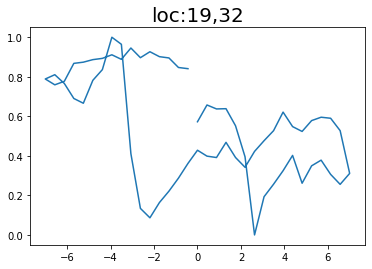

Epoch 1/200 ... Training loss: 1.7063
Epoch 10/200 ... Training loss: 1.5568
Epoch 20/200 ... Training loss: 1.4025
Epoch 30/200 ... Training loss: 1.2555
Epoch 40/200 ... Training loss: 1.1448
Epoch 50/200 ... Training loss: 1.0154
Epoch 60/200 ... Training loss: 0.9051
Epoch 70/200 ... Training loss: 0.8335
Epoch 80/200 ... Training loss: 0.7606
Epoch 90/200 ... Training loss: 0.6894
Epoch 100/200 ... Training loss: 0.6875
Epoch 110/200 ... Training loss: 0.5699
Epoch 120/200 ... Training loss: 0.5639
Epoch 130/200 ... Training loss: 0.4422
Epoch 140/200 ... Training loss: 0.3896
Epoch 150/200 ... Training loss: 0.3366
Epoch 160/200 ... Training loss: 0.284
Epoch 170/200 ... Training loss: 0.2519
Epoch 180/200 ... Training loss: 0.1683
Epoch 190/200 ... Training loss: 0.1218
Epoch 200/200 ... Training loss: 0.088
step:  73
Sample #83




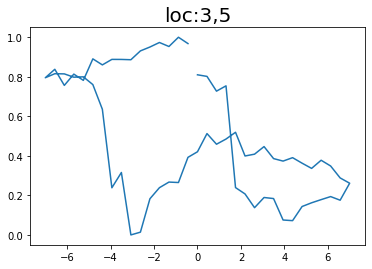

Epoch 1/200 ... Training loss: 1.6953
Epoch 10/200 ... Training loss: 1.5186
Epoch 20/200 ... Training loss: 1.3716
Epoch 30/200 ... Training loss: 1.2073
Epoch 40/200 ... Training loss: 1.1137
Epoch 50/200 ... Training loss: 1.0114
Epoch 60/200 ... Training loss: 0.9058
Epoch 70/200 ... Training loss: 0.8388
Epoch 80/200 ... Training loss: 0.7611
Epoch 90/200 ... Training loss: 0.6857
Epoch 100/200 ... Training loss: 0.6212
Epoch 110/200 ... Training loss: 0.574
Epoch 120/200 ... Training loss: 0.5077
Epoch 130/200 ... Training loss: 0.4373
Epoch 140/200 ... Training loss: 0.3938
Epoch 150/200 ... Training loss: 0.4141
Epoch 160/200 ... Training loss: 0.274
Epoch 170/200 ... Training loss: 0.2742
Epoch 180/200 ... Training loss: 0.2061
Epoch 190/200 ... Training loss: 0.1112
Epoch 200/200 ... Training loss: 0.089
step:  74
Sample #84




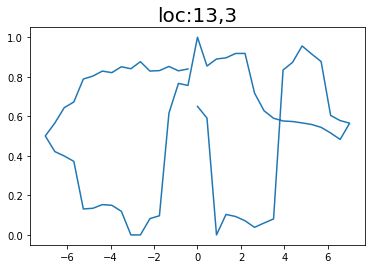

Epoch 1/200 ... Training loss: 1.7266
Epoch 10/200 ... Training loss: 1.6532
Epoch 20/200 ... Training loss: 1.5637
Epoch 30/200 ... Training loss: 1.4283
Epoch 40/200 ... Training loss: 1.2983
Epoch 50/200 ... Training loss: 1.1945
Epoch 60/200 ... Training loss: 1.0746
Epoch 70/200 ... Training loss: 1.0232
Epoch 80/200 ... Training loss: 0.9137
Epoch 90/200 ... Training loss: 0.8502
Epoch 100/200 ... Training loss: 0.8041
Epoch 110/200 ... Training loss: 0.6971
Epoch 120/200 ... Training loss: 0.6334
Epoch 130/200 ... Training loss: 0.563
Epoch 140/200 ... Training loss: 0.5949
Epoch 150/200 ... Training loss: 0.4703
Epoch 160/200 ... Training loss: 0.3814
Epoch 170/200 ... Training loss: 0.343
Epoch 180/200 ... Training loss: 0.2781
Epoch 190/200 ... Training loss: 0.2452
Epoch 200/200 ... Training loss: 0.2501
step:  75
Sample #85




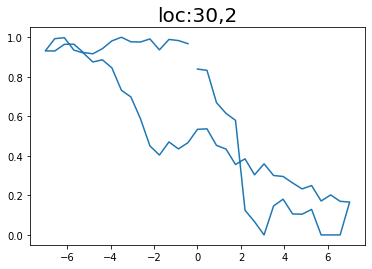

Epoch 1/200 ... Training loss: 1.716
Epoch 10/200 ... Training loss: 1.6414
Epoch 20/200 ... Training loss: 1.5409
Epoch 30/200 ... Training loss: 1.3938
Epoch 40/200 ... Training loss: 1.2423
Epoch 50/200 ... Training loss: 1.1874
Epoch 60/200 ... Training loss: 1.0513
Epoch 70/200 ... Training loss: 0.9819
Epoch 80/200 ... Training loss: 0.8723
Epoch 90/200 ... Training loss: 0.7831
Epoch 100/200 ... Training loss: 0.7157
Epoch 110/200 ... Training loss: 0.6401
Epoch 120/200 ... Training loss: 0.7215
Epoch 130/200 ... Training loss: 0.5514
Epoch 140/200 ... Training loss: 0.474
Epoch 150/200 ... Training loss: 0.4504
Epoch 160/200 ... Training loss: 0.3921
Epoch 170/200 ... Training loss: 0.3026
Epoch 180/200 ... Training loss: 0.2939
Epoch 190/200 ... Training loss: 0.1884
Epoch 200/200 ... Training loss: 0.1538
step:  76
Sample #86




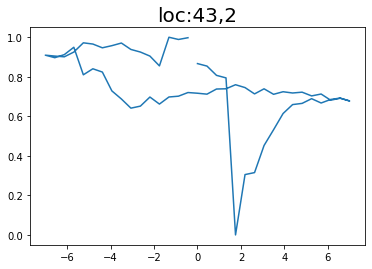

Epoch 1/200 ... Training loss: 1.7063
Epoch 10/200 ... Training loss: 1.6403
Epoch 20/200 ... Training loss: 1.5613
Epoch 30/200 ... Training loss: 1.4874
Epoch 40/200 ... Training loss: 1.3996
Epoch 50/200 ... Training loss: 1.3374
Epoch 60/200 ... Training loss: 1.1155
Epoch 70/200 ... Training loss: 0.9829
Epoch 80/200 ... Training loss: 0.9021
Epoch 90/200 ... Training loss: 0.8729
Epoch 100/200 ... Training loss: 0.7504
Epoch 110/200 ... Training loss: 0.6706
Epoch 120/200 ... Training loss: 0.5964
Epoch 130/200 ... Training loss: 0.562
Epoch 140/200 ... Training loss: 0.4664
Epoch 150/200 ... Training loss: 0.411
Epoch 160/200 ... Training loss: 0.3509
Epoch 170/200 ... Training loss: 0.2845
Epoch 180/200 ... Training loss: 0.2345
Epoch 190/200 ... Training loss: 0.3038
Epoch 200/200 ... Training loss: 0.1576
step:  77
Sample #87




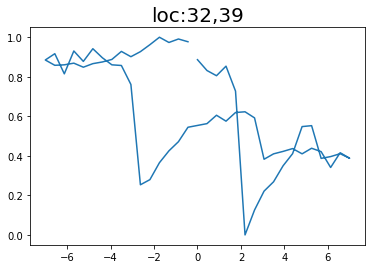

Epoch 1/200 ... Training loss: 1.6955
Epoch 10/200 ... Training loss: 1.6312
Epoch 20/200 ... Training loss: 1.5575
Epoch 30/200 ... Training loss: 1.4864
Epoch 40/200 ... Training loss: 1.3876
Epoch 50/200 ... Training loss: 1.211
Epoch 60/200 ... Training loss: 1.068
Epoch 70/200 ... Training loss: 0.9644
Epoch 80/200 ... Training loss: 0.9093
Epoch 90/200 ... Training loss: 0.825
Epoch 100/200 ... Training loss: 0.7433
Epoch 110/200 ... Training loss: 0.7206
Epoch 120/200 ... Training loss: 0.6602
Epoch 130/200 ... Training loss: 0.5568
Epoch 140/200 ... Training loss: 0.4859
Epoch 150/200 ... Training loss: 0.4369
Epoch 160/200 ... Training loss: 0.3901
Epoch 170/200 ... Training loss: 0.3182
Epoch 180/200 ... Training loss: 0.3427
Epoch 190/200 ... Training loss: 0.2123
Epoch 200/200 ... Training loss: 0.1436
step:  78
Sample #88




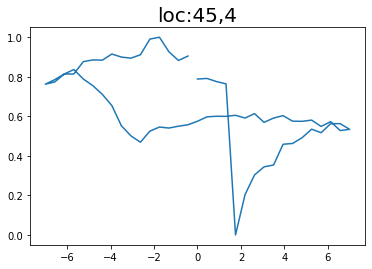

Epoch 1/200 ... Training loss: 1.701
Epoch 10/200 ... Training loss: 1.6331
Epoch 20/200 ... Training loss: 1.555
Epoch 30/200 ... Training loss: 1.4581
Epoch 40/200 ... Training loss: 1.3095
Epoch 50/200 ... Training loss: 1.1785
Epoch 60/200 ... Training loss: 1.1124
Epoch 70/200 ... Training loss: 0.9943
Epoch 80/200 ... Training loss: 0.9406
Epoch 90/200 ... Training loss: 0.8291
Epoch 100/200 ... Training loss: 0.7536
Epoch 110/200 ... Training loss: 0.6733
Epoch 120/200 ... Training loss: 0.6058
Epoch 130/200 ... Training loss: 0.5283
Epoch 140/200 ... Training loss: 0.4663
Epoch 150/200 ... Training loss: 0.4242
Epoch 160/200 ... Training loss: 0.3544
Epoch 170/200 ... Training loss: 0.2927
Epoch 180/200 ... Training loss: 0.2723
Epoch 190/200 ... Training loss: 0.1916
Epoch 200/200 ... Training loss: 0.1204
step:  79
Sample #89




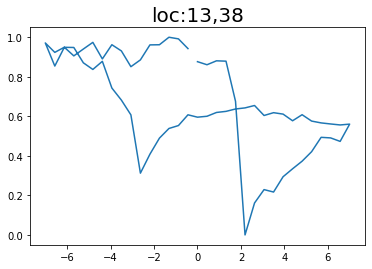

Epoch 1/200 ... Training loss: 1.6919
Epoch 10/200 ... Training loss: 1.6276
Epoch 20/200 ... Training loss: 1.5513
Epoch 30/200 ... Training loss: 1.4726
Epoch 40/200 ... Training loss: 1.2576
Epoch 50/200 ... Training loss: 1.2832
Epoch 60/200 ... Training loss: 1.1139
Epoch 70/200 ... Training loss: 0.9663
Epoch 80/200 ... Training loss: 0.8845
Epoch 90/200 ... Training loss: 0.8058
Epoch 100/200 ... Training loss: 0.7327
Epoch 110/200 ... Training loss: 0.6561
Epoch 120/200 ... Training loss: 0.5886
Epoch 130/200 ... Training loss: 0.517
Epoch 140/200 ... Training loss: 0.4581
Epoch 150/200 ... Training loss: 0.411
Epoch 160/200 ... Training loss: 0.3331
Epoch 170/200 ... Training loss: 0.3091
Epoch 180/200 ... Training loss: 0.2172
Epoch 190/200 ... Training loss: 0.1799
Epoch 200/200 ... Training loss: 0.1027
step:  80
Sample #90




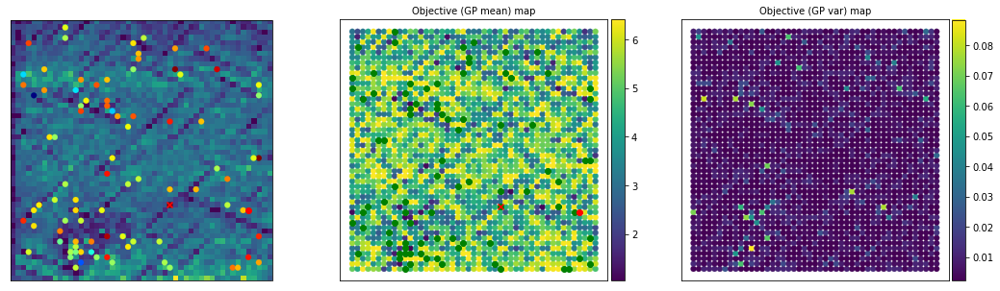

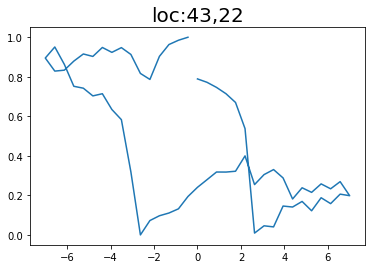

Epoch 1/200 ... Training loss: 1.6952
Epoch 10/200 ... Training loss: 1.6346
Epoch 20/200 ... Training loss: 1.5664
Epoch 30/200 ... Training loss: 1.4822
Epoch 40/200 ... Training loss: 1.3595
Epoch 50/200 ... Training loss: 1.2375
Epoch 60/200 ... Training loss: 1.134
Epoch 70/200 ... Training loss: 1.01
Epoch 80/200 ... Training loss: 0.9429
Epoch 90/200 ... Training loss: 0.8491
Epoch 100/200 ... Training loss: 0.7429
Epoch 110/200 ... Training loss: 0.6893
Epoch 120/200 ... Training loss: 0.6299
Epoch 130/200 ... Training loss: 0.5458
Epoch 140/200 ... Training loss: 0.5027
Epoch 150/200 ... Training loss: 0.4243
Epoch 160/200 ... Training loss: 0.3621
Epoch 170/200 ... Training loss: 0.2944
Epoch 180/200 ... Training loss: 0.2628
Epoch 190/200 ... Training loss: 0.3808
Epoch 200/200 ... Training loss: 0.2407
step:  81
Sample #91




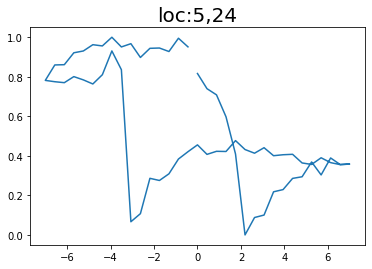

Epoch 1/200 ... Training loss: 1.6857
Epoch 10/200 ... Training loss: 1.6249
Epoch 20/200 ... Training loss: 1.5543
Epoch 30/200 ... Training loss: 1.4651
Epoch 40/200 ... Training loss: 1.3296
Epoch 50/200 ... Training loss: 1.2258
Epoch 60/200 ... Training loss: 1.1147
Epoch 70/200 ... Training loss: 0.9706
Epoch 80/200 ... Training loss: 0.8938
Epoch 90/200 ... Training loss: 0.811
Epoch 100/200 ... Training loss: 0.7409
Epoch 110/200 ... Training loss: 0.6699
Epoch 120/200 ... Training loss: 0.5939
Epoch 130/200 ... Training loss: 0.5625
Epoch 140/200 ... Training loss: 0.513
Epoch 150/200 ... Training loss: 0.4228
Epoch 160/200 ... Training loss: 0.3497
Epoch 170/200 ... Training loss: 0.2907
Epoch 180/200 ... Training loss: 0.2831
Epoch 190/200 ... Training loss: 0.1897
Epoch 200/200 ... Training loss: 0.1807
step:  82
Sample #92




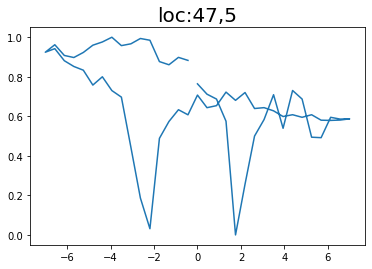

Epoch 1/200 ... Training loss: 1.6904
Epoch 10/200 ... Training loss: 1.6913
Epoch 20/200 ... Training loss: 1.6131
Epoch 30/200 ... Training loss: 1.5523
Epoch 40/200 ... Training loss: 1.4912
Epoch 50/200 ... Training loss: 1.4233
Epoch 60/200 ... Training loss: 1.3346
Epoch 70/200 ... Training loss: 1.1657
Epoch 80/200 ... Training loss: 1.0133
Epoch 90/200 ... Training loss: 0.9235
Epoch 100/200 ... Training loss: 0.8454
Epoch 110/200 ... Training loss: 0.7884
Epoch 120/200 ... Training loss: 0.717
Epoch 130/200 ... Training loss: 0.6329
Epoch 140/200 ... Training loss: 0.5645
Epoch 150/200 ... Training loss: 0.5365
Epoch 160/200 ... Training loss: 0.4437
Epoch 170/200 ... Training loss: 0.3733
Epoch 180/200 ... Training loss: 0.3328
Epoch 190/200 ... Training loss: 0.258
Epoch 200/200 ... Training loss: 0.2086
step:  83
Sample #93




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


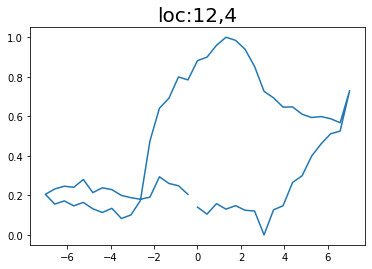

Epoch 1/200 ... Training loss: 1.733
Epoch 10/200 ... Training loss: 1.6364
Epoch 20/200 ... Training loss: 1.4782
Epoch 30/200 ... Training loss: 1.3214
Epoch 40/200 ... Training loss: 1.2073
Epoch 50/200 ... Training loss: 1.1126
Epoch 60/200 ... Training loss: 0.9982
Epoch 70/200 ... Training loss: 0.9292
Epoch 80/200 ... Training loss: 0.8362
Epoch 90/200 ... Training loss: 0.7737
Epoch 100/200 ... Training loss: 0.7032
Epoch 110/200 ... Training loss: 0.638
Epoch 120/200 ... Training loss: 0.5637
Epoch 130/200 ... Training loss: 0.5461
Epoch 140/200 ... Training loss: 0.4592
Epoch 150/200 ... Training loss: 0.3943
Epoch 160/200 ... Training loss: 0.3277
Epoch 170/200 ... Training loss: 0.2824
Epoch 180/200 ... Training loss: 0.2372
Epoch 190/200 ... Training loss: 0.2391
Epoch 200/200 ... Training loss: 0.1328
step:  84
Sample #94




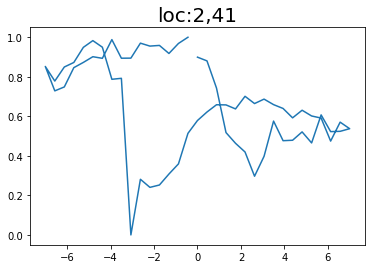

Epoch 1/200 ... Training loss: 1.7232
Epoch 10/200 ... Training loss: 1.6261
Epoch 20/200 ... Training loss: 1.4654
Epoch 30/200 ... Training loss: 1.3051
Epoch 40/200 ... Training loss: 1.1884
Epoch 50/200 ... Training loss: 1.1783
Epoch 60/200 ... Training loss: 1.0036
Epoch 70/200 ... Training loss: 0.9273
Epoch 80/200 ... Training loss: 0.8466
Epoch 90/200 ... Training loss: 0.7502
Epoch 100/200 ... Training loss: 0.6748
Epoch 110/200 ... Training loss: 0.6262
Epoch 120/200 ... Training loss: 0.5457
Epoch 130/200 ... Training loss: 0.491
Epoch 140/200 ... Training loss: 0.4443
Epoch 150/200 ... Training loss: 0.4087
Epoch 160/200 ... Training loss: 0.3376
Epoch 170/200 ... Training loss: 0.2699
Epoch 180/200 ... Training loss: 0.3295
Epoch 190/200 ... Training loss: 0.2185
Epoch 200/200 ... Training loss: 0.1438
step:  85
Sample #95




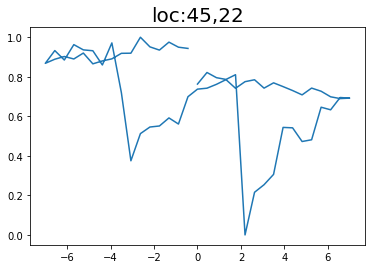

Epoch 1/200 ... Training loss: 1.7203
Epoch 10/200 ... Training loss: 1.6339
Epoch 20/200 ... Training loss: 1.5075
Epoch 30/200 ... Training loss: 1.3378
Epoch 40/200 ... Training loss: 1.2227
Epoch 50/200 ... Training loss: 1.1409
Epoch 60/200 ... Training loss: 0.9953
Epoch 70/200 ... Training loss: 1.0231
Epoch 80/200 ... Training loss: 0.8537
Epoch 90/200 ... Training loss: 0.769
Epoch 100/200 ... Training loss: 0.7018
Epoch 110/200 ... Training loss: 0.6215
Epoch 120/200 ... Training loss: 0.5591
Epoch 130/200 ... Training loss: 0.5068
Epoch 140/200 ... Training loss: 0.4696
Epoch 150/200 ... Training loss: 0.4002
Epoch 160/200 ... Training loss: 0.4001
Epoch 170/200 ... Training loss: 0.326
Epoch 180/200 ... Training loss: 0.2398
Epoch 190/200 ... Training loss: 0.2035
Epoch 200/200 ... Training loss: 0.1269
step:  86
Sample #96




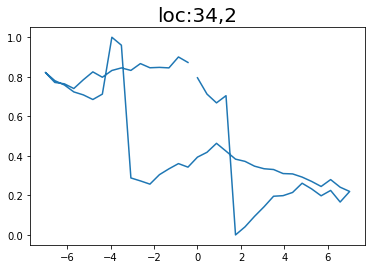

Epoch 1/200 ... Training loss: 1.7153
Epoch 10/200 ... Training loss: 1.5782
Epoch 20/200 ... Training loss: 1.4449
Epoch 30/200 ... Training loss: 1.2903
Epoch 40/200 ... Training loss: 1.1788
Epoch 50/200 ... Training loss: 1.0979
Epoch 60/200 ... Training loss: 0.9611
Epoch 70/200 ... Training loss: 0.8636
Epoch 80/200 ... Training loss: 0.829
Epoch 90/200 ... Training loss: 0.7368
Epoch 100/200 ... Training loss: 0.6632
Epoch 110/200 ... Training loss: 0.5987
Epoch 120/200 ... Training loss: 0.5413
Epoch 130/200 ... Training loss: 0.4778
Epoch 140/200 ... Training loss: 0.4931
Epoch 150/200 ... Training loss: 0.3734
Epoch 160/200 ... Training loss: 0.3297
Epoch 170/200 ... Training loss: 0.2793
Epoch 180/200 ... Training loss: 0.2064
Epoch 190/200 ... Training loss: 0.1406
Epoch 200/200 ... Training loss: 0.0951
step:  87
Sample #97




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


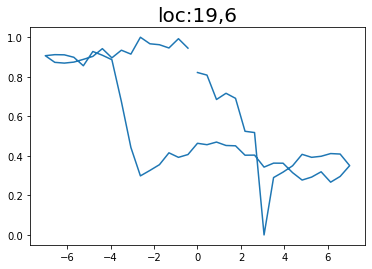

Epoch 1/200 ... Training loss: 1.7063
Epoch 10/200 ... Training loss: 1.591
Epoch 20/200 ... Training loss: 1.4955
Epoch 30/200 ... Training loss: 1.3241
Epoch 40/200 ... Training loss: 1.2178
Epoch 50/200 ... Training loss: 1.0974
Epoch 60/200 ... Training loss: 0.9948
Epoch 70/200 ... Training loss: 0.9173
Epoch 80/200 ... Training loss: 0.8773
Epoch 90/200 ... Training loss: 0.8103
Epoch 100/200 ... Training loss: 0.7048
Epoch 110/200 ... Training loss: 0.7178
Epoch 120/200 ... Training loss: 0.5873
Epoch 130/200 ... Training loss: 0.5065
Epoch 140/200 ... Training loss: 0.5124
Epoch 150/200 ... Training loss: 0.4309
Epoch 160/200 ... Training loss: 0.3585
Epoch 170/200 ... Training loss: 0.2731
Epoch 180/200 ... Training loss: 0.2556
Epoch 190/200 ... Training loss: 0.1805
Epoch 200/200 ... Training loss: 0.1459
step:  88
Sample #98




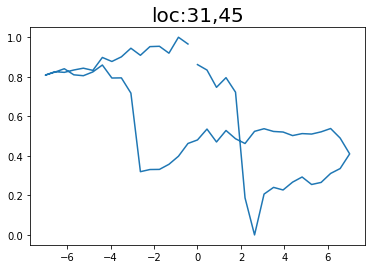

Epoch 1/200 ... Training loss: 1.6991
Epoch 10/200 ... Training loss: 1.5866
Epoch 20/200 ... Training loss: 1.4775
Epoch 30/200 ... Training loss: 1.3138
Epoch 40/200 ... Training loss: 1.1715
Epoch 50/200 ... Training loss: 1.053
Epoch 60/200 ... Training loss: 0.9736
Epoch 70/200 ... Training loss: 0.8757
Epoch 80/200 ... Training loss: 0.8357
Epoch 90/200 ... Training loss: 0.7544
Epoch 100/200 ... Training loss: 0.6715
Epoch 110/200 ... Training loss: 0.6325
Epoch 120/200 ... Training loss: 0.5609
Epoch 130/200 ... Training loss: 0.4806
Epoch 140/200 ... Training loss: 0.4315
Epoch 150/200 ... Training loss: 0.3824
Epoch 160/200 ... Training loss: 0.3095
Epoch 170/200 ... Training loss: 0.282
Epoch 180/200 ... Training loss: 0.1958
Epoch 190/200 ... Training loss: 0.2149
Epoch 200/200 ... Training loss: 0.1578
step:  89
Sample #99




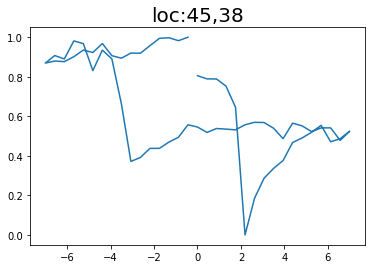

Epoch 1/200 ... Training loss: 1.6934
Epoch 10/200 ... Training loss: 1.6074
Epoch 20/200 ... Training loss: 1.4972
Epoch 30/200 ... Training loss: 1.3456
Epoch 40/200 ... Training loss: 1.1748
Epoch 50/200 ... Training loss: 1.0922
Epoch 60/200 ... Training loss: 1.0028
Epoch 70/200 ... Training loss: 0.9146
Epoch 80/200 ... Training loss: 0.8543
Epoch 90/200 ... Training loss: 0.8161
Epoch 100/200 ... Training loss: 0.719
Epoch 110/200 ... Training loss: 0.6428
Epoch 120/200 ... Training loss: 0.6113
Epoch 130/200 ... Training loss: 0.5684
Epoch 140/200 ... Training loss: 0.4648
Epoch 150/200 ... Training loss: 0.4269
Epoch 160/200 ... Training loss: 0.3417
Epoch 170/200 ... Training loss: 0.2874
Epoch 180/200 ... Training loss: 0.2709
Epoch 190/200 ... Training loss: 0.2704
Epoch 200/200 ... Training loss: 0.1212
step:  90
Sample #100




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


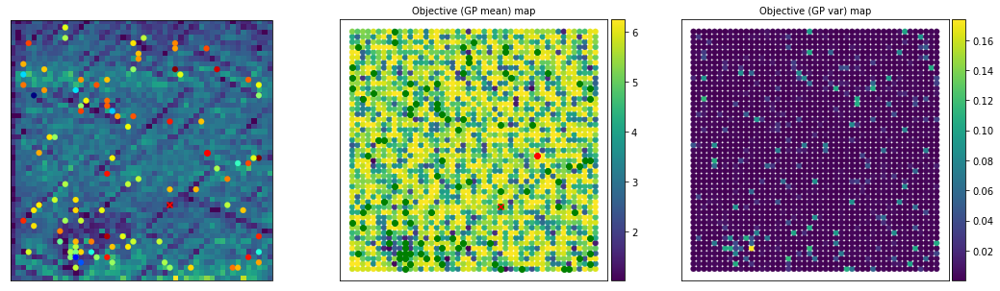

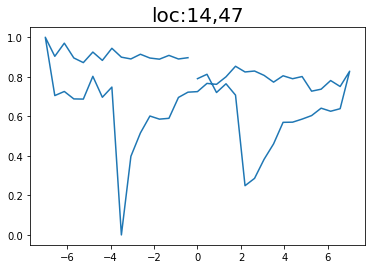

Epoch 1/200 ... Training loss: 1.6903
Epoch 10/200 ... Training loss: 1.6031
Epoch 20/200 ... Training loss: 1.493
Epoch 30/200 ... Training loss: 1.3538
Epoch 40/200 ... Training loss: 1.2107
Epoch 50/200 ... Training loss: 1.1358
Epoch 60/200 ... Training loss: 1.0183
Epoch 70/200 ... Training loss: 1.0187
Epoch 80/200 ... Training loss: 0.8838
Epoch 90/200 ... Training loss: 0.7972
Epoch 100/200 ... Training loss: 0.7512
Epoch 110/200 ... Training loss: 0.6492
Epoch 120/200 ... Training loss: 0.581
Epoch 130/200 ... Training loss: 0.5083
Epoch 140/200 ... Training loss: 0.4475
Epoch 150/200 ... Training loss: 0.3714
Epoch 160/200 ... Training loss: 0.3122
Epoch 170/200 ... Training loss: 0.2367
Epoch 180/200 ... Training loss: 0.1767
Epoch 190/200 ... Training loss: 0.156
Epoch 200/200 ... Training loss: 0.1201
step:  91
Sample #101




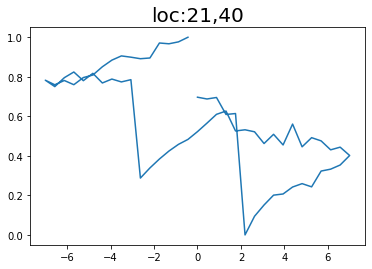

Epoch 1/200 ... Training loss: 1.6843
Epoch 10/200 ... Training loss: 1.5898
Epoch 20/200 ... Training loss: 1.465
Epoch 30/200 ... Training loss: 1.3149
Epoch 40/200 ... Training loss: 1.1577
Epoch 50/200 ... Training loss: 1.0453
Epoch 60/200 ... Training loss: 0.9452
Epoch 70/200 ... Training loss: 0.8627
Epoch 80/200 ... Training loss: 0.7898
Epoch 90/200 ... Training loss: 0.7407
Epoch 100/200 ... Training loss: 0.6596
Epoch 110/200 ... Training loss: 0.6289
Epoch 120/200 ... Training loss: 0.5476
Epoch 130/200 ... Training loss: 0.4836
Epoch 140/200 ... Training loss: 0.4227
Epoch 150/200 ... Training loss: 0.378
Epoch 160/200 ... Training loss: 0.3235
Epoch 170/200 ... Training loss: 0.2702
Epoch 180/200 ... Training loss: 0.247
Epoch 190/200 ... Training loss: 0.1984
Epoch 200/200 ... Training loss: 0.1297
step:  92
Sample #102




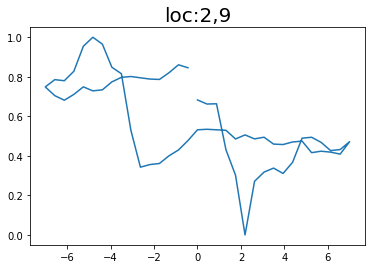

Epoch 1/200 ... Training loss: 1.6933
Epoch 10/200 ... Training loss: 1.6245
Epoch 20/200 ... Training loss: 1.5163
Epoch 30/200 ... Training loss: 1.4078
Epoch 40/200 ... Training loss: 1.2663
Epoch 50/200 ... Training loss: 1.1395
Epoch 60/200 ... Training loss: 1.0192
Epoch 70/200 ... Training loss: 0.9344
Epoch 80/200 ... Training loss: 0.9056
Epoch 90/200 ... Training loss: 0.7887
Epoch 100/200 ... Training loss: 0.7202
Epoch 110/200 ... Training loss: 0.7487
Epoch 120/200 ... Training loss: 0.6215
Epoch 130/200 ... Training loss: 0.5447
Epoch 140/200 ... Training loss: 0.4921
Epoch 150/200 ... Training loss: 0.4538
Epoch 160/200 ... Training loss: 0.4209
Epoch 170/200 ... Training loss: 0.3341
Epoch 180/200 ... Training loss: 0.2549
Epoch 190/200 ... Training loss: 0.2043
Epoch 200/200 ... Training loss: 0.1371
step:  93
Sample #103




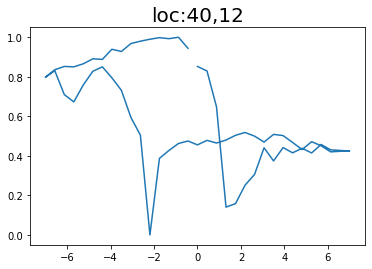

Epoch 1/200 ... Training loss: 1.6841
Epoch 10/200 ... Training loss: 1.6156
Epoch 20/200 ... Training loss: 1.5077
Epoch 30/200 ... Training loss: 1.3961
Epoch 40/200 ... Training loss: 1.257
Epoch 50/200 ... Training loss: 1.1201
Epoch 60/200 ... Training loss: 1.0076
Epoch 70/200 ... Training loss: 0.9208
Epoch 80/200 ... Training loss: 0.8249
Epoch 90/200 ... Training loss: 0.7525
Epoch 100/200 ... Training loss: 0.6997
Epoch 110/200 ... Training loss: 0.6346
Epoch 120/200 ... Training loss: 0.6099
Epoch 130/200 ... Training loss: 0.5224
Epoch 140/200 ... Training loss: 0.4524
Epoch 150/200 ... Training loss: 0.41
Epoch 160/200 ... Training loss: 0.3496
Epoch 170/200 ... Training loss: 0.3074
Epoch 180/200 ... Training loss: 0.2326
Epoch 190/200 ... Training loss: 0.1706
Epoch 200/200 ... Training loss: 0.1763
step:  94
Sample #104




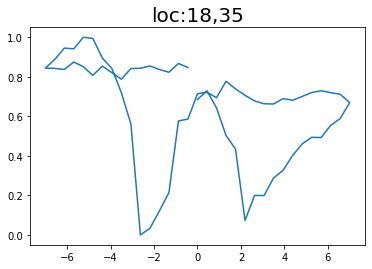

Epoch 1/200 ... Training loss: 1.6754
Epoch 10/200 ... Training loss: 1.6114
Epoch 20/200 ... Training loss: 1.5051
Epoch 30/200 ... Training loss: 1.3731
Epoch 40/200 ... Training loss: 1.2489
Epoch 50/200 ... Training loss: 1.1259
Epoch 60/200 ... Training loss: 1.0058
Epoch 70/200 ... Training loss: 0.8968
Epoch 80/200 ... Training loss: 0.8405
Epoch 90/200 ... Training loss: 0.7686
Epoch 100/200 ... Training loss: 0.6935
Epoch 110/200 ... Training loss: 0.6756
Epoch 120/200 ... Training loss: 0.5652
Epoch 130/200 ... Training loss: 0.5012
Epoch 140/200 ... Training loss: 0.4628
Epoch 150/200 ... Training loss: 0.3977
Epoch 160/200 ... Training loss: 0.3455
Epoch 170/200 ... Training loss: 0.283
Epoch 180/200 ... Training loss: 0.2471
Epoch 190/200 ... Training loss: 0.2146
Epoch 200/200 ... Training loss: 0.1462
step:  95
Sample #105




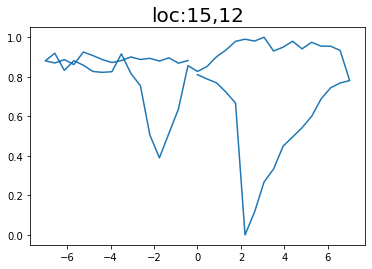

Epoch 1/200 ... Training loss: 1.6716
Epoch 10/200 ... Training loss: 1.5998
Epoch 20/200 ... Training loss: 1.4961
Epoch 30/200 ... Training loss: 1.3714
Epoch 40/200 ... Training loss: 1.2186
Epoch 50/200 ... Training loss: 1.1444
Epoch 60/200 ... Training loss: 1.0237
Epoch 70/200 ... Training loss: 0.9268
Epoch 80/200 ... Training loss: 0.9412
Epoch 90/200 ... Training loss: 0.801
Epoch 100/200 ... Training loss: 0.7149
Epoch 110/200 ... Training loss: 0.6281
Epoch 120/200 ... Training loss: 0.5806
Epoch 130/200 ... Training loss: 0.5608
Epoch 140/200 ... Training loss: 0.4592
Epoch 150/200 ... Training loss: 0.4133
Epoch 160/200 ... Training loss: 0.3423
Epoch 170/200 ... Training loss: 0.2899
Epoch 180/200 ... Training loss: 0.3724
Epoch 190/200 ... Training loss: 0.1743
Epoch 200/200 ... Training loss: 0.2375
step:  96
Sample #106




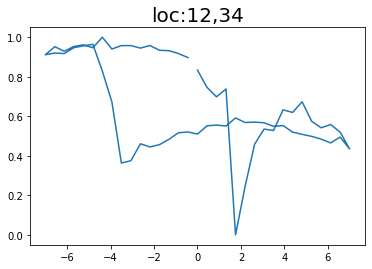

Epoch 1/200 ... Training loss: 1.6635
Epoch 10/200 ... Training loss: 1.5796
Epoch 20/200 ... Training loss: 1.4699
Epoch 30/200 ... Training loss: 1.3179
Epoch 40/200 ... Training loss: 1.1756
Epoch 50/200 ... Training loss: 1.1149
Epoch 60/200 ... Training loss: 0.9531
Epoch 70/200 ... Training loss: 0.8592
Epoch 80/200 ... Training loss: 0.7866
Epoch 90/200 ... Training loss: 0.7467
Epoch 100/200 ... Training loss: 0.6692
Epoch 110/200 ... Training loss: 0.5894
Epoch 120/200 ... Training loss: 0.5543
Epoch 130/200 ... Training loss: 0.4885
Epoch 140/200 ... Training loss: 0.4149
Epoch 150/200 ... Training loss: 0.3625
Epoch 160/200 ... Training loss: 0.3402
Epoch 170/200 ... Training loss: 0.2669
Epoch 180/200 ... Training loss: 0.2374
Epoch 190/200 ... Training loss: 0.151
Epoch 200/200 ... Training loss: 0.1457
step:  97
Sample #107




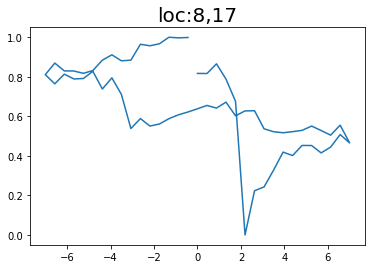

Epoch 1/200 ... Training loss: 1.6561
Epoch 10/200 ... Training loss: 1.5748
Epoch 20/200 ... Training loss: 1.4697
Epoch 30/200 ... Training loss: 1.3261
Epoch 40/200 ... Training loss: 1.1826
Epoch 50/200 ... Training loss: 1.1129
Epoch 60/200 ... Training loss: 0.9689
Epoch 70/200 ... Training loss: 0.8714
Epoch 80/200 ... Training loss: 0.8297
Epoch 90/200 ... Training loss: 0.7282
Epoch 100/200 ... Training loss: 0.6597
Epoch 110/200 ... Training loss: 0.6163
Epoch 120/200 ... Training loss: 0.5381
Epoch 130/200 ... Training loss: 0.4726
Epoch 140/200 ... Training loss: 0.4487
Epoch 150/200 ... Training loss: 0.3555
Epoch 160/200 ... Training loss: 0.4034
Epoch 170/200 ... Training loss: 0.2377
Epoch 180/200 ... Training loss: 0.1894
Epoch 190/200 ... Training loss: 0.1666
Epoch 200/200 ... Training loss: 0.1814
step:  98
Sample #108




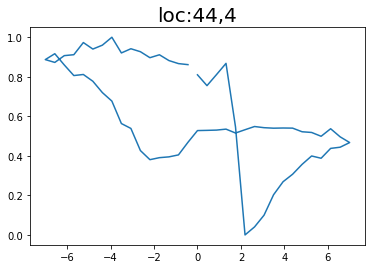

Epoch 1/200 ... Training loss: 1.6486
Epoch 10/200 ... Training loss: 1.5881
Epoch 20/200 ... Training loss: 1.4936
Epoch 30/200 ... Training loss: 1.3767
Epoch 40/200 ... Training loss: 1.2117
Epoch 50/200 ... Training loss: 1.1292
Epoch 60/200 ... Training loss: 1.0358
Epoch 70/200 ... Training loss: 0.931
Epoch 80/200 ... Training loss: 0.9082
Epoch 90/200 ... Training loss: 0.822
Epoch 100/200 ... Training loss: 0.7258
Epoch 110/200 ... Training loss: 0.7592
Epoch 120/200 ... Training loss: 0.6366
Epoch 130/200 ... Training loss: 0.5437
Epoch 140/200 ... Training loss: 0.5865
Epoch 150/200 ... Training loss: 0.5261
Epoch 160/200 ... Training loss: 0.4129
Epoch 170/200 ... Training loss: 0.3206
Epoch 180/200 ... Training loss: 0.2885
Epoch 190/200 ... Training loss: 0.2003
Epoch 200/200 ... Training loss: 0.2633
step:  99
Sample #109




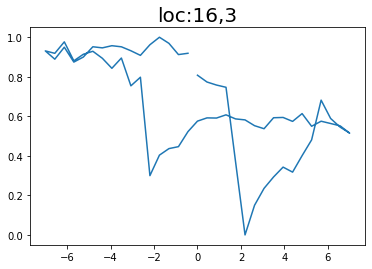

Epoch 1/200 ... Training loss: 1.641
Epoch 10/200 ... Training loss: 1.5118
Epoch 20/200 ... Training loss: 1.3992
Epoch 30/200 ... Training loss: 1.2438
Epoch 40/200 ... Training loss: 1.0764
Epoch 50/200 ... Training loss: 0.9687
Epoch 60/200 ... Training loss: 0.8861
Epoch 70/200 ... Training loss: 0.8261
Epoch 80/200 ... Training loss: 0.7464
Epoch 90/200 ... Training loss: 0.7016
Epoch 100/200 ... Training loss: 0.6225
Epoch 110/200 ... Training loss: 0.5639
Epoch 120/200 ... Training loss: 0.5848
Epoch 130/200 ... Training loss: 0.4518
Epoch 140/200 ... Training loss: 0.4357
Epoch 150/200 ... Training loss: 0.3298
Epoch 160/200 ... Training loss: 0.2628
Epoch 170/200 ... Training loss: 0.2288
Epoch 180/200 ... Training loss: 0.2573
Epoch 190/200 ... Training loss: 0.1098
Epoch 200/200 ... Training loss: 0.0364
step:  100
Sample #110




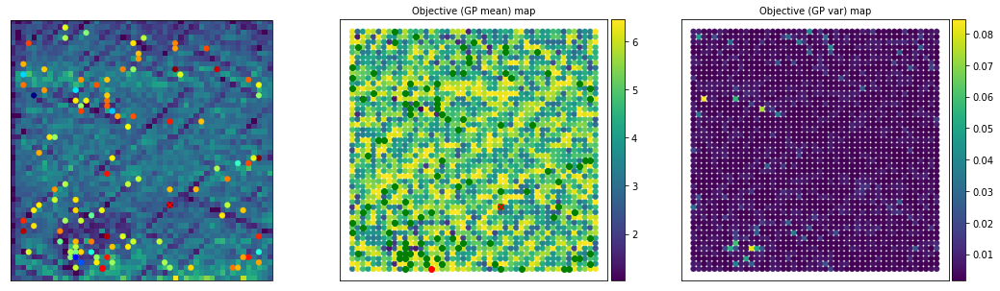

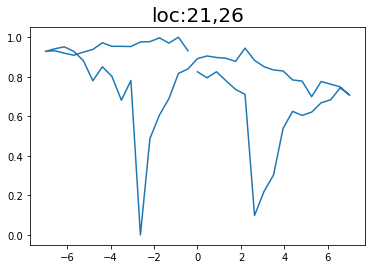

Epoch 1/200 ... Training loss: 1.6329
Epoch 10/200 ... Training loss: 1.5694
Epoch 20/200 ... Training loss: 1.471
Epoch 30/200 ... Training loss: 1.3313
Epoch 40/200 ... Training loss: 1.1764
Epoch 50/200 ... Training loss: 1.1221
Epoch 60/200 ... Training loss: 0.9837
Epoch 70/200 ... Training loss: 0.9028
Epoch 80/200 ... Training loss: 0.9309
Epoch 90/200 ... Training loss: 0.7974
Epoch 100/200 ... Training loss: 0.7095
Epoch 110/200 ... Training loss: 0.6819
Epoch 120/200 ... Training loss: 0.7549
Epoch 130/200 ... Training loss: 0.5581
Epoch 140/200 ... Training loss: 0.4587
Epoch 150/200 ... Training loss: 0.396
Epoch 160/200 ... Training loss: 0.3747
Epoch 170/200 ... Training loss: 0.2743
Epoch 180/200 ... Training loss: 0.2766
Epoch 190/200 ... Training loss: 0.158
Epoch 200/200 ... Training loss: 0.1052


#####----Max. sampling reached, model stopped----#####


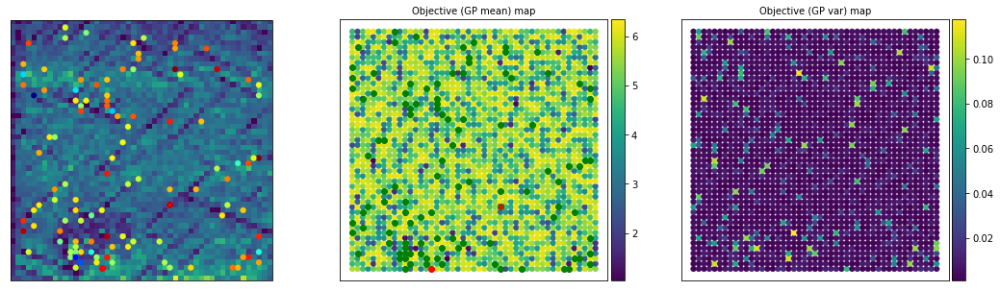

/usr/local/lib/python3.8/dist-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [ ]:
## Gp model fit
# Calling function to fit and optimizize Hyperparameter of Gaussian Process (using Adam optimizer)
# Input args- Torch arrays of normalized training data, parameter X and objective eval Y
# Output args- Gaussian process model lists
switch_obj_index = 0 # This is the index parameter to switch from 0 to 1 when the user satisfy with updating target
#Set up the surrogat emodel
gp_surro = play_varTBO.optimize_dKLgp(train_X_norm, train_Y[:, 0])

for i in range(1, N + 1):
    print("step: ", i)
    print("Sample #" + str(m + 1)+ "\n\n")
    # Calculate posterior for analysis for intermidiate iterations
    y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_surro, test_X_norm)
        
    #Plot every tenth iteration after running the evaluation
    if ((i == 1) or ((i % 10) == 0)):
        #This will estimate the surrogate
        X_eval, X_GP = play_varTBO.estimate(train_indices, train_Y, indices, y_pred_means)
        #print(X_eval, X_GP)
        fig = plot_results(train_indices, train_Y, indices, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)
        #put the savefig within the plot function
        #fig.savefig('acquisition_results_step=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
    #calculate acquisition function
    acq_cand, acq_val, EI_val = play_varTBO.acqmanEI(y_pred_means, y_pred_vars, train_Y, idx)
    val = acq_val
    ind = np.random.choice(acq_cand) # When multiple points have same acq values
    idx = np.hstack((idx, ind))
    #print(new_points_measured, idx)

    ## Find next point which maximizes the learning through exploration-exploitation
    if (i == 1):
        val_ini = val
      # Check for convergence
    if ((val) < 0):  # Stop for negligible expected improvement
        print("Model converged due to sufficient learning over search space ")
        break
    else:
        nextX = np.zeros((1, test_X.shape[1]))
        nextX_norm = np.zeros((1, test_X_norm.shape[1]))
        next_indices = np.zeros((1,2))
        nextX[0,:] = test_X[ind, :]
        nextX_norm [0, :] = test_X_norm[ind, :]
        next_indices[0, :] = indices[ind, :]
        idx_x = int(next_indices[0, 0])
        idx_y = int(next_indices[0, 1])

        next_loc = np.asarray([idx_x, idx_y])
        new_points_measured = idx
        
        #polarization loop area
        IV, points_measured = return_new_measurement(targets, new_points_measured)

        new_iv = IV[points_measured,:]

        #new_spec_x = torch.from_numpy(vdc_vec)
        #new_spec_y = torch.from_numpy(new_iv)[-1]

        new_spec_x = vdc_vec
        new_spec_y = new_iv[-1]

      
        new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
        
        #clear_output(wait=True) Comment out as I need to check the run in colab
        
        eval_spec_y[idx_x, idx_y, :] = new_spec_y
        # Evaluate true function for new data, augment data
        train_X, train_X_norm, train_indices, train_Y, var_params, switch_obj_index, m =\
        play_varTBO.augment_newdata_KL(nextX, nextX_norm, next_indices, train_X, train_X_norm, train_indices, train_Y,
                                        new_spec_x, new_spec_y, eval_spec_y, img, var_params, switch_obj_index, m)


        #print(next_indices)
        # Gp model fit
        # Updating GP with augmented training data
        gp_surro = play_varTBO.optimize_dKLgp(train_X_norm, train_Y[:, 0])

    ## Final posterior prediction after all the sampling done

if (i == N):
    print("\n\n#####----Max. sampling reached, model stopped----#####")

#Optimal GP learning
gp_opt = gp_surro
# Posterior calculation with converged GP model
y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_opt, test_X_norm)

# Plotting functions to check final iteration
X_opt, X_opt_GP = play_varTBO.estimate(train_indices, train_Y, indices, y_pred_means)
plot_results(train_indices, train_Y, indices, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)

explored_data = [train_indices, train_indices, train_Y]
final_GP_estim = [y_pred_means, y_pred_vars]
user_votes = var_params[1]
optim_results = [X_opt, X_opt_GP, user_votes, explored_data]

#Save few data
np.save("optim_results", optim_results)

# Classification

Text(0.5, 1.0, 'Image classification')

<Figure size 432x288 with 0 Axes>

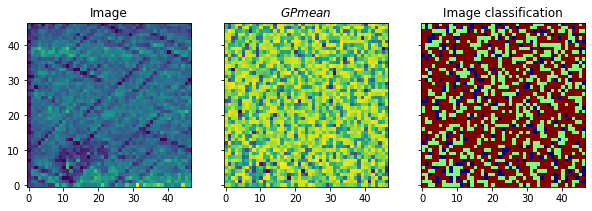

In [ ]:
z1_org = final_GP_estim[0]
d1 = int(z1_org.shape[0]**(1/2))
d2 = d1
z1_org = z1_org.reshape(d1,d2)
z1_org = (z1_org-np.min(z1_org))/(np.max(z1_org)-np.min(z1_org))

#Denoising the image using bilateral filter

z1 = denoise_bilateral(z1_org, sigma_color=0.05, sigma_spatial=5)


#Determining threshold from otsu algo to separate between foreground and background images
val1 = filters.threshold_multiotsu(z1, classes = 3)
emag_z1 = np.digitize(z1, bins=val1)

plt.figure()
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 15), sharex=True, sharey=True)

ax[0].imshow(img, origin = "lower")
ax[0].set_title("Image")
ax[1].imshow(z1_org, origin="lower", cmap="viridis")
ax[1].set_title("$GP mean$")
ax[2].imshow(emag_z1, origin="lower", cmap="jet")
ax[2].set_title("Image classification")



To note: this wont match with ground truth as we did not voted as per the region (color) in ground truth

In [ ]:
print(X_opt, X_opt_GP, var_params, explored_data, final_GP_estim)

[[14. 30.]] [[ 8. 18.]] [13.0, array([[1.],
       [1.],
       [2.],
       [0.],
       [1.],
       [0.],
       [0.],
       [0.],
       [2.],
       [2.],
       [2.],
       [0.],
       [2.]]), array([0.65926326, 0.64375092, 0.64431698, 0.61607209, 0.47075635,
       0.3483052 , 0.30289013, 0.33953165, 0.28478452, 0.32385541,
       0.34808202, 0.37556548, 0.39032457, 0.38625183, 0.40417849,
       0.391552  , 0.40322543, 0.41907021, 0.4280533 , 0.42649796,
       0.44213691, 0.45683439, 0.46504494, 0.46786733, 0.48217064,
       0.48157484, 0.49046457, 0.5013954 , 0.50455886, 0.49458566,
       0.49225684, 0.47891637, 0.45991966, 0.4248621 , 0.41375246,
       0.38707617, 0.3349744 , 0.48175603, 0.45120806, 0.42419168,
       0.63692155, 0.79084641, 0.85178926, 0.83950536, 0.85056406,
       0.83073726, 0.79580377, 0.68025714, 0.67324247, 0.6830296 ,
       0.70850345, 0.6964896 , 0.71492872, 0.71598432, 0.72369271,
       0.73694921, 0.75713081, 0.75873102, 0.77345734, 0.7640

#################################################################
Display best spectrals


<Figure size 432x288 with 0 Axes>

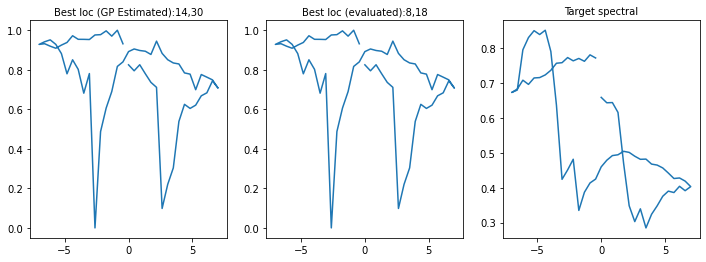

#################################################################
End of Analysis


In [ ]:
#Display
print("#################################################################")
print("Display best spectrals")
plt.figure()

fig,ax=plt.subplots(ncols=3,figsize=(12,4))

# #Optimal from estimated GP
idx1 = int(X_opt[0, 0])
idx2 = int(X_opt[0, 1])

#new_spec_x, new_spec_y = spec_simulator(img, spec_length, idx1, idx2)

ax[0].plot(new_spec_x, new_spec_y)
ax[0].set_title('Best loc (GP Estimated):' +str(idx1) +"," + str(idx2), fontsize = 10)

#Optimal from evaluated samples
idx1 = int(X_opt_GP[0, 0])
idx2 = int(X_opt_GP[0, 1])

#new_spec_x, new_spec_y = spec_simulator(img, spec_length, idx1, idx2)

ax[1].plot(new_spec_x, new_spec_y)
ax[1].set_title('Best loc (evaluated):' +str(idx1) +"," + str(idx2), fontsize = 10)

ax[2].plot(new_spec_x, var_params[2])
ax[2].set_title('Target spectral', fontsize = 10)
plt.show()
print("#################################################################")
print("End of Analysis")

In [7]:
!gdown https://drive.google.com/uc?id=1iR791jgsJibeoSiw60I_Df61HXk5Flok
pickle_file_loc = r'beps_ground_truth.p'
original_data = pickle.load(open(pickle_file_loc, "rb"))
beps_all = original_data['results_beps']

Downloading...
From: https://drive.google.com/uc?id=1iR791jgsJibeoSiw60I_Df61HXk5Flok
To: /content/beps_ground_truth.p
100% 827M/827M [00:06<00:00, 120MB/s]


In [31]:
spec_length = 64  #spectral data length

amp_slices = []
for ind in range(len(beps_all)):
    amp_slices.append(beps_all[ind][1][2])
amp_slices = np.array(amp_slices)
img = amp_slices[:,16].reshape(50,50)

vdc_full = np.array(beps_all[0][1][0])
vdc_vec = vdc_full[-64:]

amp_mat = amp_slices[:,-128:][:,1::2]
amp_masked = np.zeros_like(amp_mat)


spec_length = amp_mat.shape[-1]  #spectral data length
specim = np.reshape(amp_mat, (img.shape[0], img.shape[1], spec_length))

print(img.shape, vdc_vec.shape, amp_slices.shape, specim.shape)

(50, 50) (64,) (2500, 256) (50, 50, 64)


In [ ]:
window_size = 4

coordinates = aoi.utils.get_coord_grid(img, step=1, return_dict=False)
features, targets, indices = aoi.utils.extract_patches_and_spectra(
    specim, img, coordinates=coordinates, window_size=window_size, avg_pool=1)

features.shape, targets.shape

In [10]:
norm_ = lambda x: (x - x.min()) / x.ptp()
features, targets = norm_(features), norm_(targets)

In [13]:
n, d1, d2 = features.shape
num_start = int(10)
N = int(100)
m = 0
spec_length = 64  #spectral data length



spec_length = amp_mat.shape[-1]  #spectral data length

coordinates = utils.get_coord_grid(img, 1)
X_feas = features.reshape(n, d1*d2)

X_feas_norm = features.reshape(n, d1*d2)

amp_masked = np.zeros_like(targets)
np.random.seed(10)

idx = np.random.randint(0, len(X_feas), num_start)
for ind in range(num_start):
    amp_masked[int(idx[ind]),:] = targets[int(idx[ind]),:]

train_X = X_feas[idx]
train_X_norm = X_feas_norm[idx]
#indices = torch.from_numpy(indices)
train_indices = indices[idx]

print(X_feas.shape, X_feas_norm.shape,train_X.shape, train_X_norm.shape, train_indices.shape, amp_masked.shape)

(2209, 16) (2209, 16) (10, 16) (10, 16) (10, 2) (2209, 64)


i is 0, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #1


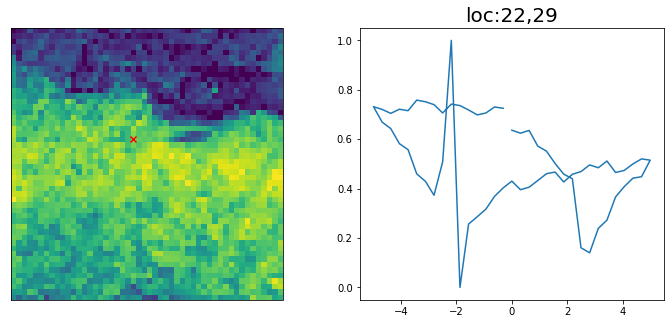

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
i is 1, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #2


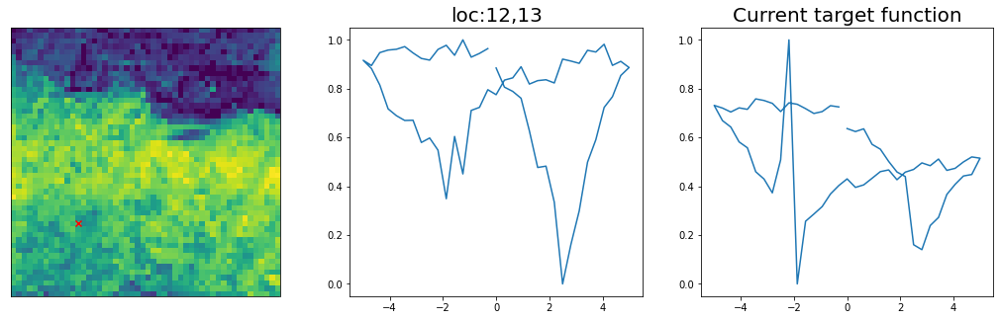

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 2, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #3


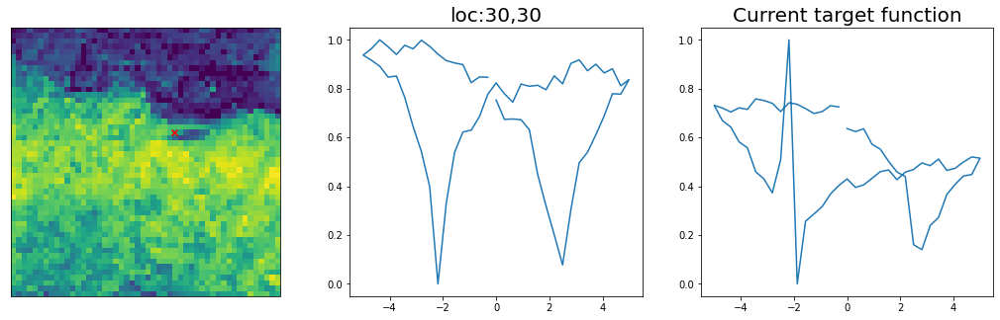

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 3, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #4


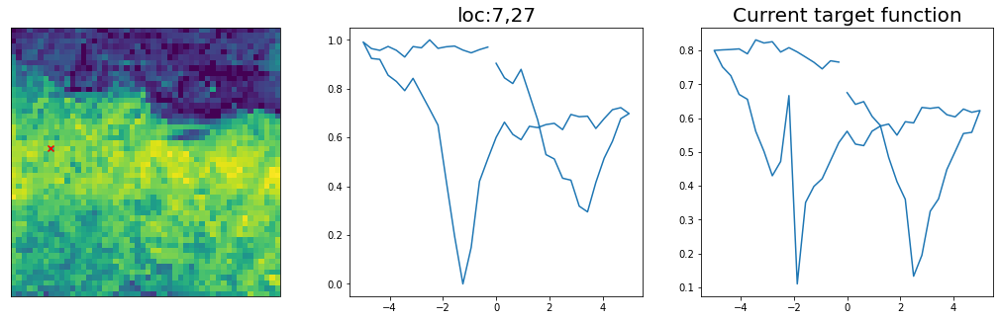

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 4, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #5


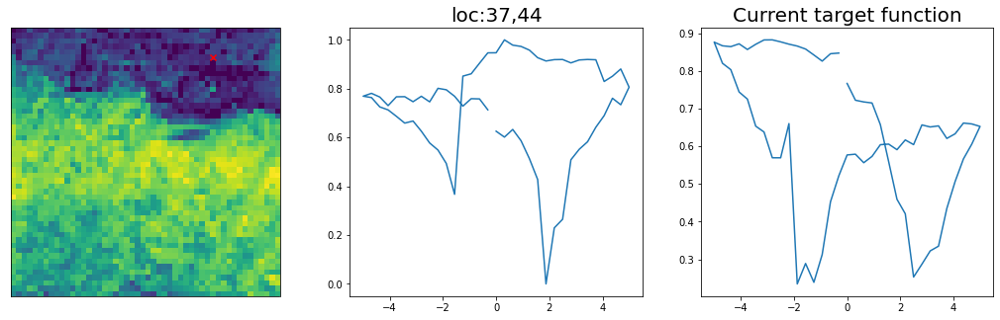

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 5, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #6


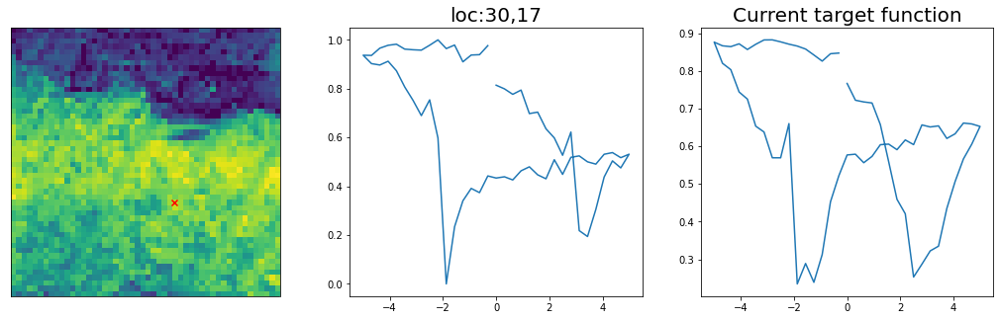

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 6, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #7


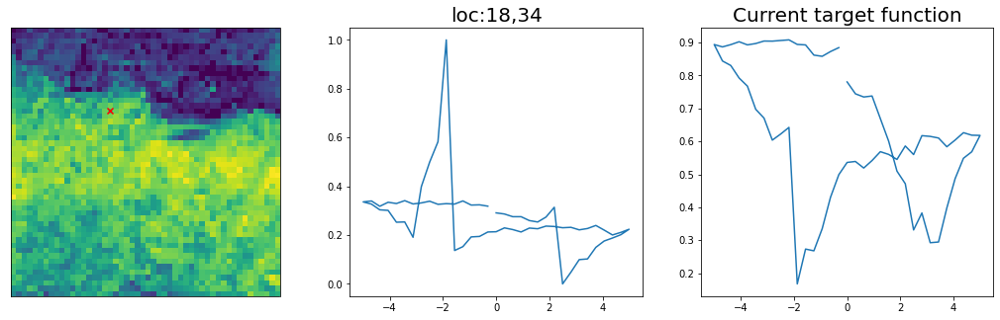

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 7, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #8


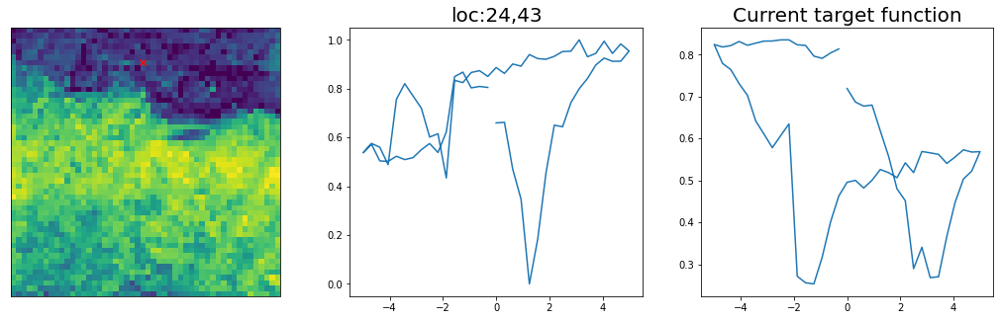

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 8, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #9


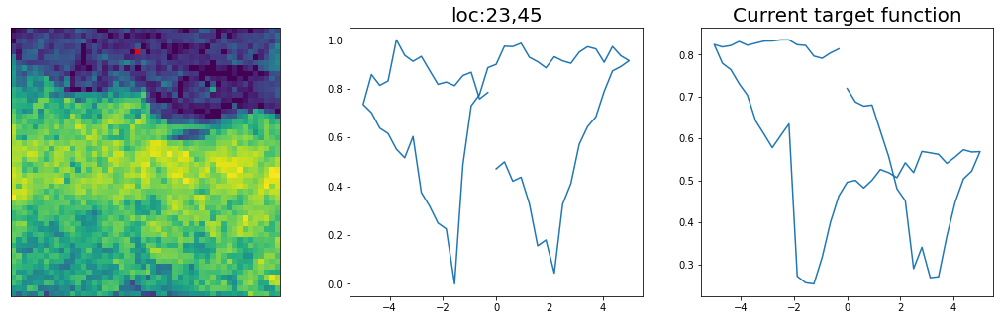

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 9, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #10


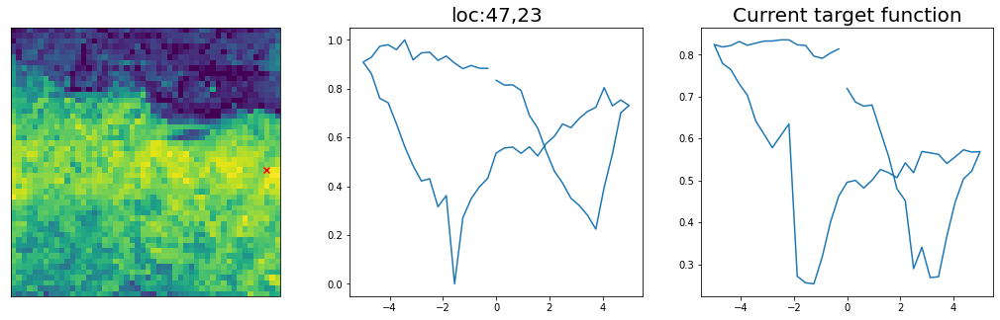

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 


In [14]:
def return_new_measurement(full_dataset, points_measured):
    ampdat_masked = np.zeros_like(full_dataset)
    ampdat_masked[points_measured,:] = full_dataset[points_measured,:]
    return ampdat_masked, points_measured

# set parameters
IV = np.copy(amp_masked)
points_measured = np.array(idx)
last_points_measured = np.array(points_measured)
vdc = vdc_vec

train_Y = np.zeros((num_start, 1))
pref = np.zeros((num_start, 1))
init_spec = np.zeros((num_start, spec_length))
# Define a sparse grid to store evaluated spectral locations
eval_spec_y = np.zeros((img.shape[0],img.shape[0],spec_length))
#Evaluate initial training data
x = np.zeros((1,2))

# First generate target loop, based on initial training data
wcount_good= 0
target_func = np.zeros(spec_length)

mask = np.isin(points_measured, last_points_measured, invert = True)
new_points_measured = points_measured[mask]
last_points_measured = np.append(last_points_measured, new_points_measured)

for i in range(0, num_start):
    
    ##******************experiment start*******************##
    time.sleep(0.1)

    idx_x = int(train_indices[i, 0])
    idx_y = int(train_indices[i, 1])

    next_loc = np.asarray([idx_x, idx_y])
    
    print("i is {}, measurement done".format(i))
    
    mask = np.isin(points_measured, last_points_measured, invert = True)
    new_points_measured = points_measured[mask]
    last_points_measured = np.append(last_points_measured, new_points_measured)
    print('points measured {}'.format(points_measured))
    print('new_points_measured {}'.format(new_points_measured))

    new_iv = IV[last_points_measured,:]

    #new_spec_x = torch.from_numpy(vdc_vec)
    #new_spec_y = torch.from_numpy(new_iv)[i,:]

    new_spec_x = vdc_vec
    new_spec_y = new_iv[i,:]
    

    new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())

    init_spec[i,] = new_spec_y
    eval_spec_y[idx_x, idx_y, :] = new_spec_y
    print("\n\nSample #" + str(m + 1))
    pref[i, 0], wcount_good, target_func = play_varTBO.generate_targetobj(idx_x, idx_y, new_spec_x,new_spec_y, 
                                                              img, wcount_good, target_func)
    m = m + 1


# Once target loop is defined (unless are loops are selected bad by user), we compute the obj
for i in range(0, num_start):
  idx_x = int(train_indices[i, 0])
  idx_y = int(train_indices[i, 1])
  spec_y = eval_spec_y[idx_x, idx_y, :]
  #print(idx_x, idx_y, spec_y)
  train_Y[i, 0] = play_varTBO.func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good, target_func, pref[i, 0])

var_params = [wcount_good, pref, target_func]
test_X, test_X_norm, train_X, train_X_norm, train_Y, var_params, idx, m \
= X_feas, X_feas_norm, train_X, train_X_norm, train_Y, var_params, idx, m


In [15]:
train_Y

array([[2.77979582],
       [0.59437597],
       [1.5760193 ],
       [2.81251417],
       [0.45330065],
       [2.79692355],
       [1.36573892],
       [0.15999701],
       [0.41714017],
       [2.77093881]])

Epoch 1/200 ... Training loss: 1.8067
Epoch 10/200 ... Training loss: 1.5386
Epoch 20/200 ... Training loss: 1.4313
Epoch 30/200 ... Training loss: 1.2892
Epoch 40/200 ... Training loss: 1.1843
Epoch 50/200 ... Training loss: 1.1093
Epoch 60/200 ... Training loss: 1.0474
Epoch 70/200 ... Training loss: 0.9837
Epoch 80/200 ... Training loss: 0.9308
Epoch 90/200 ... Training loss: 0.8814
Epoch 100/200 ... Training loss: 0.834
Epoch 110/200 ... Training loss: 0.7884
Epoch 120/200 ... Training loss: 0.744
Epoch 130/200 ... Training loss: 0.7013
Epoch 140/200 ... Training loss: 0.6581
Epoch 150/200 ... Training loss: 0.6821
Epoch 160/200 ... Training loss: 0.6019
Epoch 170/200 ... Training loss: 0.5459
Epoch 180/200 ... Training loss: 0.4995
Epoch 190/200 ... Training loss: 0.4593
Epoch 200/200 ... Training loss: 0.4202
step:  1
Sample #11




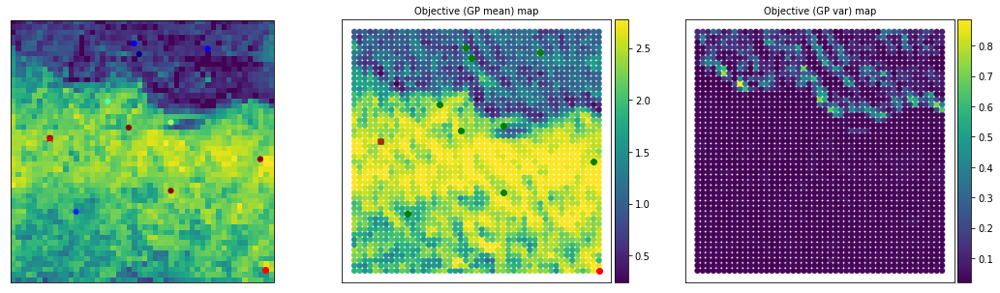

Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: 
User still searching for best target. Continue BO with human interaction...


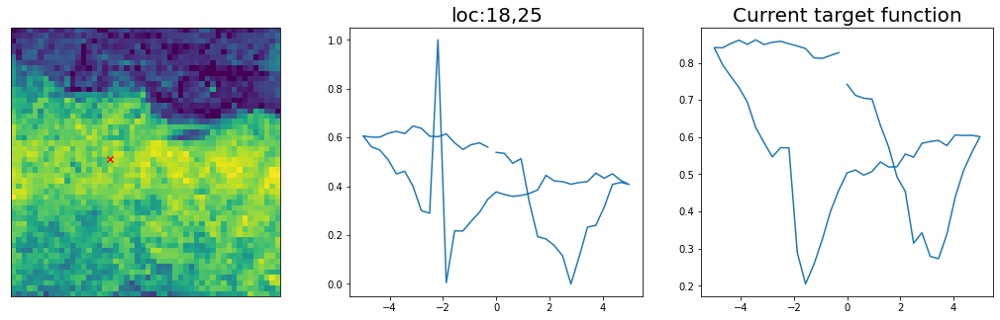

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Epoch 1/200 ... Training loss: 1.787
Epoch 10/200 ... Training loss: 1.5084
Epoch 20/200 ... Training loss: 1.4011
Epoch 30/200 ... Training loss: 1.2468
Epoch 40/200 ... Training loss: 1.1375
Epoch 50/200 ... Training loss: 1.0591
Epoch 60/200 ... Training loss: 0.9932
Epoch 70/200 ... Training loss: 0.9329
Epoch 80/200 ... Training loss: 0.8791
Epoch 90/200 ... Training loss: 0.8287
Epoch 100/200 ... Training loss: 0.7806
Epoch 110/200 ... Training loss: 0.7361
Epoch 120/200 ... Training loss: 0.82
Epoch 130/200 ... Training loss: 0.7004
Epoch 140/200 ... Training loss: 0.6195
Epoch 150/200 ... Training loss: 0.572
Epoch 160/200 ... Training loss: 0.5254
Epoch 170/200 ... Training loss: 0.4813
Epoch 180/200 ... Training loss: 0.4378
Epoch 190/200 ... Training loss: 0.3948
Epoch 200/200 ... Training loss: 0.3

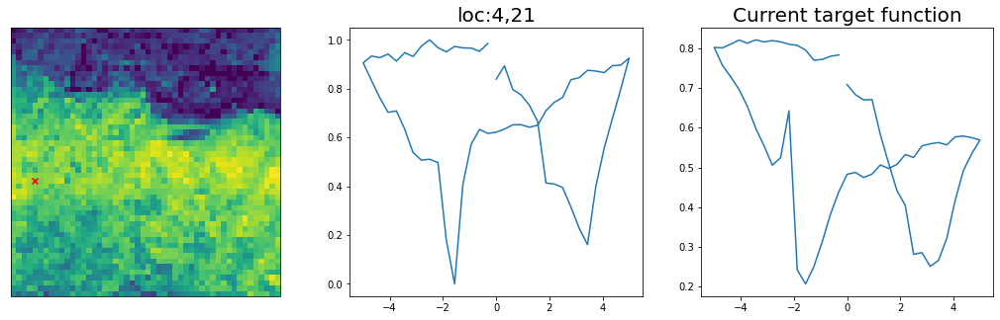

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Epoch 1/200 ... Training loss: 1.7622
Epoch 10/200 ... Training loss: 1.448
Epoch 20/200 ... Training loss: 1.4021
Epoch 30/200 ... Training loss: 1.3363
Epoch 40/200 ... Training loss: 1.2556
Epoch 50/200 ... Training loss: 1.1224
Epoch 60/200 ... Training loss: 0.9995
Epoch 70/200 ... Training loss: 0.9179
Epoch 80/200 ... Training loss: 0.8526
Epoch 90/200 ... Training loss: 0.793
Epoch 100/200 ... Training loss: 0.7381
Epoch 110/200 ... Training loss: 0.6858
Epoch 120/200 ... Training loss: 0.6352
Epoch 130/200 ... Training loss: 0.5858
Epoch 140/200 ... Training loss: 0.5377
Epoch 150/200 ... Training loss: 0.4906
Epoch 160/200 ... Training loss: 0.4441
Epoch 170/200 ... Training loss: 0.4711
Epoch 180/200 ... Training loss: 0.4208
Epoch 190/200 ... Training loss: 0.3348
Epoch 200/200 ... Training loss: 0

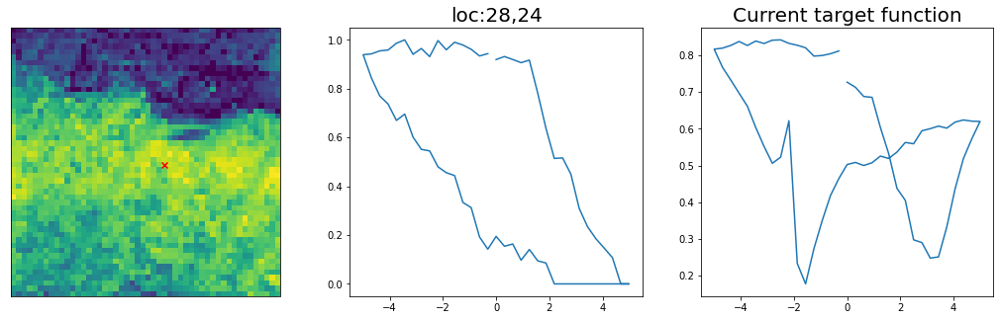

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Epoch 1/200 ... Training loss: 1.6917
Epoch 10/200 ... Training loss: 1.4128
Epoch 20/200 ... Training loss: 1.2353
Epoch 30/200 ... Training loss: 1.1375
Epoch 40/200 ... Training loss: 1.0659
Epoch 50/200 ... Training loss: 0.9962
Epoch 60/200 ... Training loss: 0.9371
Epoch 70/200 ... Training loss: 0.8837
Epoch 80/200 ... Training loss: 0.8353
Epoch 90/200 ... Training loss: 0.7895
Epoch 100/200 ... Training loss: 0.7455
Epoch 110/200 ... Training loss: 0.703
Epoch 120/200 ... Training loss: 0.6621
Epoch 130/200 ... Training loss: 0.845
Epoch 140/200 ... Training loss: 0.6502
Epoch 150/200 ... Training loss: 0.6052
Epoch 160/200 ... Training loss: 0.5482
Epoch 170/200 ... Training loss: 0.4932
Epoch 180/200 ... Training loss: 0.4463
Epoch 190/200 ... Training loss: 0.4065
Epoch 200/200 ... Training loss: 0

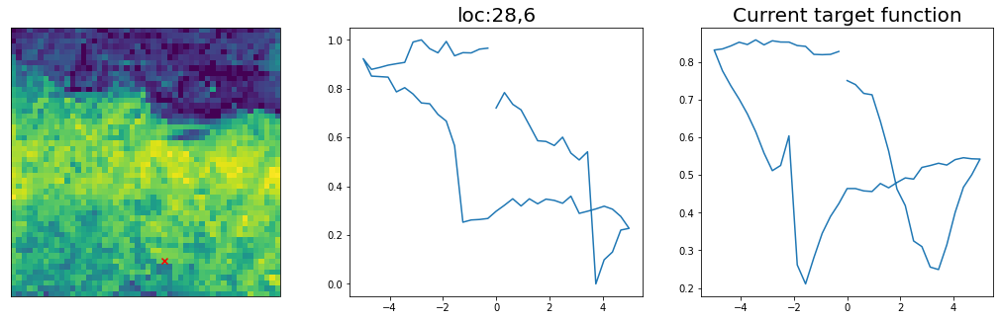

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Epoch 1/200 ... Training loss: 1.6261
Epoch 10/200 ... Training loss: 1.3694
Epoch 20/200 ... Training loss: 1.223
Epoch 30/200 ... Training loss: 1.1568
Epoch 40/200 ... Training loss: 1.0485
Epoch 50/200 ... Training loss: 0.9745
Epoch 60/200 ... Training loss: 0.9118
Epoch 70/200 ... Training loss: 0.859
Epoch 80/200 ... Training loss: 0.8099
Epoch 90/200 ... Training loss: 0.7631
Epoch 100/200 ... Training loss: 0.7181
Epoch 110/200 ... Training loss: 0.6744
Epoch 120/200 ... Training loss: 0.6316
Epoch 130/200 ... Training loss: 0.5903
Epoch 140/200 ... Training loss: 0.6044
Epoch 150/200 ... Training loss: 0.6429
Epoch 160/200 ... Training loss: 0.5908
Epoch 170/200 ... Training loss: 0.5166
Epoch 180/200 ... Training loss: 0.4712
Epoch 190/200 ... Training loss: 0.4199
Epoch 200/200 ... Training loss: 0

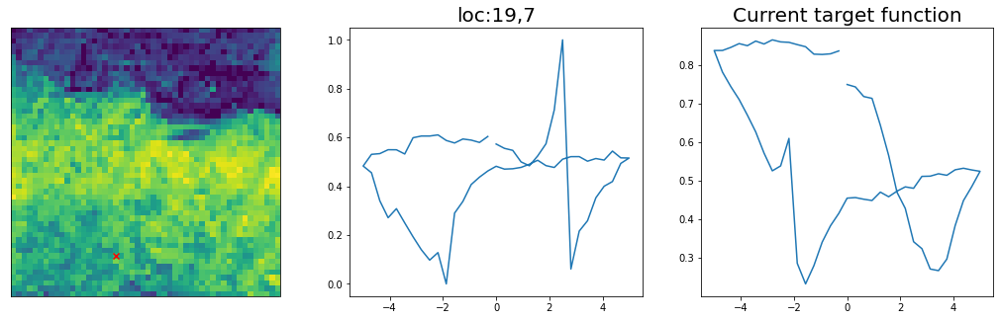

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Epoch 1/200 ... Training loss: 1.5692
Epoch 10/200 ... Training loss: 1.3307
Epoch 20/200 ... Training loss: 1.225
Epoch 30/200 ... Training loss: 1.0964
Epoch 40/200 ... Training loss: 1.0046
Epoch 50/200 ... Training loss: 0.9415
Epoch 60/200 ... Training loss: 0.885
Epoch 70/200 ... Training loss: 0.8432
Epoch 80/200 ... Training loss: 0.7912
Epoch 90/200 ... Training loss: 0.741
Epoch 100/200 ... Training loss: 0.6965
Epoch 110/200 ... Training loss: 0.6522
Epoch 120/200 ... Training loss: 0.6117
Epoch 130/200 ... Training loss: 0.6894
Epoch 140/200 ... Training loss: 0.598
Epoch 150/200 ... Training loss: 0.516
Epoch 160/200 ... Training loss: 0.4591
Epoch 170/200 ... Training loss: 0.4194
Epoch 180/200 ... Training loss: 0.374
Epoch 190/200 ... Training loss: 0.3336
Epoch 200/200 ... Training loss: 0.332

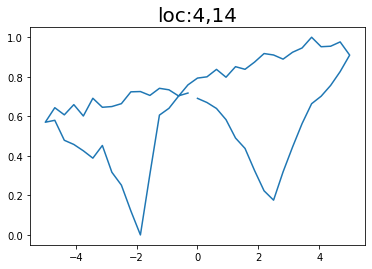

Epoch 1/200 ... Training loss: 4.7915
Epoch 10/200 ... Training loss: 4.2092
Epoch 20/200 ... Training loss: 3.8321
Epoch 30/200 ... Training loss: 3.4315
Epoch 40/200 ... Training loss: 3.1342
Epoch 50/200 ... Training loss: 2.9649
Epoch 60/200 ... Training loss: 2.8561
Epoch 70/200 ... Training loss: 2.7326
Epoch 80/200 ... Training loss: 2.6332
Epoch 90/200 ... Training loss: 2.5477
Epoch 100/200 ... Training loss: 2.4742
Epoch 110/200 ... Training loss: 2.4022
Epoch 120/200 ... Training loss: 2.3101
Epoch 130/200 ... Training loss: 2.1745
Epoch 140/200 ... Training loss: 2.1054
Epoch 150/200 ... Training loss: 1.9999
Epoch 160/200 ... Training loss: 1.8821
Epoch 170/200 ... Training loss: 1.8521
Epoch 180/200 ... Training loss: 1.7862
Epoch 190/200 ... Training loss: 1.7222
Epoch 200/200 ... Training loss: 1.684
step:  7
Sample #17




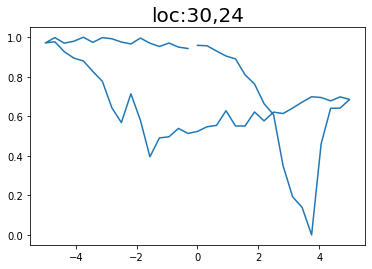

Epoch 1/200 ... Training loss: 4.6508
Epoch 10/200 ... Training loss: 4.3458
Epoch 20/200 ... Training loss: 3.8064
Epoch 30/200 ... Training loss: 3.5698
Epoch 40/200 ... Training loss: 3.2303
Epoch 50/200 ... Training loss: 2.9798
Epoch 60/200 ... Training loss: 2.8998
Epoch 70/200 ... Training loss: 2.7738
Epoch 80/200 ... Training loss: 2.6112
Epoch 90/200 ... Training loss: 2.5447
Epoch 100/200 ... Training loss: 2.451
Epoch 110/200 ... Training loss: 2.3844
Epoch 120/200 ... Training loss: 2.327
Epoch 130/200 ... Training loss: 2.2783
Epoch 140/200 ... Training loss: 2.2311
Epoch 150/200 ... Training loss: 2.1781
Epoch 160/200 ... Training loss: 2.0995
Epoch 170/200 ... Training loss: 1.9782
Epoch 180/200 ... Training loss: 1.9173
Epoch 190/200 ... Training loss: 1.8129
Epoch 200/200 ... Training loss: 1.7189
step:  8
Sample #18




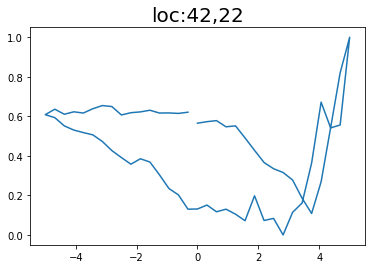

Epoch 1/200 ... Training loss: 4.5034
Epoch 10/200 ... Training loss: 4.3554
Epoch 20/200 ... Training loss: 3.6971
Epoch 30/200 ... Training loss: 3.3856
Epoch 40/200 ... Training loss: 3.1867
Epoch 50/200 ... Training loss: 3.0147
Epoch 60/200 ... Training loss: 2.8776
Epoch 70/200 ... Training loss: 2.7129
Epoch 80/200 ... Training loss: 2.5963
Epoch 90/200 ... Training loss: 2.5324
Epoch 100/200 ... Training loss: 2.4648
Epoch 110/200 ... Training loss: 2.3746
Epoch 120/200 ... Training loss: 2.3211
Epoch 130/200 ... Training loss: 2.2616
Epoch 140/200 ... Training loss: 2.1292
Epoch 150/200 ... Training loss: 1.9868
Epoch 160/200 ... Training loss: 1.8863
Epoch 170/200 ... Training loss: 1.83
Epoch 180/200 ... Training loss: 1.7827
Epoch 190/200 ... Training loss: 1.7311
Epoch 200/200 ... Training loss: 1.7457
step:  9
Sample #19




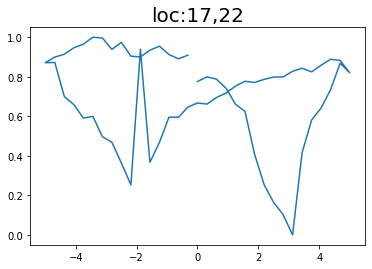

Epoch 1/200 ... Training loss: 4.3075
Epoch 10/200 ... Training loss: 3.7722
Epoch 20/200 ... Training loss: 3.4714
Epoch 30/200 ... Training loss: 3.2282
Epoch 40/200 ... Training loss: 3.0154
Epoch 50/200 ... Training loss: 2.7821
Epoch 60/200 ... Training loss: 2.6366
Epoch 70/200 ... Training loss: 2.5389
Epoch 80/200 ... Training loss: 2.4561
Epoch 90/200 ... Training loss: 2.3589
Epoch 100/200 ... Training loss: 2.2904
Epoch 110/200 ... Training loss: 2.073
Epoch 120/200 ... Training loss: 2.025
Epoch 130/200 ... Training loss: 1.956
Epoch 140/200 ... Training loss: 1.9701
Epoch 150/200 ... Training loss: 1.8761
Epoch 160/200 ... Training loss: 2.0903
Epoch 170/200 ... Training loss: 1.9231
Epoch 180/200 ... Training loss: 1.7732
Epoch 190/200 ... Training loss: 1.7166
Epoch 200/200 ... Training loss: 1.6671
step:  10
Sample #20




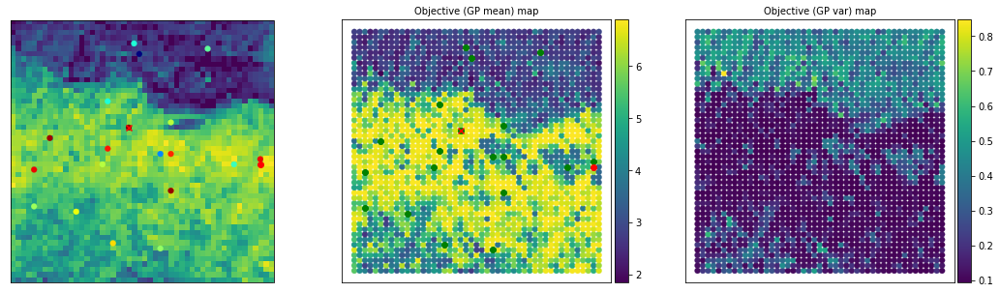

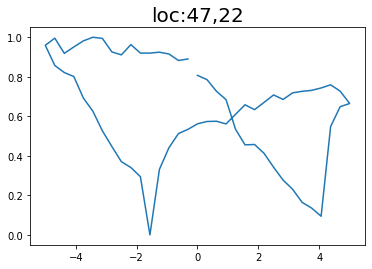

Epoch 1/200 ... Training loss: 4.2208
Epoch 10/200 ... Training loss: 3.9867
Epoch 20/200 ... Training loss: 3.4596
Epoch 30/200 ... Training loss: 3.1707
Epoch 40/200 ... Training loss: 2.9911
Epoch 50/200 ... Training loss: 2.8366
Epoch 60/200 ... Training loss: 2.6541
Epoch 70/200 ... Training loss: 2.5623
Epoch 80/200 ... Training loss: 2.4423
Epoch 90/200 ... Training loss: 2.372
Epoch 100/200 ... Training loss: 2.3128
Epoch 110/200 ... Training loss: 2.2495
Epoch 120/200 ... Training loss: 2.2017
Epoch 130/200 ... Training loss: 2.2791
Epoch 140/200 ... Training loss: 2.2474
Epoch 150/200 ... Training loss: 2.136
Epoch 160/200 ... Training loss: 2.0817
Epoch 170/200 ... Training loss: 1.9591
Epoch 180/200 ... Training loss: 1.9429
Epoch 190/200 ... Training loss: 1.86
Epoch 200/200 ... Training loss: 1.8134
step:  11
Sample #21




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


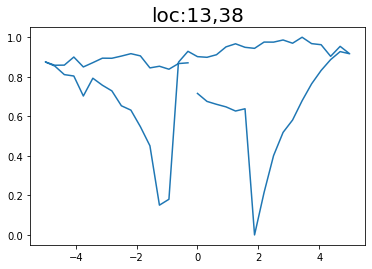

Epoch 1/200 ... Training loss: 4.1034
Epoch 10/200 ... Training loss: 3.5866
Epoch 20/200 ... Training loss: 3.296
Epoch 30/200 ... Training loss: 3.0545
Epoch 40/200 ... Training loss: 2.8784
Epoch 50/200 ... Training loss: 2.675
Epoch 60/200 ... Training loss: 2.5281
Epoch 70/200 ... Training loss: 2.4648
Epoch 80/200 ... Training loss: 2.3866
Epoch 90/200 ... Training loss: 2.3311
Epoch 100/200 ... Training loss: 2.3005
Epoch 110/200 ... Training loss: 2.2343
Epoch 120/200 ... Training loss: 2.1875
Epoch 130/200 ... Training loss: 2.1486
Epoch 140/200 ... Training loss: 2.1103
Epoch 150/200 ... Training loss: 2.0268
Epoch 160/200 ... Training loss: 2.0506
Epoch 170/200 ... Training loss: 1.968
Epoch 180/200 ... Training loss: 1.8167
Epoch 190/200 ... Training loss: 1.7699
Epoch 200/200 ... Training loss: 1.7315
step:  12
Sample #22




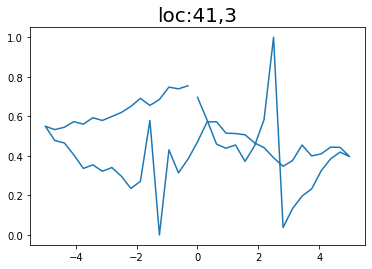

Epoch 1/200 ... Training loss: 4.0617
Epoch 10/200 ... Training loss: 3.5664
Epoch 20/200 ... Training loss: 3.2966
Epoch 30/200 ... Training loss: 2.9151
Epoch 40/200 ... Training loss: 2.9163
Epoch 50/200 ... Training loss: 2.7717
Epoch 60/200 ... Training loss: 2.5792
Epoch 70/200 ... Training loss: 2.4986
Epoch 80/200 ... Training loss: 2.3712
Epoch 90/200 ... Training loss: 2.3222
Epoch 100/200 ... Training loss: 2.263
Epoch 110/200 ... Training loss: 2.2119
Epoch 120/200 ... Training loss: 2.1625
Epoch 130/200 ... Training loss: 2.1129
Epoch 140/200 ... Training loss: 2.0664
Epoch 150/200 ... Training loss: 2.0107
Epoch 160/200 ... Training loss: 1.9255
Epoch 170/200 ... Training loss: 1.9212
Epoch 180/200 ... Training loss: 1.8067
Epoch 190/200 ... Training loss: 1.7816
Epoch 200/200 ... Training loss: 1.7255
step:  13
Sample #23




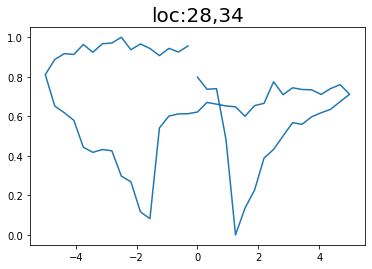

Epoch 1/200 ... Training loss: 3.9263
Epoch 10/200 ... Training loss: 3.4594
Epoch 20/200 ... Training loss: 3.1797
Epoch 30/200 ... Training loss: 2.8678
Epoch 40/200 ... Training loss: 2.6692
Epoch 50/200 ... Training loss: 2.5533
Epoch 60/200 ... Training loss: 2.4341
Epoch 70/200 ... Training loss: 2.3296
Epoch 80/200 ... Training loss: 2.237
Epoch 90/200 ... Training loss: 2.1501
Epoch 100/200 ... Training loss: 2.0763
Epoch 110/200 ... Training loss: 2.0054
Epoch 120/200 ... Training loss: 2.2169
Epoch 130/200 ... Training loss: 2.0782
Epoch 140/200 ... Training loss: 1.9948
Epoch 150/200 ... Training loss: 1.8565
Epoch 160/200 ... Training loss: 1.7784
Epoch 170/200 ... Training loss: 1.6994
Epoch 180/200 ... Training loss: 1.7002
Epoch 190/200 ... Training loss: 1.6695
Epoch 200/200 ... Training loss: 1.6295
step:  14
Sample #24




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


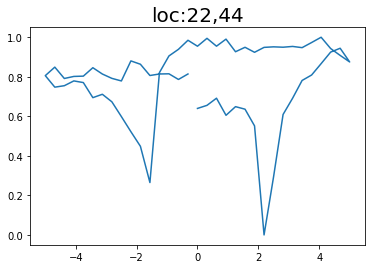

Epoch 1/200 ... Training loss: 3.8047
Epoch 10/200 ... Training loss: 3.3643
Epoch 20/200 ... Training loss: 3.0952
Epoch 30/200 ... Training loss: 2.8569
Epoch 40/200 ... Training loss: 2.6239
Epoch 50/200 ... Training loss: 2.4874
Epoch 60/200 ... Training loss: 2.366
Epoch 70/200 ... Training loss: 2.2621
Epoch 80/200 ... Training loss: 2.1863
Epoch 90/200 ... Training loss: 2.1172
Epoch 100/200 ... Training loss: 2.0562
Epoch 110/200 ... Training loss: 2.0013
Epoch 120/200 ... Training loss: 2.0061
Epoch 130/200 ... Training loss: 1.8992
Epoch 140/200 ... Training loss: 1.8329
Epoch 150/200 ... Training loss: 1.8071
Epoch 160/200 ... Training loss: 1.7457
Epoch 170/200 ... Training loss: 1.6997
Epoch 180/200 ... Training loss: 1.7427
Epoch 190/200 ... Training loss: 1.6552
Epoch 200/200 ... Training loss: 1.5771
step:  15
Sample #25




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


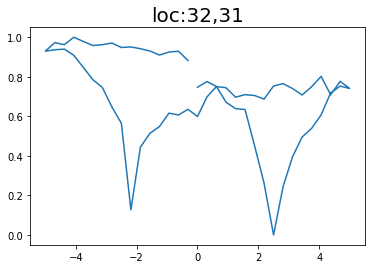

Epoch 1/200 ... Training loss: 3.6841
Epoch 10/200 ... Training loss: 3.326
Epoch 20/200 ... Training loss: 3.1294
Epoch 30/200 ... Training loss: 2.8676
Epoch 40/200 ... Training loss: 2.6931
Epoch 50/200 ... Training loss: 2.5616
Epoch 60/200 ... Training loss: 2.4568
Epoch 70/200 ... Training loss: 2.3655
Epoch 80/200 ... Training loss: 2.2443
Epoch 90/200 ... Training loss: 2.1848
Epoch 100/200 ... Training loss: 2.1279
Epoch 110/200 ... Training loss: 2.0772
Epoch 120/200 ... Training loss: 2.0304
Epoch 130/200 ... Training loss: 1.9903
Epoch 140/200 ... Training loss: 1.9396
Epoch 150/200 ... Training loss: 1.8895
Epoch 160/200 ... Training loss: 1.8882
Epoch 170/200 ... Training loss: 1.7684
Epoch 180/200 ... Training loss: 1.9367
Epoch 190/200 ... Training loss: 1.8475
Epoch 200/200 ... Training loss: 1.8133
step:  16
Sample #26




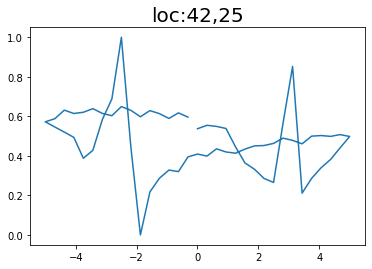

Epoch 1/200 ... Training loss: 3.5816
Epoch 10/200 ... Training loss: 3.3524
Epoch 20/200 ... Training loss: 2.9819
Epoch 30/200 ... Training loss: 2.7726
Epoch 40/200 ... Training loss: 2.6201
Epoch 50/200 ... Training loss: 2.4889
Epoch 60/200 ... Training loss: 2.3296
Epoch 70/200 ... Training loss: 2.2468
Epoch 80/200 ... Training loss: 2.1614
Epoch 90/200 ... Training loss: 2.0884
Epoch 100/200 ... Training loss: 2.0208
Epoch 110/200 ... Training loss: 1.9653
Epoch 120/200 ... Training loss: 1.9338
Epoch 130/200 ... Training loss: 1.8744
Epoch 140/200 ... Training loss: 1.8129
Epoch 150/200 ... Training loss: 1.8507
Epoch 160/200 ... Training loss: 1.7789
Epoch 170/200 ... Training loss: 1.7286
Epoch 180/200 ... Training loss: 1.7724
Epoch 190/200 ... Training loss: 2.1699
Epoch 200/200 ... Training loss: 1.7727
step:  17
Sample #27




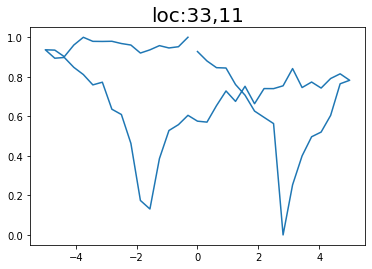

Epoch 1/200 ... Training loss: 3.4967
Epoch 10/200 ... Training loss: 3.164
Epoch 20/200 ... Training loss: 2.9767
Epoch 30/200 ... Training loss: 2.7306
Epoch 40/200 ... Training loss: 2.5935
Epoch 50/200 ... Training loss: 2.4636
Epoch 60/200 ... Training loss: 2.3322
Epoch 70/200 ... Training loss: 2.188
Epoch 80/200 ... Training loss: 2.1149
Epoch 90/200 ... Training loss: 2.0621
Epoch 100/200 ... Training loss: 1.9828
Epoch 110/200 ... Training loss: 1.9308
Epoch 120/200 ... Training loss: 1.8858
Epoch 130/200 ... Training loss: 1.8362
Epoch 140/200 ... Training loss: 1.7921
Epoch 150/200 ... Training loss: 1.7439
Epoch 160/200 ... Training loss: 1.6466
Epoch 170/200 ... Training loss: 1.5872
Epoch 180/200 ... Training loss: 1.5468
Epoch 190/200 ... Training loss: 1.4954
Epoch 200/200 ... Training loss: 1.4489
step:  18
Sample #28




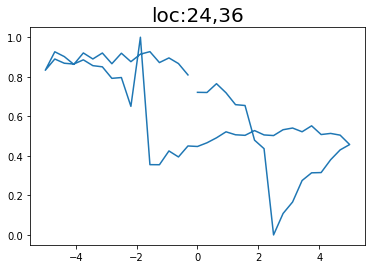

Epoch 1/200 ... Training loss: 3.4015
Epoch 10/200 ... Training loss: 3.0213
Epoch 20/200 ... Training loss: 2.7889
Epoch 30/200 ... Training loss: 2.5507
Epoch 40/200 ... Training loss: 2.387
Epoch 50/200 ... Training loss: 2.2524
Epoch 60/200 ... Training loss: 2.1437
Epoch 70/200 ... Training loss: 2.0574
Epoch 80/200 ... Training loss: 1.9898
Epoch 90/200 ... Training loss: 1.9594
Epoch 100/200 ... Training loss: 1.8775
Epoch 110/200 ... Training loss: 1.813
Epoch 120/200 ... Training loss: 1.7692
Epoch 130/200 ... Training loss: 1.7452
Epoch 140/200 ... Training loss: 1.673
Epoch 150/200 ... Training loss: 1.5993
Epoch 160/200 ... Training loss: 1.7223
Epoch 170/200 ... Training loss: 1.5896
Epoch 180/200 ... Training loss: 1.6595
Epoch 190/200 ... Training loss: 1.4481
Epoch 200/200 ... Training loss: 1.4209
step:  19
Sample #29




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


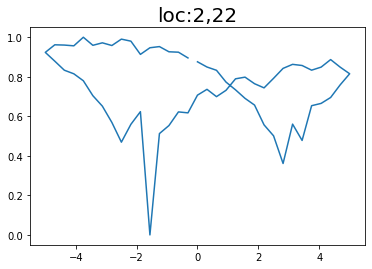

Epoch 1/200 ... Training loss: 3.3898
Epoch 10/200 ... Training loss: 2.9825
Epoch 20/200 ... Training loss: 2.797
Epoch 30/200 ... Training loss: 2.5973
Epoch 40/200 ... Training loss: 2.5331
Epoch 50/200 ... Training loss: 2.3823
Epoch 60/200 ... Training loss: 2.3929
Epoch 70/200 ... Training loss: 2.2159
Epoch 80/200 ... Training loss: 2.1845
Epoch 90/200 ... Training loss: 2.1357
Epoch 100/200 ... Training loss: 2.1093
Epoch 110/200 ... Training loss: 2.039
Epoch 120/200 ... Training loss: 2.0252
Epoch 130/200 ... Training loss: 2.0002
Epoch 140/200 ... Training loss: 1.9728
Epoch 150/200 ... Training loss: 1.9447
Epoch 160/200 ... Training loss: 1.9181
Epoch 170/200 ... Training loss: 1.8936
Epoch 180/200 ... Training loss: 1.8696
Epoch 190/200 ... Training loss: 1.8416
Epoch 200/200 ... Training loss: 1.8078
step:  20
Sample #30




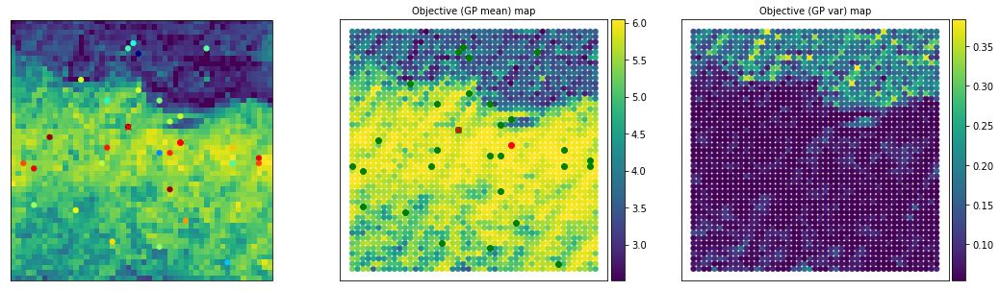

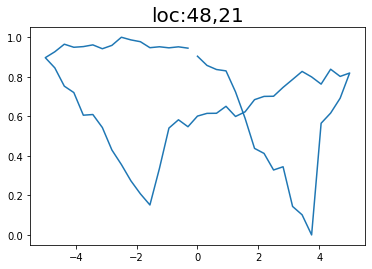

Epoch 1/200 ... Training loss: 3.3411
Epoch 10/200 ... Training loss: 3.148
Epoch 20/200 ... Training loss: 2.8297
Epoch 30/200 ... Training loss: 2.6455
Epoch 40/200 ... Training loss: 2.4868
Epoch 50/200 ... Training loss: 2.3766
Epoch 60/200 ... Training loss: 2.2864
Epoch 70/200 ... Training loss: 2.2146
Epoch 80/200 ... Training loss: 2.1537
Epoch 90/200 ... Training loss: 2.0862
Epoch 100/200 ... Training loss: 2.0065
Epoch 110/200 ... Training loss: 1.9759
Epoch 120/200 ... Training loss: 1.9361
Epoch 130/200 ... Training loss: 1.9067
Epoch 140/200 ... Training loss: 1.875
Epoch 150/200 ... Training loss: 1.8481
Epoch 160/200 ... Training loss: 1.8189
Epoch 170/200 ... Training loss: 1.7836
Epoch 180/200 ... Training loss: 1.7546
Epoch 190/200 ... Training loss: 1.7138
Epoch 200/200 ... Training loss: 1.6759
step:  21
Sample #31




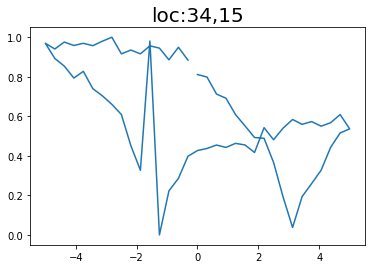

Epoch 1/200 ... Training loss: 3.279
Epoch 10/200 ... Training loss: 2.9211
Epoch 20/200 ... Training loss: 2.7152
Epoch 30/200 ... Training loss: 2.7508
Epoch 40/200 ... Training loss: 2.4146
Epoch 50/200 ... Training loss: 2.31
Epoch 60/200 ... Training loss: 2.1803
Epoch 70/200 ... Training loss: 2.0785
Epoch 80/200 ... Training loss: 2.0191
Epoch 90/200 ... Training loss: 1.9624
Epoch 100/200 ... Training loss: 1.9155
Epoch 110/200 ... Training loss: 1.9155
Epoch 120/200 ... Training loss: 1.8384
Epoch 130/200 ... Training loss: 1.8096
Epoch 140/200 ... Training loss: 1.7725
Epoch 150/200 ... Training loss: 1.7333
Epoch 160/200 ... Training loss: 1.6884
Epoch 170/200 ... Training loss: 1.8024
Epoch 180/200 ... Training loss: 1.7148
Epoch 190/200 ... Training loss: 1.6666
Epoch 200/200 ... Training loss: 1.6177
step:  22
Sample #32




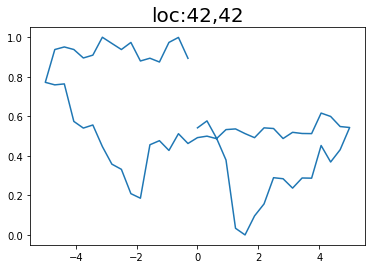

Epoch 1/200 ... Training loss: 3.2107
Epoch 10/200 ... Training loss: 2.8591
Epoch 20/200 ... Training loss: 2.7213
Epoch 30/200 ... Training loss: 2.5131
Epoch 40/200 ... Training loss: 2.3654
Epoch 50/200 ... Training loss: 2.2588
Epoch 60/200 ... Training loss: 2.0996
Epoch 70/200 ... Training loss: 2.0548
Epoch 80/200 ... Training loss: 1.987
Epoch 90/200 ... Training loss: 1.9454
Epoch 100/200 ... Training loss: 1.9043
Epoch 110/200 ... Training loss: 1.8584
Epoch 120/200 ... Training loss: 1.8085
Epoch 130/200 ... Training loss: 1.7646
Epoch 140/200 ... Training loss: 1.7178
Epoch 150/200 ... Training loss: 1.6944
Epoch 160/200 ... Training loss: 1.7085
Epoch 170/200 ... Training loss: 1.6619
Epoch 180/200 ... Training loss: 1.6164
Epoch 190/200 ... Training loss: 1.6172
Epoch 200/200 ... Training loss: 1.6729
step:  23
Sample #33




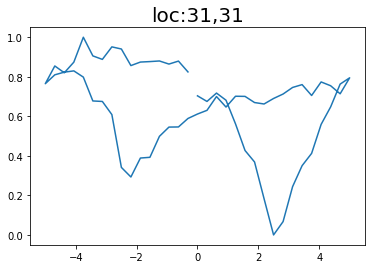

Epoch 1/200 ... Training loss: 3.1372
Epoch 10/200 ... Training loss: 2.8898
Epoch 20/200 ... Training loss: 2.638
Epoch 30/200 ... Training loss: 2.5192
Epoch 40/200 ... Training loss: 2.3475
Epoch 50/200 ... Training loss: 2.2911
Epoch 60/200 ... Training loss: 2.1746
Epoch 70/200 ... Training loss: 2.1199
Epoch 80/200 ... Training loss: 2.0586
Epoch 90/200 ... Training loss: 1.977
Epoch 100/200 ... Training loss: 1.9428
Epoch 110/200 ... Training loss: 1.8864
Epoch 120/200 ... Training loss: 1.8484
Epoch 130/200 ... Training loss: 1.8122
Epoch 140/200 ... Training loss: 1.7782
Epoch 150/200 ... Training loss: 1.7458
Epoch 160/200 ... Training loss: 1.7198
Epoch 170/200 ... Training loss: 1.6881
Epoch 180/200 ... Training loss: 1.6562
Epoch 190/200 ... Training loss: 1.6219
Epoch 200/200 ... Training loss: 1.6966
step:  24
Sample #34




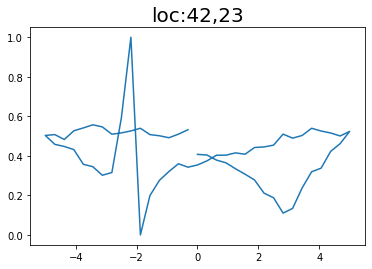

Epoch 1/200 ... Training loss: 3.1122
Epoch 10/200 ... Training loss: 2.8936
Epoch 20/200 ... Training loss: 2.6573
Epoch 30/200 ... Training loss: 2.5093
Epoch 40/200 ... Training loss: 2.3711
Epoch 50/200 ... Training loss: 2.2485
Epoch 60/200 ... Training loss: 2.1738
Epoch 70/200 ... Training loss: 2.1154
Epoch 80/200 ... Training loss: 2.0933
Epoch 90/200 ... Training loss: 2.0284
Epoch 100/200 ... Training loss: 1.9999
Epoch 110/200 ... Training loss: 1.9604
Epoch 120/200 ... Training loss: 1.9395
Epoch 130/200 ... Training loss: 1.8791
Epoch 140/200 ... Training loss: 1.8392
Epoch 150/200 ... Training loss: 1.794
Epoch 160/200 ... Training loss: 1.779
Epoch 170/200 ... Training loss: 1.7515
Epoch 180/200 ... Training loss: 1.7304
Epoch 190/200 ... Training loss: 1.7083
Epoch 200/200 ... Training loss: 1.6874
step:  25
Sample #35




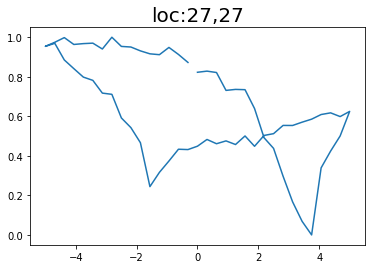

Epoch 1/200 ... Training loss: 3.1155
Epoch 10/200 ... Training loss: 2.7941
Epoch 20/200 ... Training loss: 2.6371
Epoch 30/200 ... Training loss: 2.452
Epoch 40/200 ... Training loss: 2.3393
Epoch 50/200 ... Training loss: 2.2307
Epoch 60/200 ... Training loss: 2.1464
Epoch 70/200 ... Training loss: 2.0712
Epoch 80/200 ... Training loss: 2.0228
Epoch 90/200 ... Training loss: 1.9638
Epoch 100/200 ... Training loss: 1.9023
Epoch 110/200 ... Training loss: 1.8541
Epoch 120/200 ... Training loss: 1.7998
Epoch 130/200 ... Training loss: 1.7574
Epoch 140/200 ... Training loss: 1.7209
Epoch 150/200 ... Training loss: 1.6919
Epoch 160/200 ... Training loss: 1.654
Epoch 170/200 ... Training loss: 1.5755
Epoch 180/200 ... Training loss: 1.6478
Epoch 190/200 ... Training loss: 1.5463
Epoch 200/200 ... Training loss: 1.434
step:  26
Sample #36




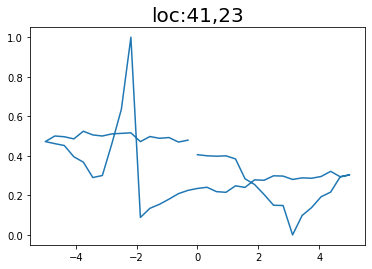

Epoch 1/200 ... Training loss: 3.0639
Epoch 10/200 ... Training loss: 2.7235
Epoch 20/200 ... Training loss: 2.5553
Epoch 30/200 ... Training loss: 2.4603
Epoch 40/200 ... Training loss: 2.2904
Epoch 50/200 ... Training loss: 2.1925
Epoch 60/200 ... Training loss: 2.1218
Epoch 70/200 ... Training loss: 2.0628
Epoch 80/200 ... Training loss: 2.0056
Epoch 90/200 ... Training loss: 1.9339
Epoch 100/200 ... Training loss: 1.8727
Epoch 110/200 ... Training loss: 1.8327
Epoch 120/200 ... Training loss: 1.8064
Epoch 130/200 ... Training loss: 1.7468
Epoch 140/200 ... Training loss: 1.7128
Epoch 150/200 ... Training loss: 1.6756
Epoch 160/200 ... Training loss: 1.6349
Epoch 170/200 ... Training loss: 1.6029
Epoch 180/200 ... Training loss: 1.5941
Epoch 190/200 ... Training loss: 1.5617
Epoch 200/200 ... Training loss: 1.5176
step:  27
Sample #37




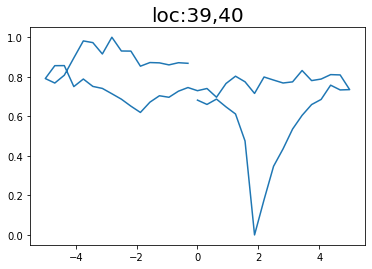

Epoch 1/200 ... Training loss: 3.007
Epoch 10/200 ... Training loss: 2.7925
Epoch 20/200 ... Training loss: 2.5744
Epoch 30/200 ... Training loss: 2.5137
Epoch 40/200 ... Training loss: 2.206
Epoch 50/200 ... Training loss: 2.1248
Epoch 60/200 ... Training loss: 1.969
Epoch 70/200 ... Training loss: 1.9214
Epoch 80/200 ... Training loss: 1.872
Epoch 90/200 ... Training loss: 1.8269
Epoch 100/200 ... Training loss: 1.7914
Epoch 110/200 ... Training loss: 1.7556
Epoch 120/200 ... Training loss: 1.7197
Epoch 130/200 ... Training loss: 1.6913
Epoch 140/200 ... Training loss: 1.6508
Epoch 150/200 ... Training loss: 1.6045
Epoch 160/200 ... Training loss: 1.5425
Epoch 170/200 ... Training loss: 1.4428
Epoch 180/200 ... Training loss: 1.3372
Epoch 190/200 ... Training loss: 1.3609
Epoch 200/200 ... Training loss: 1.2953
step:  28
Sample #38




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


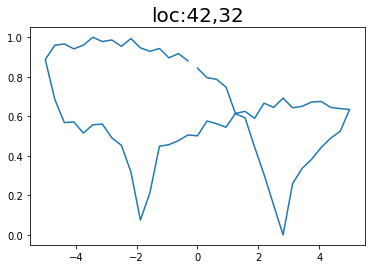

Epoch 1/200 ... Training loss: 2.9862
Epoch 10/200 ... Training loss: 2.7291
Epoch 20/200 ... Training loss: 2.4895
Epoch 30/200 ... Training loss: 2.3146
Epoch 40/200 ... Training loss: 2.1636
Epoch 50/200 ... Training loss: 2.0833
Epoch 60/200 ... Training loss: 1.9797
Epoch 70/200 ... Training loss: 1.8998
Epoch 80/200 ... Training loss: 1.8345
Epoch 90/200 ... Training loss: 1.7885
Epoch 100/200 ... Training loss: 1.7438
Epoch 110/200 ... Training loss: 1.6939
Epoch 120/200 ... Training loss: 1.6357
Epoch 130/200 ... Training loss: 1.6057
Epoch 140/200 ... Training loss: 1.6053
Epoch 150/200 ... Training loss: 1.5962
Epoch 160/200 ... Training loss: 1.3973
Epoch 170/200 ... Training loss: 1.3169
Epoch 180/200 ... Training loss: 1.3294
Epoch 190/200 ... Training loss: 1.194
Epoch 200/200 ... Training loss: 1.2223
step:  29
Sample #39




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


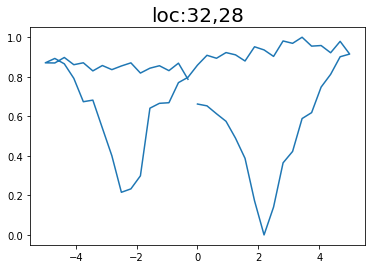

Epoch 1/200 ... Training loss: 2.7675
Epoch 10/200 ... Training loss: 2.6222
Epoch 20/200 ... Training loss: 2.4041
Epoch 30/200 ... Training loss: 2.1917
Epoch 40/200 ... Training loss: 2.076
Epoch 50/200 ... Training loss: 1.9952
Epoch 60/200 ... Training loss: 1.9193
Epoch 70/200 ... Training loss: 1.852
Epoch 80/200 ... Training loss: 1.7901
Epoch 90/200 ... Training loss: 1.7342
Epoch 100/200 ... Training loss: 1.6597
Epoch 110/200 ... Training loss: 1.6976
Epoch 120/200 ... Training loss: 1.5822
Epoch 130/200 ... Training loss: 1.5516
Epoch 140/200 ... Training loss: 1.4441
Epoch 150/200 ... Training loss: 1.4414
Epoch 160/200 ... Training loss: 1.4205
Epoch 170/200 ... Training loss: 1.6459
Epoch 180/200 ... Training loss: 1.4859
Epoch 190/200 ... Training loss: 1.2843
Epoch 200/200 ... Training loss: 1.5413
step:  30
Sample #40




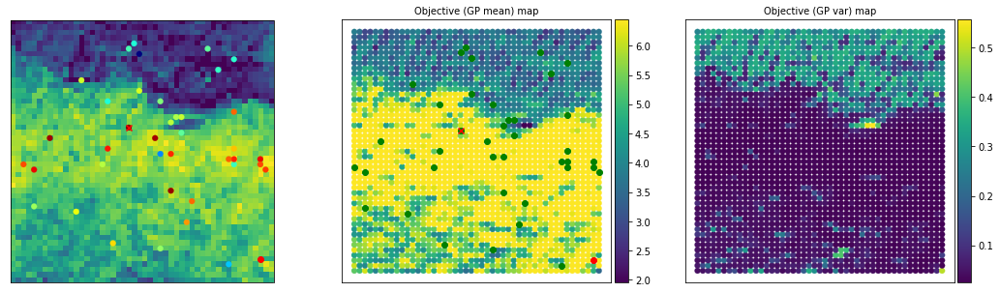

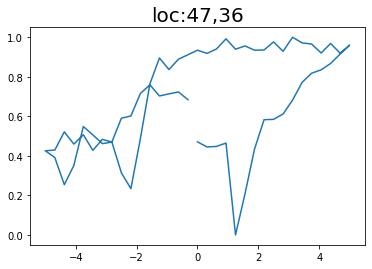

Epoch 1/200 ... Training loss: 2.8656
Epoch 10/200 ... Training loss: 2.6293
Epoch 20/200 ... Training loss: 2.4464
Epoch 30/200 ... Training loss: 2.2604
Epoch 40/200 ... Training loss: 2.1165
Epoch 50/200 ... Training loss: 2.0223
Epoch 60/200 ... Training loss: 1.9284
Epoch 70/200 ... Training loss: 1.8393
Epoch 80/200 ... Training loss: 1.7718
Epoch 90/200 ... Training loss: 1.806
Epoch 100/200 ... Training loss: 1.7364
Epoch 110/200 ... Training loss: 1.6973
Epoch 120/200 ... Training loss: 1.6382
Epoch 130/200 ... Training loss: 1.5869
Epoch 140/200 ... Training loss: 1.5201
Epoch 150/200 ... Training loss: 1.5116
Epoch 160/200 ... Training loss: 1.5581
Epoch 170/200 ... Training loss: 1.7478
Epoch 180/200 ... Training loss: 1.7039
Epoch 190/200 ... Training loss: 1.6116
Epoch 200/200 ... Training loss: 1.5699
step:  31
Sample #41




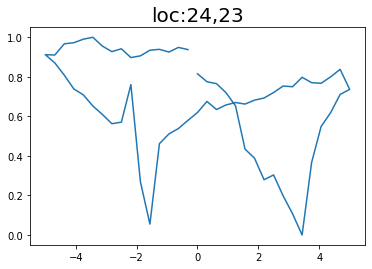

Epoch 1/200 ... Training loss: 2.8357
Epoch 10/200 ... Training loss: 2.7565
Epoch 20/200 ... Training loss: 2.3364
Epoch 30/200 ... Training loss: 2.26
Epoch 40/200 ... Training loss: 2.0986
Epoch 50/200 ... Training loss: 1.9999
Epoch 60/200 ... Training loss: 1.9068
Epoch 70/200 ... Training loss: 1.8194
Epoch 80/200 ... Training loss: 1.7568
Epoch 90/200 ... Training loss: 1.7204
Epoch 100/200 ... Training loss: 1.6707
Epoch 110/200 ... Training loss: 1.6112
Epoch 120/200 ... Training loss: 1.8009
Epoch 130/200 ... Training loss: 1.689
Epoch 140/200 ... Training loss: 1.6457
Epoch 150/200 ... Training loss: 1.5929
Epoch 160/200 ... Training loss: 1.5434
Epoch 170/200 ... Training loss: 1.4607
Epoch 180/200 ... Training loss: 1.5281
Epoch 190/200 ... Training loss: 1.5157
Epoch 200/200 ... Training loss: 1.4355
step:  32
Sample #42




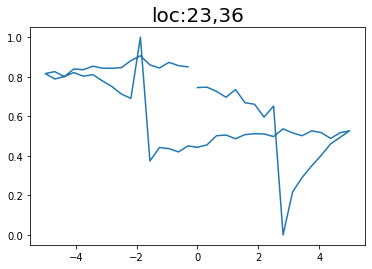

Epoch 1/200 ... Training loss: 2.7861
Epoch 10/200 ... Training loss: 2.7431
Epoch 20/200 ... Training loss: 2.4155
Epoch 30/200 ... Training loss: 2.1856
Epoch 40/200 ... Training loss: 2.0499
Epoch 50/200 ... Training loss: 1.962
Epoch 60/200 ... Training loss: 1.8834
Epoch 70/200 ... Training loss: 1.8044
Epoch 80/200 ... Training loss: 1.7399
Epoch 90/200 ... Training loss: 1.6752
Epoch 100/200 ... Training loss: 1.6696
Epoch 110/200 ... Training loss: 1.6087
Epoch 120/200 ... Training loss: 1.645
Epoch 130/200 ... Training loss: 1.6087
Epoch 140/200 ... Training loss: 1.6546
Epoch 150/200 ... Training loss: 1.6883
Epoch 160/200 ... Training loss: 1.5774
Epoch 170/200 ... Training loss: 1.5143
Epoch 180/200 ... Training loss: 1.4076
Epoch 190/200 ... Training loss: 1.3184
Epoch 200/200 ... Training loss: 1.7782
step:  33
Sample #43




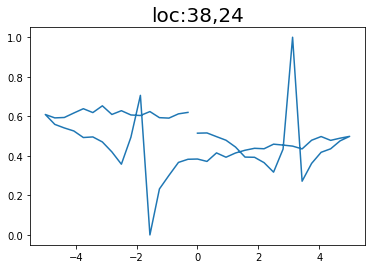

Epoch 1/200 ... Training loss: 2.7396
Epoch 10/200 ... Training loss: 2.6516
Epoch 20/200 ... Training loss: 2.3736
Epoch 30/200 ... Training loss: 2.1935
Epoch 40/200 ... Training loss: 2.0583
Epoch 50/200 ... Training loss: 1.9573
Epoch 60/200 ... Training loss: 1.8667
Epoch 70/200 ... Training loss: 1.782
Epoch 80/200 ... Training loss: 1.7141
Epoch 90/200 ... Training loss: 1.7854
Epoch 100/200 ... Training loss: 1.7086
Epoch 110/200 ... Training loss: 1.6444
Epoch 120/200 ... Training loss: 1.5976
Epoch 130/200 ... Training loss: 1.5584
Epoch 140/200 ... Training loss: 1.5011
Epoch 150/200 ... Training loss: 1.5292
Epoch 160/200 ... Training loss: 1.4972
Epoch 170/200 ... Training loss: 1.4626
Epoch 180/200 ... Training loss: 1.3498
Epoch 190/200 ... Training loss: 1.3698
Epoch 200/200 ... Training loss: 1.1504
step:  34
Sample #44




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


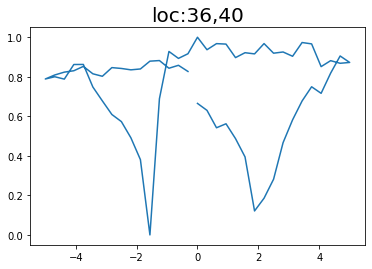

Epoch 1/200 ... Training loss: 2.6959
Epoch 10/200 ... Training loss: 2.4877
Epoch 20/200 ... Training loss: 2.3474
Epoch 30/200 ... Training loss: 2.1417
Epoch 40/200 ... Training loss: 2.0186
Epoch 50/200 ... Training loss: 1.9313
Epoch 60/200 ... Training loss: 1.8424
Epoch 70/200 ... Training loss: 1.764
Epoch 80/200 ... Training loss: 1.7081
Epoch 90/200 ... Training loss: 1.9815
Epoch 100/200 ... Training loss: 1.9242
Epoch 110/200 ... Training loss: 1.7097
Epoch 120/200 ... Training loss: 1.6649
Epoch 130/200 ... Training loss: 1.6297
Epoch 140/200 ... Training loss: 1.6055
Epoch 150/200 ... Training loss: 1.5842
Epoch 160/200 ... Training loss: 1.563
Epoch 170/200 ... Training loss: 1.5438
Epoch 180/200 ... Training loss: 1.5173
Epoch 190/200 ... Training loss: 1.474
Epoch 200/200 ... Training loss: 1.6945
step:  35
Sample #45




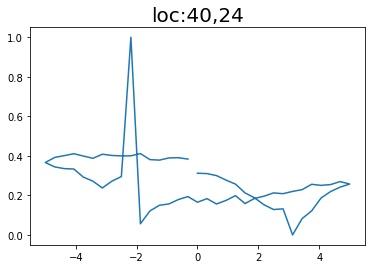

Epoch 1/200 ... Training loss: 2.6555
Epoch 10/200 ... Training loss: 2.4492
Epoch 20/200 ... Training loss: 2.3115
Epoch 30/200 ... Training loss: 2.0802
Epoch 40/200 ... Training loss: 1.9477
Epoch 50/200 ... Training loss: 1.8564
Epoch 60/200 ... Training loss: 1.7879
Epoch 70/200 ... Training loss: 1.7325
Epoch 80/200 ... Training loss: 1.6824
Epoch 90/200 ... Training loss: 1.6335
Epoch 100/200 ... Training loss: 1.6427
Epoch 110/200 ... Training loss: 1.5848
Epoch 120/200 ... Training loss: 1.5282
Epoch 130/200 ... Training loss: 1.7117
Epoch 140/200 ... Training loss: 1.5736
Epoch 150/200 ... Training loss: 1.5275
Epoch 160/200 ... Training loss: 1.4746
Epoch 170/200 ... Training loss: 1.408
Epoch 180/200 ... Training loss: 1.6337
Epoch 190/200 ... Training loss: 1.4837
Epoch 200/200 ... Training loss: 1.7064
step:  36
Sample #46




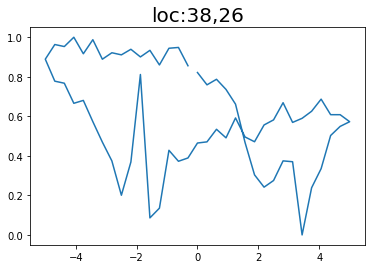

Epoch 1/200 ... Training loss: 2.6264
Epoch 10/200 ... Training loss: 2.4292
Epoch 20/200 ... Training loss: 2.2828
Epoch 30/200 ... Training loss: 2.1049
Epoch 40/200 ... Training loss: 1.9669
Epoch 50/200 ... Training loss: 1.8933
Epoch 60/200 ... Training loss: 1.826
Epoch 70/200 ... Training loss: 1.7612
Epoch 80/200 ... Training loss: 1.701
Epoch 90/200 ... Training loss: 1.6463
Epoch 100/200 ... Training loss: 1.6025
Epoch 110/200 ... Training loss: 1.5723
Epoch 120/200 ... Training loss: 1.5476
Epoch 130/200 ... Training loss: 1.5136
Epoch 140/200 ... Training loss: 1.4376
Epoch 150/200 ... Training loss: 1.4167
Epoch 160/200 ... Training loss: 1.3701
Epoch 170/200 ... Training loss: 1.7127
Epoch 180/200 ... Training loss: 1.296
Epoch 190/200 ... Training loss: 1.2424
Epoch 200/200 ... Training loss: 1.1274
step:  37
Sample #47




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


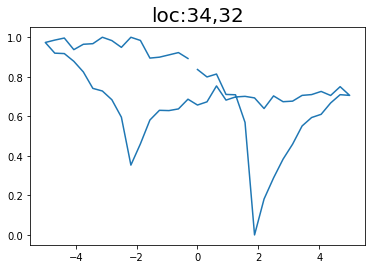

Epoch 1/200 ... Training loss: 2.5887
Epoch 10/200 ... Training loss: 2.3709
Epoch 20/200 ... Training loss: 2.1726
Epoch 30/200 ... Training loss: 2.0067
Epoch 40/200 ... Training loss: 1.9194
Epoch 50/200 ... Training loss: 1.85
Epoch 60/200 ... Training loss: 1.7685
Epoch 70/200 ... Training loss: 1.7068
Epoch 80/200 ... Training loss: 1.6472
Epoch 90/200 ... Training loss: 1.6769
Epoch 100/200 ... Training loss: 1.634
Epoch 110/200 ... Training loss: 1.561
Epoch 120/200 ... Training loss: 1.5121
Epoch 130/200 ... Training loss: 1.4359
Epoch 140/200 ... Training loss: 1.4426
Epoch 150/200 ... Training loss: 1.4646
Epoch 160/200 ... Training loss: 1.3179
Epoch 170/200 ... Training loss: 1.4967
Epoch 180/200 ... Training loss: 1.6781
Epoch 190/200 ... Training loss: 1.4689
Epoch 200/200 ... Training loss: 1.3455
step:  38
Sample #48




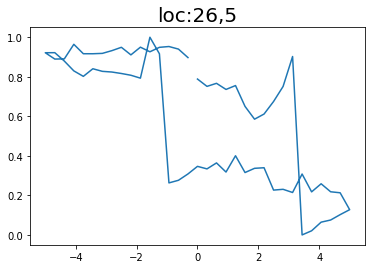

Epoch 1/200 ... Training loss: 2.5934
Epoch 10/200 ... Training loss: 2.4207
Epoch 20/200 ... Training loss: 2.235
Epoch 30/200 ... Training loss: 2.0472
Epoch 40/200 ... Training loss: 1.9494
Epoch 50/200 ... Training loss: 1.8675
Epoch 60/200 ... Training loss: 1.7667
Epoch 70/200 ... Training loss: 1.6814
Epoch 80/200 ... Training loss: 1.64
Epoch 90/200 ... Training loss: 1.5921
Epoch 100/200 ... Training loss: 1.5372
Epoch 110/200 ... Training loss: 1.5594
Epoch 120/200 ... Training loss: 1.4876
Epoch 130/200 ... Training loss: 1.4919
Epoch 140/200 ... Training loss: 1.4858
Epoch 150/200 ... Training loss: 1.425
Epoch 160/200 ... Training loss: 1.5865
Epoch 170/200 ... Training loss: 1.5429
Epoch 180/200 ... Training loss: 1.3946
Epoch 190/200 ... Training loss: 1.3057
Epoch 200/200 ... Training loss: 1.2643
step:  39
Sample #49




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


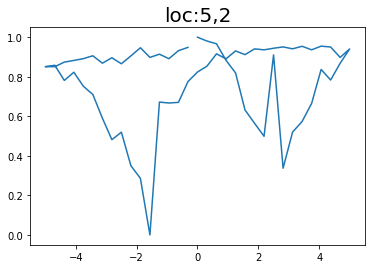

Epoch 1/200 ... Training loss: 2.5729
Epoch 10/200 ... Training loss: 2.4057
Epoch 20/200 ... Training loss: 2.2699
Epoch 30/200 ... Training loss: 2.1225
Epoch 40/200 ... Training loss: 2.0011
Epoch 50/200 ... Training loss: 1.9157
Epoch 60/200 ... Training loss: 1.8334
Epoch 70/200 ... Training loss: 1.7397
Epoch 80/200 ... Training loss: 1.6524
Epoch 90/200 ... Training loss: 1.6109
Epoch 100/200 ... Training loss: 1.565
Epoch 110/200 ... Training loss: 1.8186
Epoch 120/200 ... Training loss: 1.7912
Epoch 130/200 ... Training loss: 1.6374
Epoch 140/200 ... Training loss: 1.5622
Epoch 150/200 ... Training loss: 1.523
Epoch 160/200 ... Training loss: 1.4896
Epoch 170/200 ... Training loss: 1.46
Epoch 180/200 ... Training loss: 1.4206
Epoch 190/200 ... Training loss: 1.71
Epoch 200/200 ... Training loss: 1.6104
step:  40
Sample #50




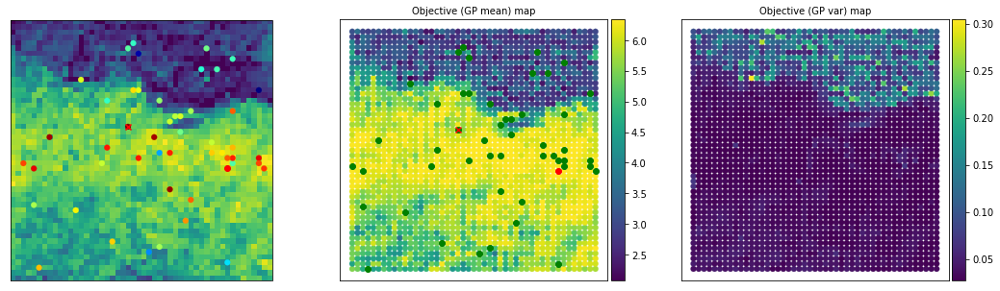

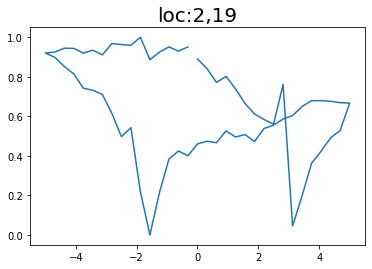

Epoch 1/200 ... Training loss: 2.5518
Epoch 10/200 ... Training loss: 2.3958
Epoch 20/200 ... Training loss: 2.2714
Epoch 30/200 ... Training loss: 2.0355
Epoch 40/200 ... Training loss: 1.9088
Epoch 50/200 ... Training loss: 1.7943
Epoch 60/200 ... Training loss: 1.7121
Epoch 70/200 ... Training loss: 1.636
Epoch 80/200 ... Training loss: 1.5899
Epoch 90/200 ... Training loss: 1.5497
Epoch 100/200 ... Training loss: 1.5199
Epoch 110/200 ... Training loss: 1.5449
Epoch 120/200 ... Training loss: 1.473
Epoch 130/200 ... Training loss: 1.4089
Epoch 140/200 ... Training loss: 1.3548
Epoch 150/200 ... Training loss: 1.2614
Epoch 160/200 ... Training loss: 1.3065
Epoch 170/200 ... Training loss: 1.2188
Epoch 180/200 ... Training loss: 1.1525
Epoch 190/200 ... Training loss: 1.6828
Epoch 200/200 ... Training loss: 1.2109
step:  41
Sample #51




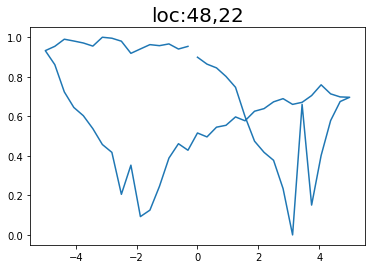

Epoch 1/200 ... Training loss: 2.5198
Epoch 10/200 ... Training loss: 2.3742
Epoch 20/200 ... Training loss: 2.2423
Epoch 30/200 ... Training loss: 2.0165
Epoch 40/200 ... Training loss: 1.8854
Epoch 50/200 ... Training loss: 1.7867
Epoch 60/200 ... Training loss: 1.6931
Epoch 70/200 ... Training loss: 1.6207
Epoch 80/200 ... Training loss: 1.5744
Epoch 90/200 ... Training loss: 1.5354
Epoch 100/200 ... Training loss: 1.5333
Epoch 110/200 ... Training loss: 1.5044
Epoch 120/200 ... Training loss: 1.4513
Epoch 130/200 ... Training loss: 1.4121
Epoch 140/200 ... Training loss: 1.3551
Epoch 150/200 ... Training loss: 1.3731
Epoch 160/200 ... Training loss: 1.265
Epoch 170/200 ... Training loss: 1.2145
Epoch 180/200 ... Training loss: 1.1581
Epoch 190/200 ... Training loss: 1.1671
Epoch 200/200 ... Training loss: 1.0518
step:  42
Sample #52




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


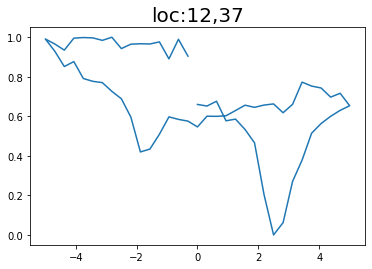

Epoch 1/200 ... Training loss: 2.5227
Epoch 10/200 ... Training loss: 2.4616
Epoch 20/200 ... Training loss: 2.218
Epoch 30/200 ... Training loss: 2.1049
Epoch 40/200 ... Training loss: 2.0081
Epoch 50/200 ... Training loss: 1.9121
Epoch 60/200 ... Training loss: 1.837
Epoch 70/200 ... Training loss: 1.7743
Epoch 80/200 ... Training loss: 1.704
Epoch 90/200 ... Training loss: 1.6231
Epoch 100/200 ... Training loss: 1.5685
Epoch 110/200 ... Training loss: 1.5255
Epoch 120/200 ... Training loss: 1.5654
Epoch 130/200 ... Training loss: 1.4776
Epoch 140/200 ... Training loss: 1.4514
Epoch 150/200 ... Training loss: 1.4285
Epoch 160/200 ... Training loss: 1.3823
Epoch 170/200 ... Training loss: 1.3822
Epoch 180/200 ... Training loss: 1.3418
Epoch 190/200 ... Training loss: 1.2645
Epoch 200/200 ... Training loss: 1.3418
step:  43
Sample #53




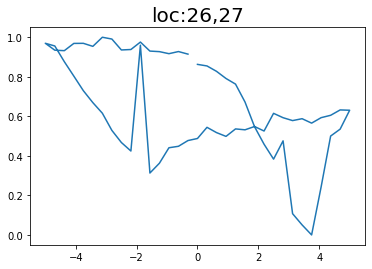

Epoch 1/200 ... Training loss: 2.4897
Epoch 10/200 ... Training loss: 2.4296
Epoch 20/200 ... Training loss: 2.1946
Epoch 30/200 ... Training loss: 2.0939
Epoch 40/200 ... Training loss: 1.9242
Epoch 50/200 ... Training loss: 1.8459
Epoch 60/200 ... Training loss: 1.7696
Epoch 70/200 ... Training loss: 1.6942
Epoch 80/200 ... Training loss: 1.6183
Epoch 90/200 ... Training loss: 1.5486
Epoch 100/200 ... Training loss: 1.5025
Epoch 110/200 ... Training loss: 1.5323
Epoch 120/200 ... Training loss: 1.6667
Epoch 130/200 ... Training loss: 1.467
Epoch 140/200 ... Training loss: 1.4563
Epoch 150/200 ... Training loss: 1.3733
Epoch 160/200 ... Training loss: 1.2992
Epoch 170/200 ... Training loss: 1.2634
Epoch 180/200 ... Training loss: 1.5317
Epoch 190/200 ... Training loss: 1.4188
Epoch 200/200 ... Training loss: 1.3331
step:  44
Sample #54




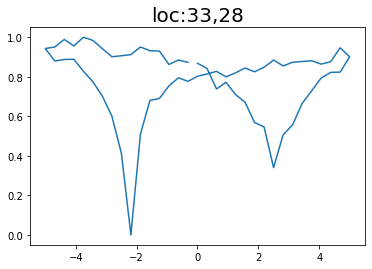

Epoch 1/200 ... Training loss: 2.4714
Epoch 10/200 ... Training loss: 2.3346
Epoch 20/200 ... Training loss: 2.1831
Epoch 30/200 ... Training loss: 2.0716
Epoch 40/200 ... Training loss: 1.974
Epoch 50/200 ... Training loss: 1.8801
Epoch 60/200 ... Training loss: 1.8102
Epoch 70/200 ... Training loss: 1.7453
Epoch 80/200 ... Training loss: 1.6635
Epoch 90/200 ... Training loss: 1.5956
Epoch 100/200 ... Training loss: 1.5578
Epoch 110/200 ... Training loss: 1.502
Epoch 120/200 ... Training loss: 1.468
Epoch 130/200 ... Training loss: 1.4363
Epoch 140/200 ... Training loss: 1.4059
Epoch 150/200 ... Training loss: 1.5632
Epoch 160/200 ... Training loss: 1.3927
Epoch 170/200 ... Training loss: 1.341
Epoch 180/200 ... Training loss: 1.3715
Epoch 190/200 ... Training loss: 1.3867
Epoch 200/200 ... Training loss: 1.3349
step:  45
Sample #55




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


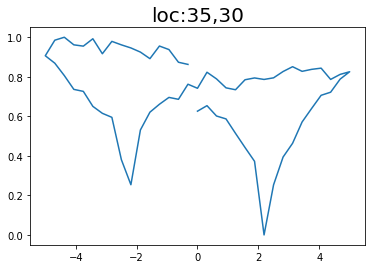

Epoch 1/200 ... Training loss: 2.4165
Epoch 10/200 ... Training loss: 2.5882
Epoch 20/200 ... Training loss: 2.1279
Epoch 30/200 ... Training loss: 1.9522
Epoch 40/200 ... Training loss: 1.8358
Epoch 50/200 ... Training loss: 1.7047
Epoch 60/200 ... Training loss: 1.6187
Epoch 70/200 ... Training loss: 1.5645
Epoch 80/200 ... Training loss: 1.5221
Epoch 90/200 ... Training loss: 1.5024
Epoch 100/200 ... Training loss: 1.4534
Epoch 110/200 ... Training loss: 1.4395
Epoch 120/200 ... Training loss: 1.4623
Epoch 130/200 ... Training loss: 1.3308
Epoch 140/200 ... Training loss: 1.2683
Epoch 150/200 ... Training loss: 1.2208
Epoch 160/200 ... Training loss: 1.1589
Epoch 170/200 ... Training loss: 1.1588
Epoch 180/200 ... Training loss: 1.1375
Epoch 190/200 ... Training loss: 1.0163
Epoch 200/200 ... Training loss: 0.9267
step:  46
Sample #56




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


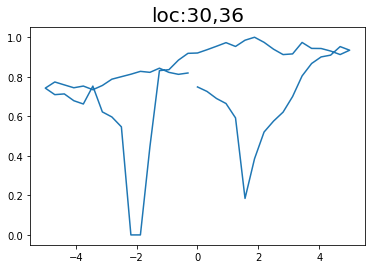

Epoch 1/200 ... Training loss: 2.3896
Epoch 10/200 ... Training loss: 2.3248
Epoch 20/200 ... Training loss: 2.1173
Epoch 30/200 ... Training loss: 1.9731
Epoch 40/200 ... Training loss: 1.8897
Epoch 50/200 ... Training loss: 1.8228
Epoch 60/200 ... Training loss: 1.7586
Epoch 70/200 ... Training loss: 1.6858
Epoch 80/200 ... Training loss: 1.5848
Epoch 90/200 ... Training loss: 1.533
Epoch 100/200 ... Training loss: 1.4985
Epoch 110/200 ... Training loss: 1.4767
Epoch 120/200 ... Training loss: 1.4457
Epoch 130/200 ... Training loss: 1.399
Epoch 140/200 ... Training loss: 1.349
Epoch 150/200 ... Training loss: 1.3812
Epoch 160/200 ... Training loss: 1.3414
Epoch 170/200 ... Training loss: 1.339
Epoch 180/200 ... Training loss: 1.3859
Epoch 190/200 ... Training loss: 1.2433
Epoch 200/200 ... Training loss: 1.126
step:  47
Sample #57




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


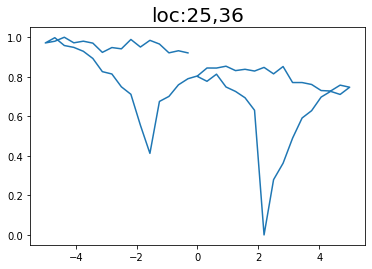

Epoch 1/200 ... Training loss: 2.3615
Epoch 10/200 ... Training loss: 2.3712
Epoch 20/200 ... Training loss: 2.1111
Epoch 30/200 ... Training loss: 1.9371
Epoch 40/200 ... Training loss: 1.8451
Epoch 50/200 ... Training loss: 1.7463
Epoch 60/200 ... Training loss: 1.6263
Epoch 70/200 ... Training loss: 1.5676
Epoch 80/200 ... Training loss: 1.5213
Epoch 90/200 ... Training loss: 1.4865
Epoch 100/200 ... Training loss: 1.4569
Epoch 110/200 ... Training loss: 1.4246
Epoch 120/200 ... Training loss: 1.4309
Epoch 130/200 ... Training loss: 1.441
Epoch 140/200 ... Training loss: 1.3808
Epoch 150/200 ... Training loss: 1.3177
Epoch 160/200 ... Training loss: 1.249
Epoch 170/200 ... Training loss: 1.289
Epoch 180/200 ... Training loss: 1.1632
Epoch 190/200 ... Training loss: 1.1185
Epoch 200/200 ... Training loss: 1.0456
step:  48
Sample #58




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


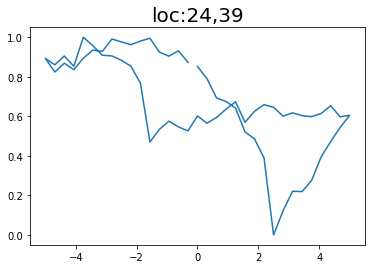

Epoch 1/200 ... Training loss: 2.3364
Epoch 10/200 ... Training loss: 2.1887
Epoch 20/200 ... Training loss: 2.0727
Epoch 30/200 ... Training loss: 1.8875
Epoch 40/200 ... Training loss: 1.8234
Epoch 50/200 ... Training loss: 1.7533
Epoch 60/200 ... Training loss: 1.6824
Epoch 70/200 ... Training loss: 1.6056
Epoch 80/200 ... Training loss: 1.5233
Epoch 90/200 ... Training loss: 1.5013
Epoch 100/200 ... Training loss: 1.4622
Epoch 110/200 ... Training loss: 1.4107
Epoch 120/200 ... Training loss: 1.4451
Epoch 130/200 ... Training loss: 1.378
Epoch 140/200 ... Training loss: 1.3276
Epoch 150/200 ... Training loss: 1.4083
Epoch 160/200 ... Training loss: 1.2663
Epoch 170/200 ... Training loss: 1.3096
Epoch 180/200 ... Training loss: 1.6034
Epoch 190/200 ... Training loss: 1.3797
Epoch 200/200 ... Training loss: 1.271
step:  49
Sample #59




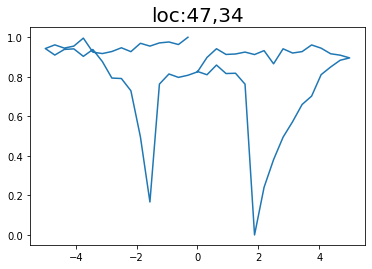

Epoch 1/200 ... Training loss: 2.3161
Epoch 10/200 ... Training loss: 2.1577
Epoch 20/200 ... Training loss: 1.9575
Epoch 30/200 ... Training loss: 1.8269
Epoch 40/200 ... Training loss: 1.674
Epoch 50/200 ... Training loss: 1.6085
Epoch 60/200 ... Training loss: 1.5922
Epoch 70/200 ... Training loss: 1.5267
Epoch 80/200 ... Training loss: 1.4765
Epoch 90/200 ... Training loss: 1.4376
Epoch 100/200 ... Training loss: 1.4016
Epoch 110/200 ... Training loss: 1.3852
Epoch 120/200 ... Training loss: 1.3996
Epoch 130/200 ... Training loss: 1.3779
Epoch 140/200 ... Training loss: 1.3305
Epoch 150/200 ... Training loss: 1.2866
Epoch 160/200 ... Training loss: 1.2797
Epoch 170/200 ... Training loss: 1.2489
Epoch 180/200 ... Training loss: 1.1809
Epoch 190/200 ... Training loss: 1.2832
Epoch 200/200 ... Training loss: 1.1232
step:  50
Sample #60




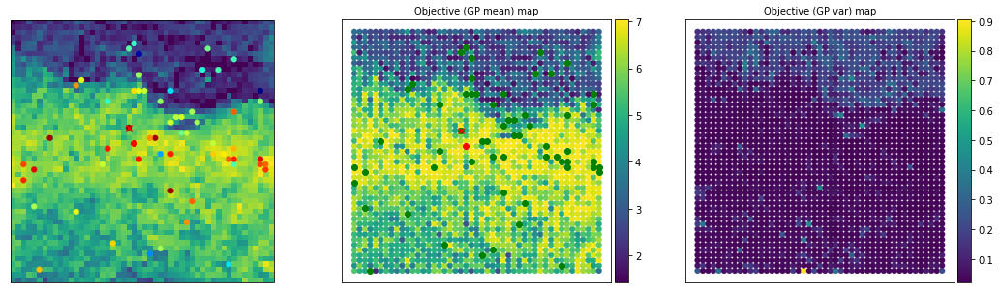

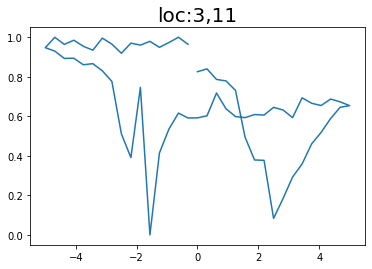

Epoch 1/200 ... Training loss: 2.2936
Epoch 10/200 ... Training loss: 2.1364
Epoch 20/200 ... Training loss: 1.9438
Epoch 30/200 ... Training loss: 1.81
Epoch 40/200 ... Training loss: 1.6514
Epoch 50/200 ... Training loss: 1.5788
Epoch 60/200 ... Training loss: 1.5586
Epoch 70/200 ... Training loss: 1.4909
Epoch 80/200 ... Training loss: 1.4492
Epoch 90/200 ... Training loss: 1.4177
Epoch 100/200 ... Training loss: 1.3798
Epoch 110/200 ... Training loss: 1.4575
Epoch 120/200 ... Training loss: 1.359
Epoch 130/200 ... Training loss: 1.3366
Epoch 140/200 ... Training loss: 1.5517
Epoch 150/200 ... Training loss: 1.3224
Epoch 160/200 ... Training loss: 1.1934
Epoch 170/200 ... Training loss: 1.1876
Epoch 180/200 ... Training loss: 1.0888
Epoch 190/200 ... Training loss: 1.1002
Epoch 200/200 ... Training loss: 1.0562
step:  51
Sample #61




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


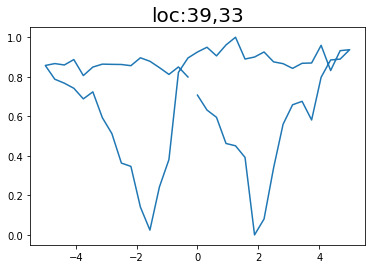

Epoch 1/200 ... Training loss: 2.2684
Epoch 10/200 ... Training loss: 2.1196
Epoch 20/200 ... Training loss: 1.9286
Epoch 30/200 ... Training loss: 1.8124
Epoch 40/200 ... Training loss: 1.7016
Epoch 50/200 ... Training loss: 1.5804
Epoch 60/200 ... Training loss: 1.5091
Epoch 70/200 ... Training loss: 1.6116
Epoch 80/200 ... Training loss: 1.5145
Epoch 90/200 ... Training loss: 1.444
Epoch 100/200 ... Training loss: 1.3957
Epoch 110/200 ... Training loss: 1.3621
Epoch 120/200 ... Training loss: 1.3264
Epoch 130/200 ... Training loss: 1.35
Epoch 140/200 ... Training loss: 1.2878
Epoch 150/200 ... Training loss: 1.4615
Epoch 160/200 ... Training loss: 1.3204
Epoch 170/200 ... Training loss: 1.2658
Epoch 180/200 ... Training loss: 1.3288
Epoch 190/200 ... Training loss: 1.2572
Epoch 200/200 ... Training loss: 1.1908
step:  52
Sample #62




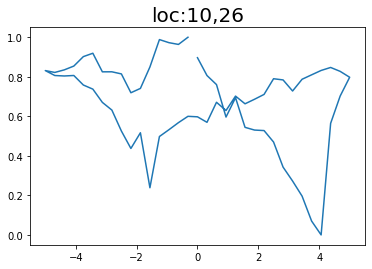

Epoch 1/200 ... Training loss: 2.2522
Epoch 10/200 ... Training loss: 2.1059
Epoch 20/200 ... Training loss: 1.9114
Epoch 30/200 ... Training loss: 1.8071
Epoch 40/200 ... Training loss: 1.6933
Epoch 50/200 ... Training loss: 1.577
Epoch 60/200 ... Training loss: 1.6017
Epoch 70/200 ... Training loss: 1.5263
Epoch 80/200 ... Training loss: 1.4506
Epoch 90/200 ... Training loss: 1.4123
Epoch 100/200 ... Training loss: 1.3675
Epoch 110/200 ... Training loss: 1.361
Epoch 120/200 ... Training loss: 1.3525
Epoch 130/200 ... Training loss: 1.2782
Epoch 140/200 ... Training loss: 1.7716
Epoch 150/200 ... Training loss: 1.6807
Epoch 160/200 ... Training loss: 1.4895
Epoch 170/200 ... Training loss: 1.3888
Epoch 180/200 ... Training loss: 1.3277
Epoch 190/200 ... Training loss: 1.2787
Epoch 200/200 ... Training loss: 1.2787
step:  53
Sample #63




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


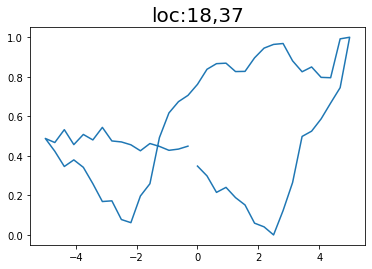

Epoch 1/200 ... Training loss: 2.2931
Epoch 10/200 ... Training loss: 2.253
Epoch 20/200 ... Training loss: 2.1036
Epoch 30/200 ... Training loss: 1.9627
Epoch 40/200 ... Training loss: 1.8816
Epoch 50/200 ... Training loss: 1.8076
Epoch 60/200 ... Training loss: 1.7381
Epoch 70/200 ... Training loss: 1.6939
Epoch 80/200 ... Training loss: 1.6614
Epoch 90/200 ... Training loss: 1.5971
Epoch 100/200 ... Training loss: 1.5192
Epoch 110/200 ... Training loss: 1.4531
Epoch 120/200 ... Training loss: 1.6594
Epoch 130/200 ... Training loss: 1.4984
Epoch 140/200 ... Training loss: 1.4482
Epoch 150/200 ... Training loss: 1.3987
Epoch 160/200 ... Training loss: 1.358
Epoch 170/200 ... Training loss: 1.3219
Epoch 180/200 ... Training loss: 1.3844
Epoch 190/200 ... Training loss: 1.3044
Epoch 200/200 ... Training loss: 1.2593
step:  54
Sample #64




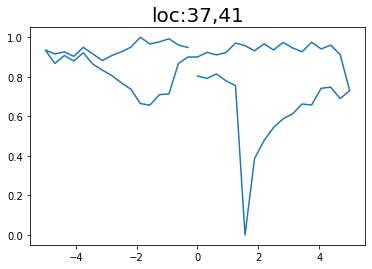

Epoch 1/200 ... Training loss: 2.2703
Epoch 10/200 ... Training loss: 2.1586
Epoch 20/200 ... Training loss: 2.0377
Epoch 30/200 ... Training loss: 1.8742
Epoch 40/200 ... Training loss: 1.7842
Epoch 50/200 ... Training loss: 1.7021
Epoch 60/200 ... Training loss: 1.65
Epoch 70/200 ... Training loss: 1.6111
Epoch 80/200 ... Training loss: 1.5453
Epoch 90/200 ... Training loss: 1.4662
Epoch 100/200 ... Training loss: 1.4198
Epoch 110/200 ... Training loss: 1.4508
Epoch 120/200 ... Training loss: 1.3806
Epoch 130/200 ... Training loss: 1.3354
Epoch 140/200 ... Training loss: 1.3318
Epoch 150/200 ... Training loss: 1.4405
Epoch 160/200 ... Training loss: 1.324
Epoch 170/200 ... Training loss: 1.2564
Epoch 180/200 ... Training loss: 1.2519
Epoch 190/200 ... Training loss: 1.1722
Epoch 200/200 ... Training loss: 1.2923
step:  55
Sample #65




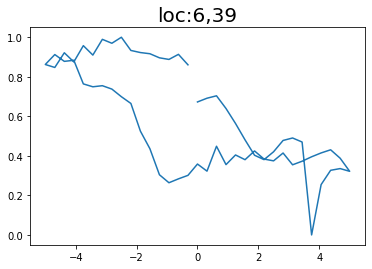

Epoch 1/200 ... Training loss: 2.2488
Epoch 10/200 ... Training loss: 2.2079
Epoch 20/200 ... Training loss: 2.0478
Epoch 30/200 ... Training loss: 1.9192
Epoch 40/200 ... Training loss: 1.7889
Epoch 50/200 ... Training loss: 1.7227
Epoch 60/200 ... Training loss: 1.6582
Epoch 70/200 ... Training loss: 1.5858
Epoch 80/200 ... Training loss: 1.5121
Epoch 90/200 ... Training loss: 1.4572
Epoch 100/200 ... Training loss: 1.4263
Epoch 110/200 ... Training loss: 1.3688
Epoch 120/200 ... Training loss: 1.3318
Epoch 130/200 ... Training loss: 1.534
Epoch 140/200 ... Training loss: 1.3333
Epoch 150/200 ... Training loss: 1.2506
Epoch 160/200 ... Training loss: 1.2505
Epoch 170/200 ... Training loss: 1.3062
Epoch 180/200 ... Training loss: 1.1869
Epoch 190/200 ... Training loss: 1.1646
Epoch 200/200 ... Training loss: 1.2912
step:  56
Sample #66




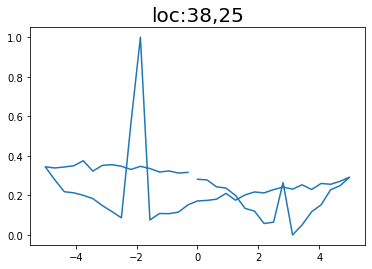

Epoch 1/200 ... Training loss: 2.2499
Epoch 10/200 ... Training loss: 2.2002
Epoch 20/200 ... Training loss: 2.0272
Epoch 30/200 ... Training loss: 1.8985
Epoch 40/200 ... Training loss: 1.7928
Epoch 50/200 ... Training loss: 1.73
Epoch 60/200 ... Training loss: 1.674
Epoch 70/200 ... Training loss: 1.6132
Epoch 80/200 ... Training loss: 1.5403
Epoch 90/200 ... Training loss: 1.4754
Epoch 100/200 ... Training loss: 1.5421
Epoch 110/200 ... Training loss: 1.382
Epoch 120/200 ... Training loss: 1.321
Epoch 130/200 ... Training loss: 1.3502
Epoch 140/200 ... Training loss: 1.4201
Epoch 150/200 ... Training loss: 1.2542
Epoch 160/200 ... Training loss: 1.1615
Epoch 170/200 ... Training loss: 1.2561
Epoch 180/200 ... Training loss: 1.0892
Epoch 190/200 ... Training loss: 0.9858
Epoch 200/200 ... Training loss: 0.9361
step:  57
Sample #67




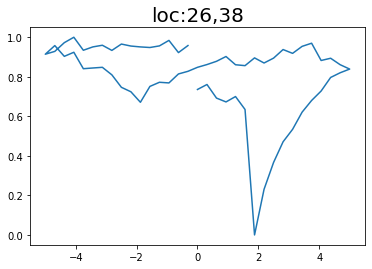

Epoch 1/200 ... Training loss: 2.2299
Epoch 10/200 ... Training loss: 2.212
Epoch 20/200 ... Training loss: 2.0377
Epoch 30/200 ... Training loss: 1.9044
Epoch 40/200 ... Training loss: 1.7652
Epoch 50/200 ... Training loss: 1.6969
Epoch 60/200 ... Training loss: 1.6326
Epoch 70/200 ... Training loss: 1.551
Epoch 80/200 ... Training loss: 1.4895
Epoch 90/200 ... Training loss: 1.416
Epoch 100/200 ... Training loss: 1.5274
Epoch 110/200 ... Training loss: 1.4044
Epoch 120/200 ... Training loss: 1.3867
Epoch 130/200 ... Training loss: 1.2738
Epoch 140/200 ... Training loss: 1.1797
Epoch 150/200 ... Training loss: 1.1151
Epoch 160/200 ... Training loss: 1.0572
Epoch 170/200 ... Training loss: 1.2109
Epoch 180/200 ... Training loss: 1.1014
Epoch 190/200 ... Training loss: 1.0023
Epoch 200/200 ... Training loss: 0.8985
step:  58
Sample #68




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


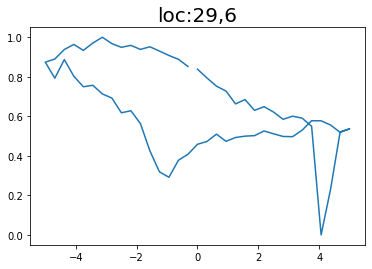

Epoch 1/200 ... Training loss: 2.2224
Epoch 10/200 ... Training loss: 2.1963
Epoch 20/200 ... Training loss: 2.0048
Epoch 30/200 ... Training loss: 1.9128
Epoch 40/200 ... Training loss: 1.8252
Epoch 50/200 ... Training loss: 1.7262
Epoch 60/200 ... Training loss: 1.6695
Epoch 70/200 ... Training loss: 1.6244
Epoch 80/200 ... Training loss: 1.5724
Epoch 90/200 ... Training loss: 1.4934
Epoch 100/200 ... Training loss: 1.4314
Epoch 110/200 ... Training loss: 1.4514
Epoch 120/200 ... Training loss: 1.3951
Epoch 130/200 ... Training loss: 1.3328
Epoch 140/200 ... Training loss: 1.2941
Epoch 150/200 ... Training loss: 1.2773
Epoch 160/200 ... Training loss: 1.276
Epoch 170/200 ... Training loss: 1.1924
Epoch 180/200 ... Training loss: 1.0522
Epoch 190/200 ... Training loss: 1.0296
Epoch 200/200 ... Training loss: 1.0002
step:  59
Sample #69




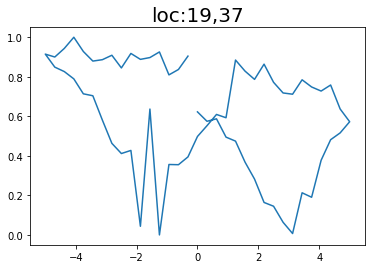

Epoch 1/200 ... Training loss: 2.2124
Epoch 10/200 ... Training loss: 2.1931
Epoch 20/200 ... Training loss: 1.987
Epoch 30/200 ... Training loss: 1.8812
Epoch 40/200 ... Training loss: 1.7608
Epoch 50/200 ... Training loss: 1.6961
Epoch 60/200 ... Training loss: 1.6388
Epoch 70/200 ... Training loss: 1.568
Epoch 80/200 ... Training loss: 1.4894
Epoch 90/200 ... Training loss: 1.4719
Epoch 100/200 ... Training loss: 1.4013
Epoch 110/200 ... Training loss: 1.3527
Epoch 120/200 ... Training loss: 1.2912
Epoch 130/200 ... Training loss: 1.3151
Epoch 140/200 ... Training loss: 1.293
Epoch 150/200 ... Training loss: 1.2029
Epoch 160/200 ... Training loss: 1.1443
Epoch 170/200 ... Training loss: 1.0245
Epoch 180/200 ... Training loss: 1.6561
Epoch 190/200 ... Training loss: 1.1815
Epoch 200/200 ... Training loss: 1.066
step:  60
Sample #70




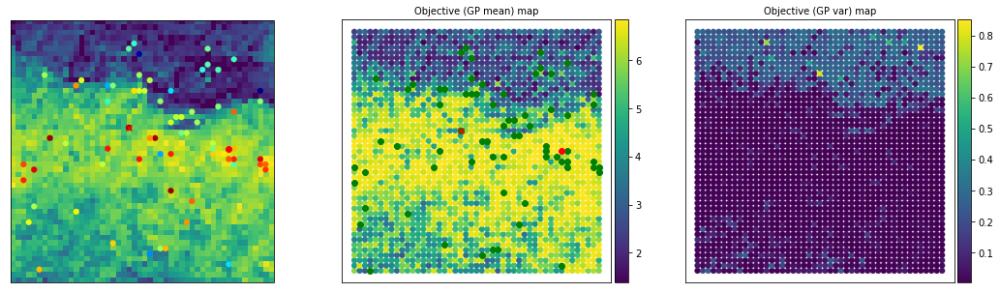

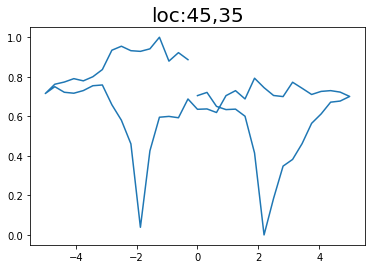

Epoch 1/200 ... Training loss: 2.1929
Epoch 10/200 ... Training loss: 2.0713
Epoch 20/200 ... Training loss: 1.9367
Epoch 30/200 ... Training loss: 1.8632
Epoch 40/200 ... Training loss: 1.7355
Epoch 50/200 ... Training loss: 1.6827
Epoch 60/200 ... Training loss: 1.6235
Epoch 70/200 ... Training loss: 1.5518
Epoch 80/200 ... Training loss: 1.477
Epoch 90/200 ... Training loss: 1.4592
Epoch 100/200 ... Training loss: 1.3857
Epoch 110/200 ... Training loss: 1.382
Epoch 120/200 ... Training loss: 1.2899
Epoch 130/200 ... Training loss: 1.2554
Epoch 140/200 ... Training loss: 1.5523
Epoch 150/200 ... Training loss: 1.298
Epoch 160/200 ... Training loss: 1.1607
Epoch 170/200 ... Training loss: 1.0792
Epoch 180/200 ... Training loss: 1.0646
Epoch 190/200 ... Training loss: 0.9842
Epoch 200/200 ... Training loss: 1.0111
step:  61
Sample #71




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


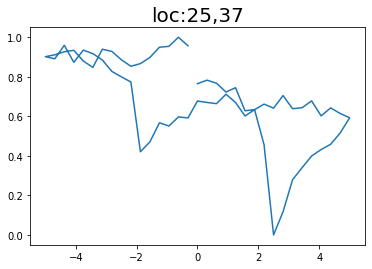

Epoch 1/200 ... Training loss: 2.174
Epoch 10/200 ... Training loss: 2.1319
Epoch 20/200 ... Training loss: 1.9897
Epoch 30/200 ... Training loss: 1.8849
Epoch 40/200 ... Training loss: 1.7937
Epoch 50/200 ... Training loss: 1.7036
Epoch 60/200 ... Training loss: 1.6496
Epoch 70/200 ... Training loss: 1.5933
Epoch 80/200 ... Training loss: 1.5344
Epoch 90/200 ... Training loss: 1.4577
Epoch 100/200 ... Training loss: 1.4156
Epoch 110/200 ... Training loss: 1.3785
Epoch 120/200 ... Training loss: 1.3808
Epoch 130/200 ... Training loss: 1.3279
Epoch 140/200 ... Training loss: 1.3052
Epoch 150/200 ... Training loss: 1.3136
Epoch 160/200 ... Training loss: 1.2002
Epoch 170/200 ... Training loss: 1.2337
Epoch 180/200 ... Training loss: 1.1278
Epoch 190/200 ... Training loss: 1.1184
Epoch 200/200 ... Training loss: 1.1679
step:  62
Sample #72




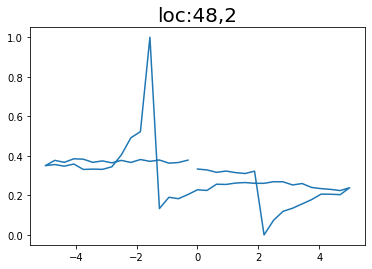

Epoch 1/200 ... Training loss: 2.2009
Epoch 10/200 ... Training loss: 2.0629
Epoch 20/200 ... Training loss: 1.9916
Epoch 30/200 ... Training loss: 1.8464
Epoch 40/200 ... Training loss: 1.7513
Epoch 50/200 ... Training loss: 1.6925
Epoch 60/200 ... Training loss: 1.6248
Epoch 70/200 ... Training loss: 1.5353
Epoch 80/200 ... Training loss: 1.4335
Epoch 90/200 ... Training loss: 1.4106
Epoch 100/200 ... Training loss: 1.3519
Epoch 110/200 ... Training loss: 1.3224
Epoch 120/200 ... Training loss: 1.3432
Epoch 130/200 ... Training loss: 1.1952
Epoch 140/200 ... Training loss: 1.2038
Epoch 150/200 ... Training loss: 1.0902
Epoch 160/200 ... Training loss: 1.5278
Epoch 170/200 ... Training loss: 1.3645
Epoch 180/200 ... Training loss: 1.1794
Epoch 190/200 ... Training loss: 1.0199
Epoch 200/200 ... Training loss: 1.0259
step:  63
Sample #73




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


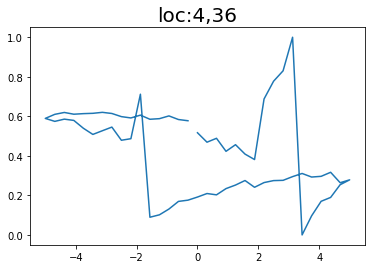

Epoch 1/200 ... Training loss: 2.1908
Epoch 10/200 ... Training loss: 2.0375
Epoch 20/200 ... Training loss: 1.8545
Epoch 30/200 ... Training loss: 1.7619
Epoch 40/200 ... Training loss: 1.661
Epoch 50/200 ... Training loss: 1.5443
Epoch 60/200 ... Training loss: 1.4699
Epoch 70/200 ... Training loss: 1.4129
Epoch 80/200 ... Training loss: 1.3712
Epoch 90/200 ... Training loss: 1.2946
Epoch 100/200 ... Training loss: 1.6743
Epoch 110/200 ... Training loss: 1.4811
Epoch 120/200 ... Training loss: 1.2993
Epoch 130/200 ... Training loss: 1.2202
Epoch 140/200 ... Training loss: 1.1822
Epoch 150/200 ... Training loss: 1.1301
Epoch 160/200 ... Training loss: 1.209
Epoch 170/200 ... Training loss: 1.042
Epoch 180/200 ... Training loss: 1.0115
Epoch 190/200 ... Training loss: 1.0576
Epoch 200/200 ... Training loss: 0.9644
step:  64
Sample #74




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


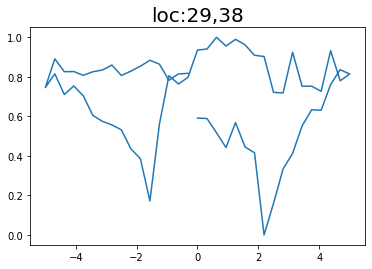

Epoch 1/200 ... Training loss: 2.1806
Epoch 10/200 ... Training loss: 2.0351
Epoch 20/200 ... Training loss: 1.8901
Epoch 30/200 ... Training loss: 1.7549
Epoch 40/200 ... Training loss: 1.6836
Epoch 50/200 ... Training loss: 1.6377
Epoch 60/200 ... Training loss: 1.5799
Epoch 70/200 ... Training loss: 1.4968
Epoch 80/200 ... Training loss: 1.5492
Epoch 90/200 ... Training loss: 1.4279
Epoch 100/200 ... Training loss: 1.3508
Epoch 110/200 ... Training loss: 1.5972
Epoch 120/200 ... Training loss: 1.4017
Epoch 130/200 ... Training loss: 1.2928
Epoch 140/200 ... Training loss: 1.2616
Epoch 150/200 ... Training loss: 1.2759
Epoch 160/200 ... Training loss: 1.2388
Epoch 170/200 ... Training loss: 1.1188
Epoch 180/200 ... Training loss: 1.7055
Epoch 190/200 ... Training loss: 1.4593
Epoch 200/200 ... Training loss: 1.2877
step:  65
Sample #75




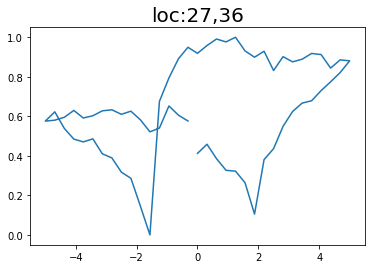

Epoch 1/200 ... Training loss: 2.162
Epoch 10/200 ... Training loss: 2.0331
Epoch 20/200 ... Training loss: 1.9489
Epoch 30/200 ... Training loss: 1.7969
Epoch 40/200 ... Training loss: 1.7076
Epoch 50/200 ... Training loss: 1.6516
Epoch 60/200 ... Training loss: 1.6015
Epoch 70/200 ... Training loss: 1.5372
Epoch 80/200 ... Training loss: 1.4503
Epoch 90/200 ... Training loss: 1.4267
Epoch 100/200 ... Training loss: 1.3598
Epoch 110/200 ... Training loss: 1.3261
Epoch 120/200 ... Training loss: 1.2704
Epoch 130/200 ... Training loss: 1.254
Epoch 140/200 ... Training loss: 1.3296
Epoch 150/200 ... Training loss: 1.221
Epoch 160/200 ... Training loss: 1.4558
Epoch 170/200 ... Training loss: 1.2439
Epoch 180/200 ... Training loss: 1.101
Epoch 190/200 ... Training loss: 1.0086
Epoch 200/200 ... Training loss: 1.1729
step:  66
Sample #76




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


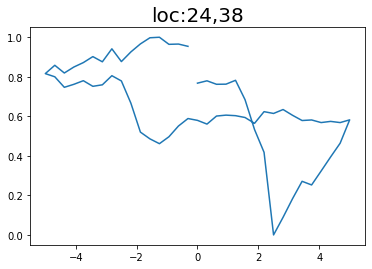

Epoch 1/200 ... Training loss: 2.1581
Epoch 10/200 ... Training loss: 2.0318
Epoch 20/200 ... Training loss: 1.904
Epoch 30/200 ... Training loss: 1.7755
Epoch 40/200 ... Training loss: 1.7042
Epoch 50/200 ... Training loss: 1.5971
Epoch 60/200 ... Training loss: 1.4948
Epoch 70/200 ... Training loss: 1.4282
Epoch 80/200 ... Training loss: 1.3675
Epoch 90/200 ... Training loss: 1.348
Epoch 100/200 ... Training loss: 1.3294
Epoch 110/200 ... Training loss: 1.256
Epoch 120/200 ... Training loss: 1.2946
Epoch 130/200 ... Training loss: 1.2385
Epoch 140/200 ... Training loss: 1.1861
Epoch 150/200 ... Training loss: 1.1333
Epoch 160/200 ... Training loss: 1.1569
Epoch 170/200 ... Training loss: 1.0583
Epoch 180/200 ... Training loss: 1.1413
Epoch 190/200 ... Training loss: 1.0018
Epoch 200/200 ... Training loss: 0.9227
step:  67
Sample #77




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


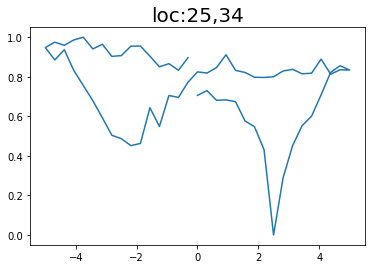

Epoch 1/200 ... Training loss: 2.1407
Epoch 10/200 ... Training loss: 2.0516
Epoch 20/200 ... Training loss: 1.9455
Epoch 30/200 ... Training loss: 1.8104
Epoch 40/200 ... Training loss: 1.6993
Epoch 50/200 ... Training loss: 1.6247
Epoch 60/200 ... Training loss: 1.5633
Epoch 70/200 ... Training loss: 1.4753
Epoch 80/200 ... Training loss: 1.3946
Epoch 90/200 ... Training loss: 1.3588
Epoch 100/200 ... Training loss: 1.3002
Epoch 110/200 ... Training loss: 1.2674
Epoch 120/200 ... Training loss: 1.2225
Epoch 130/200 ... Training loss: 1.2722
Epoch 140/200 ... Training loss: 1.2032
Epoch 150/200 ... Training loss: 1.0729
Epoch 160/200 ... Training loss: 1.171
Epoch 170/200 ... Training loss: 0.9852
Epoch 180/200 ... Training loss: 1.0911
Epoch 190/200 ... Training loss: 0.9013
Epoch 200/200 ... Training loss: 0.828
step:  68
Sample #78




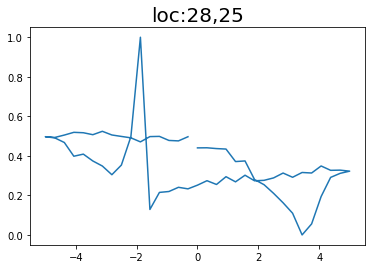

Epoch 1/200 ... Training loss: 2.1239
Epoch 10/200 ... Training loss: 2.026
Epoch 20/200 ... Training loss: 1.9339
Epoch 30/200 ... Training loss: 1.8077
Epoch 40/200 ... Training loss: 1.6994
Epoch 50/200 ... Training loss: 1.6382
Epoch 60/200 ... Training loss: 1.5697
Epoch 70/200 ... Training loss: 1.4899
Epoch 80/200 ... Training loss: 1.3986
Epoch 90/200 ... Training loss: 1.3506
Epoch 100/200 ... Training loss: 1.3067
Epoch 110/200 ... Training loss: 1.2581
Epoch 120/200 ... Training loss: 1.2447
Epoch 130/200 ... Training loss: 1.1823
Epoch 140/200 ... Training loss: 1.1458
Epoch 150/200 ... Training loss: 1.0308
Epoch 160/200 ... Training loss: 0.9992
Epoch 170/200 ... Training loss: 1.1134
Epoch 180/200 ... Training loss: 0.9145
Epoch 190/200 ... Training loss: 0.9934
Epoch 200/200 ... Training loss: 0.8433
step:  69
Sample #79




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


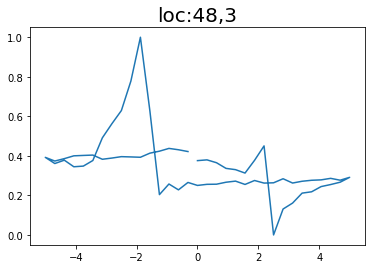

Epoch 1/200 ... Training loss: 2.1436
Epoch 10/200 ... Training loss: 2.048
Epoch 20/200 ... Training loss: 1.9688
Epoch 30/200 ... Training loss: 1.8242
Epoch 40/200 ... Training loss: 1.7376
Epoch 50/200 ... Training loss: 1.6742
Epoch 60/200 ... Training loss: 1.6122
Epoch 70/200 ... Training loss: 1.5397
Epoch 80/200 ... Training loss: 1.4625
Epoch 90/200 ... Training loss: 1.4076
Epoch 100/200 ... Training loss: 1.4063
Epoch 110/200 ... Training loss: 1.3314
Epoch 120/200 ... Training loss: 1.2885
Epoch 130/200 ... Training loss: 1.257
Epoch 140/200 ... Training loss: 1.232
Epoch 150/200 ... Training loss: 1.1845
Epoch 160/200 ... Training loss: 1.1603
Epoch 170/200 ... Training loss: 1.1674
Epoch 180/200 ... Training loss: 1.1959
Epoch 190/200 ... Training loss: 1.1893
Epoch 200/200 ... Training loss: 1.297
step:  70
Sample #80




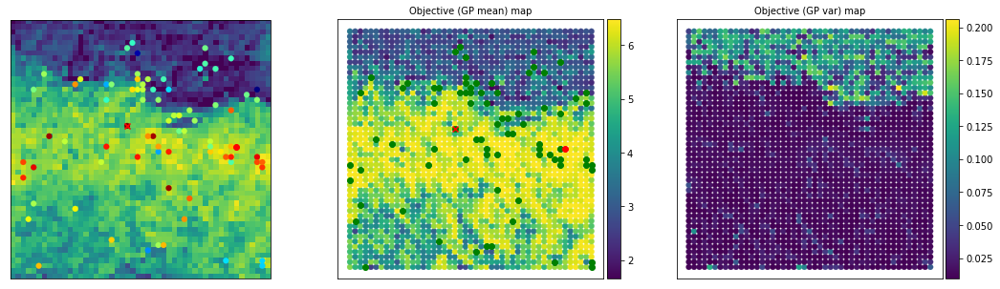

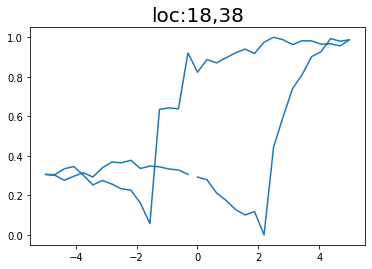

Epoch 1/200 ... Training loss: 2.1583
Epoch 10/200 ... Training loss: 1.995
Epoch 20/200 ... Training loss: 1.8185
Epoch 30/200 ... Training loss: 1.7168
Epoch 40/200 ... Training loss: 1.603
Epoch 50/200 ... Training loss: 1.5272
Epoch 60/200 ... Training loss: 1.4844
Epoch 70/200 ... Training loss: 1.3887
Epoch 80/200 ... Training loss: 1.3835
Epoch 90/200 ... Training loss: 1.3091
Epoch 100/200 ... Training loss: 1.2829
Epoch 110/200 ... Training loss: 1.2433
Epoch 120/200 ... Training loss: 1.245
Epoch 130/200 ... Training loss: 1.2999
Epoch 140/200 ... Training loss: 1.1516
Epoch 150/200 ... Training loss: 1.0476
Epoch 160/200 ... Training loss: 1.1358
Epoch 170/200 ... Training loss: 0.9642
Epoch 180/200 ... Training loss: 0.9656
Epoch 190/200 ... Training loss: 1.0325
Epoch 200/200 ... Training loss: 0.8952
step:  71
Sample #81




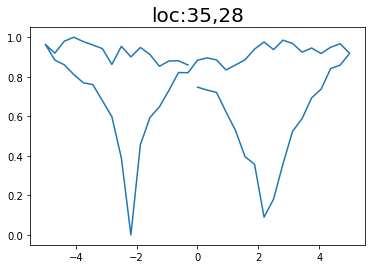

Epoch 1/200 ... Training loss: 2.1449
Epoch 10/200 ... Training loss: 2.0736
Epoch 20/200 ... Training loss: 1.9443
Epoch 30/200 ... Training loss: 1.8515
Epoch 40/200 ... Training loss: 1.7606
Epoch 50/200 ... Training loss: 1.6779
Epoch 60/200 ... Training loss: 1.6115
Epoch 70/200 ... Training loss: 1.5746
Epoch 80/200 ... Training loss: 1.5321
Epoch 90/200 ... Training loss: 1.4694
Epoch 100/200 ... Training loss: 1.3947
Epoch 110/200 ... Training loss: 1.4571
Epoch 120/200 ... Training loss: 1.3536
Epoch 130/200 ... Training loss: 1.3277
Epoch 140/200 ... Training loss: 1.2704
Epoch 150/200 ... Training loss: 1.2244
Epoch 160/200 ... Training loss: 1.191
Epoch 170/200 ... Training loss: 1.2039
Epoch 180/200 ... Training loss: 1.1569
Epoch 190/200 ... Training loss: 1.2115
Epoch 200/200 ... Training loss: 1.2694
step:  72
Sample #82




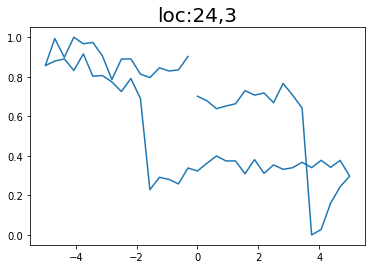

Epoch 1/200 ... Training loss: 2.143
Epoch 10/200 ... Training loss: 2.0353
Epoch 20/200 ... Training loss: 1.9565
Epoch 30/200 ... Training loss: 1.7907
Epoch 40/200 ... Training loss: 1.6948
Epoch 50/200 ... Training loss: 1.6264
Epoch 60/200 ... Training loss: 1.5574
Epoch 70/200 ... Training loss: 1.4738
Epoch 80/200 ... Training loss: 1.4027
Epoch 90/200 ... Training loss: 1.3833
Epoch 100/200 ... Training loss: 1.3214
Epoch 110/200 ... Training loss: 1.3464
Epoch 120/200 ... Training loss: 1.2627
Epoch 130/200 ... Training loss: 1.2204
Epoch 140/200 ... Training loss: 1.284
Epoch 150/200 ... Training loss: 1.1928
Epoch 160/200 ... Training loss: 1.083
Epoch 170/200 ... Training loss: 1.1044
Epoch 180/200 ... Training loss: 1.1055
Epoch 190/200 ... Training loss: 0.9455
Epoch 200/200 ... Training loss: 0.9146
step:  73
Sample #83




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


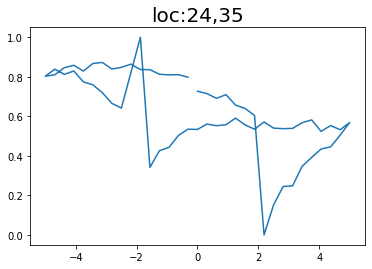

Epoch 1/200 ... Training loss: 2.1337
Epoch 10/200 ... Training loss: 2.004
Epoch 20/200 ... Training loss: 1.9521
Epoch 30/200 ... Training loss: 1.8642
Epoch 40/200 ... Training loss: 1.7846
Epoch 50/200 ... Training loss: 1.7034
Epoch 60/200 ... Training loss: 1.6299
Epoch 70/200 ... Training loss: 1.5683
Epoch 80/200 ... Training loss: 1.5014
Epoch 90/200 ... Training loss: 1.4189
Epoch 100/200 ... Training loss: 1.3581
Epoch 110/200 ... Training loss: 1.3009
Epoch 120/200 ... Training loss: 1.303
Epoch 130/200 ... Training loss: 1.2308
Epoch 140/200 ... Training loss: 1.235
Epoch 150/200 ... Training loss: 1.1494
Epoch 160/200 ... Training loss: 1.1623
Epoch 170/200 ... Training loss: 1.2398
Epoch 180/200 ... Training loss: 1.1598
Epoch 190/200 ... Training loss: 1.0105
Epoch 200/200 ... Training loss: 0.9818
step:  74
Sample #84




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


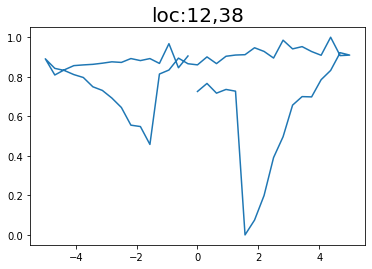

Epoch 1/200 ... Training loss: 2.1209
Epoch 10/200 ... Training loss: 2.0613
Epoch 20/200 ... Training loss: 1.9201
Epoch 30/200 ... Training loss: 1.794
Epoch 40/200 ... Training loss: 1.7099
Epoch 50/200 ... Training loss: 1.6507
Epoch 60/200 ... Training loss: 1.5907
Epoch 70/200 ... Training loss: 1.5263
Epoch 80/200 ... Training loss: 1.4547
Epoch 90/200 ... Training loss: 1.3886
Epoch 100/200 ... Training loss: 1.3154
Epoch 110/200 ... Training loss: 1.3444
Epoch 120/200 ... Training loss: 1.2788
Epoch 130/200 ... Training loss: 1.2179
Epoch 140/200 ... Training loss: 1.3429
Epoch 150/200 ... Training loss: 1.2702
Epoch 160/200 ... Training loss: 1.1423
Epoch 170/200 ... Training loss: 1.2337
Epoch 180/200 ... Training loss: 1.0569
Epoch 190/200 ... Training loss: 1.1609
Epoch 200/200 ... Training loss: 1.4703
step:  75
Sample #85




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


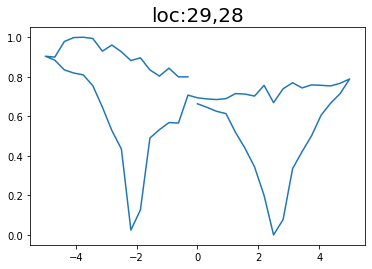

Epoch 1/200 ... Training loss: 2.1076
Epoch 10/200 ... Training loss: 2.0761
Epoch 20/200 ... Training loss: 1.9379
Epoch 30/200 ... Training loss: 1.7751
Epoch 40/200 ... Training loss: 1.6635
Epoch 50/200 ... Training loss: 1.5845
Epoch 60/200 ... Training loss: 1.5373
Epoch 70/200 ... Training loss: 1.4847
Epoch 80/200 ... Training loss: 1.4161
Epoch 90/200 ... Training loss: 1.3682
Epoch 100/200 ... Training loss: 1.3181
Epoch 110/200 ... Training loss: 1.2566
Epoch 120/200 ... Training loss: 1.2676
Epoch 130/200 ... Training loss: 1.1695
Epoch 140/200 ... Training loss: 1.2724
Epoch 150/200 ... Training loss: 1.1476
Epoch 160/200 ... Training loss: 1.2006
Epoch 170/200 ... Training loss: 1.0562
Epoch 180/200 ... Training loss: 1.1796
Epoch 190/200 ... Training loss: 1.0076
Epoch 200/200 ... Training loss: 0.9408
step:  76
Sample #86




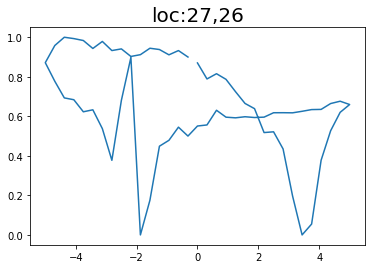

Epoch 1/200 ... Training loss: 2.0987
Epoch 10/200 ... Training loss: 1.9793
Epoch 20/200 ... Training loss: 1.8941
Epoch 30/200 ... Training loss: 1.7815
Epoch 40/200 ... Training loss: 1.6758
Epoch 50/200 ... Training loss: 1.5983
Epoch 60/200 ... Training loss: 1.5218
Epoch 70/200 ... Training loss: 1.4322
Epoch 80/200 ... Training loss: 1.36
Epoch 90/200 ... Training loss: 1.3143
Epoch 100/200 ... Training loss: 1.2809
Epoch 110/200 ... Training loss: 1.2119
Epoch 120/200 ... Training loss: 1.2293
Epoch 130/200 ... Training loss: 1.2719
Epoch 140/200 ... Training loss: 1.1707
Epoch 150/200 ... Training loss: 1.2064
Epoch 160/200 ... Training loss: 1.0235
Epoch 170/200 ... Training loss: 1.072
Epoch 180/200 ... Training loss: 1.1844
Epoch 190/200 ... Training loss: 1.1017
Epoch 200/200 ... Training loss: 1.0304
step:  77
Sample #87




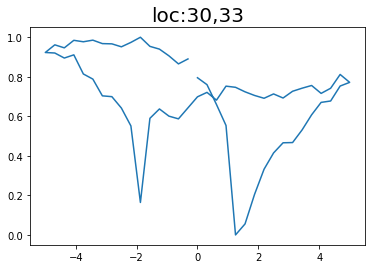

Epoch 1/200 ... Training loss: 2.0862
Epoch 10/200 ... Training loss: 2.0329
Epoch 20/200 ... Training loss: 1.9824
Epoch 30/200 ... Training loss: 1.7573
Epoch 40/200 ... Training loss: 1.6517
Epoch 50/200 ... Training loss: 1.5897
Epoch 60/200 ... Training loss: 1.5489
Epoch 70/200 ... Training loss: 1.4946
Epoch 80/200 ... Training loss: 1.3878
Epoch 90/200 ... Training loss: 1.3336
Epoch 100/200 ... Training loss: 1.3517
Epoch 110/200 ... Training loss: 1.2412
Epoch 120/200 ... Training loss: 1.2494
Epoch 130/200 ... Training loss: 1.2423
Epoch 140/200 ... Training loss: 1.2128
Epoch 150/200 ... Training loss: 1.1253
Epoch 160/200 ... Training loss: 1.0809
Epoch 170/200 ... Training loss: 1.1886
Epoch 180/200 ... Training loss: 1.1413
Epoch 190/200 ... Training loss: 1.082
Epoch 200/200 ... Training loss: 0.9626
step:  78
Sample #88




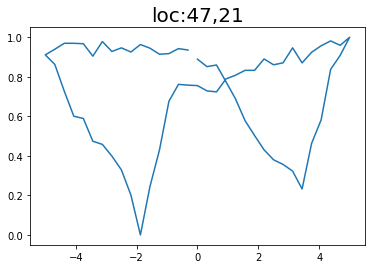

Epoch 1/200 ... Training loss: 2.071
Epoch 10/200 ... Training loss: 2.0117
Epoch 20/200 ... Training loss: 1.874
Epoch 30/200 ... Training loss: 1.7537
Epoch 40/200 ... Training loss: 1.6488
Epoch 50/200 ... Training loss: 1.5926
Epoch 60/200 ... Training loss: 1.5227
Epoch 70/200 ... Training loss: 1.4364
Epoch 80/200 ... Training loss: 1.3639
Epoch 90/200 ... Training loss: 1.3107
Epoch 100/200 ... Training loss: 1.2939
Epoch 110/200 ... Training loss: 1.2289
Epoch 120/200 ... Training loss: 1.2125
Epoch 130/200 ... Training loss: 1.1924
Epoch 140/200 ... Training loss: 1.0986
Epoch 150/200 ... Training loss: 1.1917
Epoch 160/200 ... Training loss: 1.1184
Epoch 170/200 ... Training loss: 1.0067
Epoch 180/200 ... Training loss: 1.1214
Epoch 190/200 ... Training loss: 0.9854
Epoch 200/200 ... Training loss: 0.8797
step:  79
Sample #89




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


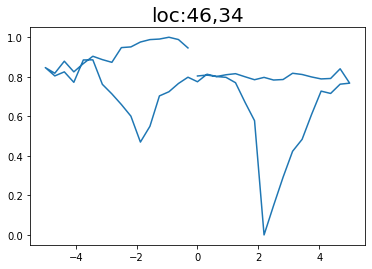

Epoch 1/200 ... Training loss: 2.0567
Epoch 10/200 ... Training loss: 1.9819
Epoch 20/200 ... Training loss: 1.8515
Epoch 30/200 ... Training loss: 1.749
Epoch 40/200 ... Training loss: 1.6418
Epoch 50/200 ... Training loss: 1.5883
Epoch 60/200 ... Training loss: 1.5347
Epoch 70/200 ... Training loss: 1.4635
Epoch 80/200 ... Training loss: 1.3653
Epoch 90/200 ... Training loss: 1.3476
Epoch 100/200 ... Training loss: 1.2908
Epoch 110/200 ... Training loss: 1.2754
Epoch 120/200 ... Training loss: 1.2042
Epoch 130/200 ... Training loss: 1.2187
Epoch 140/200 ... Training loss: 1.1898
Epoch 150/200 ... Training loss: 1.1577
Epoch 160/200 ... Training loss: 1.3567
Epoch 170/200 ... Training loss: 1.1835
Epoch 180/200 ... Training loss: 1.128
Epoch 190/200 ... Training loss: 1.0468
Epoch 200/200 ... Training loss: 1.0105
step:  80
Sample #90




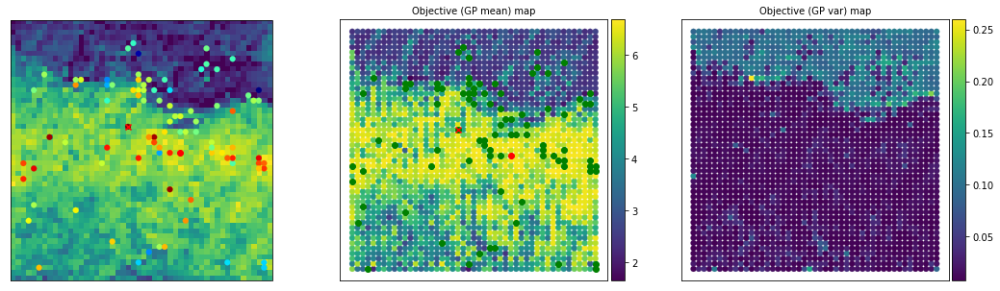

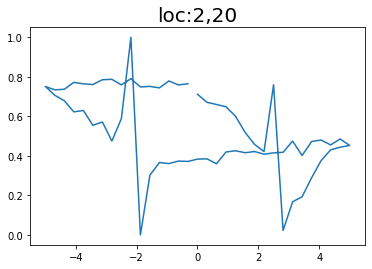

Epoch 1/200 ... Training loss: 2.0509
Epoch 10/200 ... Training loss: 1.9519
Epoch 20/200 ... Training loss: 1.8797
Epoch 30/200 ... Training loss: 1.7617
Epoch 40/200 ... Training loss: 1.6518
Epoch 50/200 ... Training loss: 1.5661
Epoch 60/200 ... Training loss: 1.4973
Epoch 70/200 ... Training loss: 1.4061
Epoch 80/200 ... Training loss: 1.3447
Epoch 90/200 ... Training loss: 1.3027
Epoch 100/200 ... Training loss: 1.2546
Epoch 110/200 ... Training loss: 1.2728
Epoch 120/200 ... Training loss: 1.1748
Epoch 130/200 ... Training loss: 1.0778
Epoch 140/200 ... Training loss: 1.0582
Epoch 150/200 ... Training loss: 1.0844
Epoch 160/200 ... Training loss: 0.9997
Epoch 170/200 ... Training loss: 0.9779
Epoch 180/200 ... Training loss: 0.848
Epoch 190/200 ... Training loss: 1.0599
Epoch 200/200 ... Training loss: 0.9769
step:  81
Sample #91




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


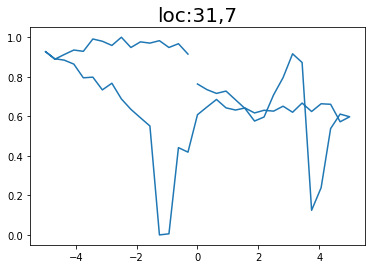

Epoch 1/200 ... Training loss: 2.0424
Epoch 10/200 ... Training loss: 1.9592
Epoch 20/200 ... Training loss: 1.869
Epoch 30/200 ... Training loss: 1.7508
Epoch 40/200 ... Training loss: 1.6262
Epoch 50/200 ... Training loss: 1.5561
Epoch 60/200 ... Training loss: 1.498
Epoch 70/200 ... Training loss: 1.4171
Epoch 80/200 ... Training loss: 1.3421
Epoch 90/200 ... Training loss: 1.3072
Epoch 100/200 ... Training loss: 1.2811
Epoch 110/200 ... Training loss: 1.2069
Epoch 120/200 ... Training loss: 1.1941
Epoch 130/200 ... Training loss: 1.1315
Epoch 140/200 ... Training loss: 1.1305
Epoch 150/200 ... Training loss: 1.0631
Epoch 160/200 ... Training loss: 1.0155
Epoch 170/200 ... Training loss: 0.89
Epoch 180/200 ... Training loss: 1.1376
Epoch 190/200 ... Training loss: 1.0098
Epoch 200/200 ... Training loss: 0.8972
step:  82
Sample #92




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


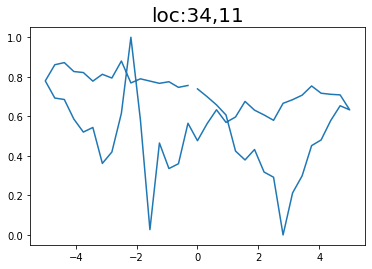

Epoch 1/200 ... Training loss: 2.0291
Epoch 10/200 ... Training loss: 1.9244
Epoch 20/200 ... Training loss: 1.8101
Epoch 30/200 ... Training loss: 1.6936
Epoch 40/200 ... Training loss: 1.623
Epoch 50/200 ... Training loss: 1.5523
Epoch 60/200 ... Training loss: 1.4802
Epoch 70/200 ... Training loss: 1.5608
Epoch 80/200 ... Training loss: 1.4231
Epoch 90/200 ... Training loss: 1.3594
Epoch 100/200 ... Training loss: 1.3329
Epoch 110/200 ... Training loss: 1.2717
Epoch 120/200 ... Training loss: 1.231
Epoch 130/200 ... Training loss: 1.1876
Epoch 140/200 ... Training loss: 1.1904
Epoch 150/200 ... Training loss: 1.3787
Epoch 160/200 ... Training loss: 1.2461
Epoch 170/200 ... Training loss: 1.1256
Epoch 180/200 ... Training loss: 1.0578
Epoch 190/200 ... Training loss: 1.1158
Epoch 200/200 ... Training loss: 1.1371
step:  83
Sample #93




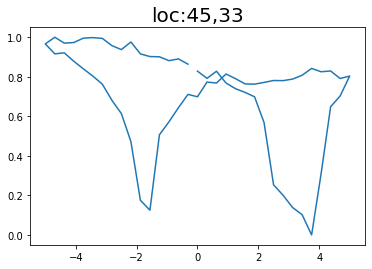

Epoch 1/200 ... Training loss: 2.0227
Epoch 10/200 ... Training loss: 1.9198
Epoch 20/200 ... Training loss: 1.808
Epoch 30/200 ... Training loss: 1.6965
Epoch 40/200 ... Training loss: 1.6255
Epoch 50/200 ... Training loss: 1.5582
Epoch 60/200 ... Training loss: 1.4795
Epoch 70/200 ... Training loss: 1.403
Epoch 80/200 ... Training loss: 1.413
Epoch 90/200 ... Training loss: 1.586
Epoch 100/200 ... Training loss: 1.4219
Epoch 110/200 ... Training loss: 1.3433
Epoch 120/200 ... Training loss: 1.2567
Epoch 130/200 ... Training loss: 1.2271
Epoch 140/200 ... Training loss: 1.2188
Epoch 150/200 ... Training loss: 1.1651
Epoch 160/200 ... Training loss: 1.1512
Epoch 170/200 ... Training loss: 1.1426
Epoch 180/200 ... Training loss: 1.0563
Epoch 190/200 ... Training loss: 1.0641
Epoch 200/200 ... Training loss: 1.0276
step:  84
Sample #94




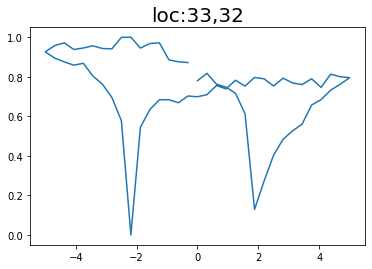

Epoch 1/200 ... Training loss: 2.0097
Epoch 10/200 ... Training loss: 1.9673
Epoch 20/200 ... Training loss: 1.8316
Epoch 30/200 ... Training loss: 1.7231
Epoch 40/200 ... Training loss: 1.6397
Epoch 50/200 ... Training loss: 1.5793
Epoch 60/200 ... Training loss: 1.5246
Epoch 70/200 ... Training loss: 1.4545
Epoch 80/200 ... Training loss: 1.3873
Epoch 90/200 ... Training loss: 1.3448
Epoch 100/200 ... Training loss: 1.2701
Epoch 110/200 ... Training loss: 1.3183
Epoch 120/200 ... Training loss: 1.202
Epoch 130/200 ... Training loss: 1.1478
Epoch 140/200 ... Training loss: 1.1218
Epoch 150/200 ... Training loss: 1.0831
Epoch 160/200 ... Training loss: 1.0931
Epoch 170/200 ... Training loss: 1.0956
Epoch 180/200 ... Training loss: 1.077
Epoch 190/200 ... Training loss: 1.0851
Epoch 200/200 ... Training loss: 0.9823
step:  85
Sample #95




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


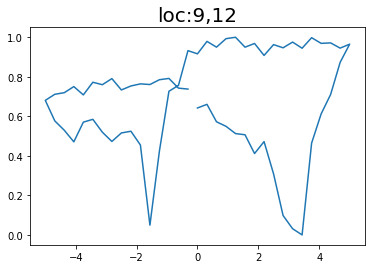

Epoch 1/200 ... Training loss: 1.9964
Epoch 10/200 ... Training loss: 1.897
Epoch 20/200 ... Training loss: 1.7884
Epoch 30/200 ... Training loss: 1.6859
Epoch 40/200 ... Training loss: 1.6165
Epoch 50/200 ... Training loss: 1.5543
Epoch 60/200 ... Training loss: 1.4895
Epoch 70/200 ... Training loss: 1.4581
Epoch 80/200 ... Training loss: 1.367
Epoch 90/200 ... Training loss: 1.2933
Epoch 100/200 ... Training loss: 1.2861
Epoch 110/200 ... Training loss: 1.2134
Epoch 120/200 ... Training loss: 1.2183
Epoch 130/200 ... Training loss: 1.202
Epoch 140/200 ... Training loss: 1.135
Epoch 150/200 ... Training loss: 1.0676
Epoch 160/200 ... Training loss: 1.0728
Epoch 170/200 ... Training loss: 1.0266
Epoch 180/200 ... Training loss: 0.9799
Epoch 190/200 ... Training loss: 0.9697
Epoch 200/200 ... Training loss: 0.9476
step:  86
Sample #96




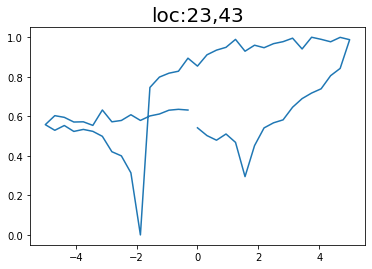

Epoch 1/200 ... Training loss: 1.9859
Epoch 10/200 ... Training loss: 1.9323
Epoch 20/200 ... Training loss: 2.039
Epoch 30/200 ... Training loss: 1.7576
Epoch 40/200 ... Training loss: 1.6757
Epoch 50/200 ... Training loss: 1.6008
Epoch 60/200 ... Training loss: 1.5422
Epoch 70/200 ... Training loss: 1.5018
Epoch 80/200 ... Training loss: 1.4663
Epoch 90/200 ... Training loss: 1.4001
Epoch 100/200 ... Training loss: 1.3318
Epoch 110/200 ... Training loss: 1.2674
Epoch 120/200 ... Training loss: 1.2414
Epoch 130/200 ... Training loss: 1.1856
Epoch 140/200 ... Training loss: 1.1699
Epoch 150/200 ... Training loss: 1.2162
Epoch 160/200 ... Training loss: 1.0699
Epoch 170/200 ... Training loss: 1.0331
Epoch 180/200 ... Training loss: 1.0119
Epoch 190/200 ... Training loss: 0.9614
Epoch 200/200 ... Training loss: 1.0604
step:  87
Sample #97




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


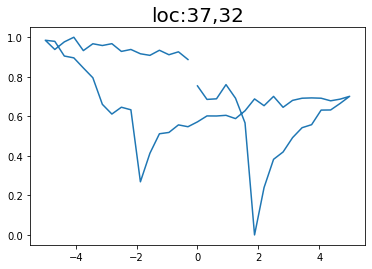

Epoch 1/200 ... Training loss: 1.9881
Epoch 10/200 ... Training loss: 1.8726
Epoch 20/200 ... Training loss: 1.8249
Epoch 30/200 ... Training loss: 1.6905
Epoch 40/200 ... Training loss: 1.6002
Epoch 50/200 ... Training loss: 1.5399
Epoch 60/200 ... Training loss: 1.4816
Epoch 70/200 ... Training loss: 1.4105
Epoch 80/200 ... Training loss: 1.3999
Epoch 90/200 ... Training loss: 1.339
Epoch 100/200 ... Training loss: 1.2697
Epoch 110/200 ... Training loss: 1.2214
Epoch 120/200 ... Training loss: 1.1845
Epoch 130/200 ... Training loss: 1.1351
Epoch 140/200 ... Training loss: 1.1302
Epoch 150/200 ... Training loss: 1.0821
Epoch 160/200 ... Training loss: 1.0257
Epoch 170/200 ... Training loss: 1.0275
Epoch 180/200 ... Training loss: 1.0247
Epoch 190/200 ... Training loss: 0.9689
Epoch 200/200 ... Training loss: 1.0142
step:  88
Sample #98




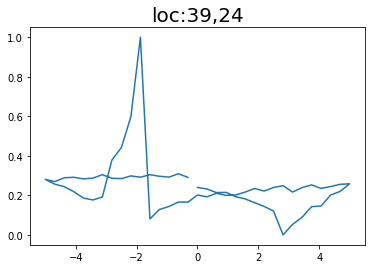

Epoch 1/200 ... Training loss: 1.9957
Epoch 10/200 ... Training loss: 1.9746
Epoch 20/200 ... Training loss: 1.8129
Epoch 30/200 ... Training loss: 1.7101
Epoch 40/200 ... Training loss: 1.6438
Epoch 50/200 ... Training loss: 1.5883
Epoch 60/200 ... Training loss: 1.5344
Epoch 70/200 ... Training loss: 1.4762
Epoch 80/200 ... Training loss: 1.4176
Epoch 90/200 ... Training loss: 1.4783
Epoch 100/200 ... Training loss: 1.3718
Epoch 110/200 ... Training loss: 1.308
Epoch 120/200 ... Training loss: 1.2439
Epoch 130/200 ... Training loss: 1.2113
Epoch 140/200 ... Training loss: 1.2653
Epoch 150/200 ... Training loss: 1.2018
Epoch 160/200 ... Training loss: 1.1563
Epoch 170/200 ... Training loss: 1.1201
Epoch 180/200 ... Training loss: 1.0779
Epoch 190/200 ... Training loss: 1.0587
Epoch 200/200 ... Training loss: 0.9997
step:  89
Sample #99




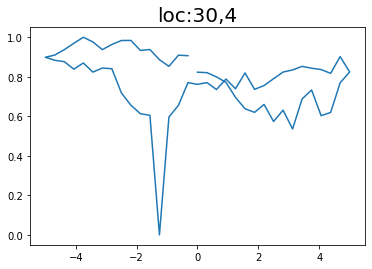

Epoch 1/200 ... Training loss: 1.983
Epoch 10/200 ... Training loss: 1.8895
Epoch 20/200 ... Training loss: 1.7956
Epoch 30/200 ... Training loss: 1.6882
Epoch 40/200 ... Training loss: 1.6227
Epoch 50/200 ... Training loss: 1.575
Epoch 60/200 ... Training loss: 1.5044
Epoch 70/200 ... Training loss: 1.4336
Epoch 80/200 ... Training loss: 1.3633
Epoch 90/200 ... Training loss: 1.3071
Epoch 100/200 ... Training loss: 1.2871
Epoch 110/200 ... Training loss: 1.2856
Epoch 120/200 ... Training loss: 1.1971
Epoch 130/200 ... Training loss: 1.2239
Epoch 140/200 ... Training loss: 1.1227
Epoch 150/200 ... Training loss: 1.1004
Epoch 160/200 ... Training loss: 1.1414
Epoch 170/200 ... Training loss: 1.0192
Epoch 180/200 ... Training loss: 0.9593
Epoch 190/200 ... Training loss: 1.1454
Epoch 200/200 ... Training loss: 1.0702
step:  90
Sample #100




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


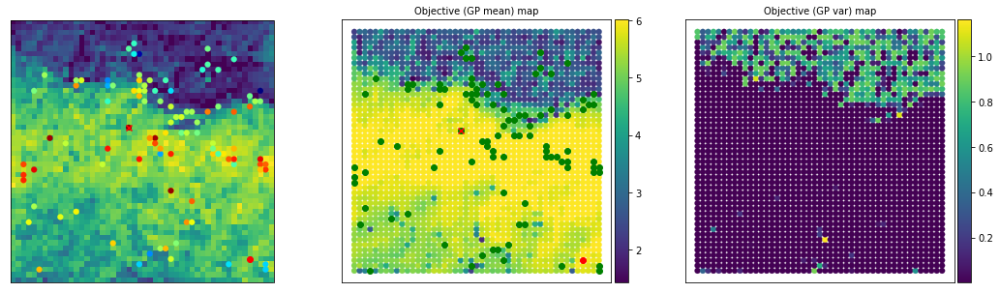

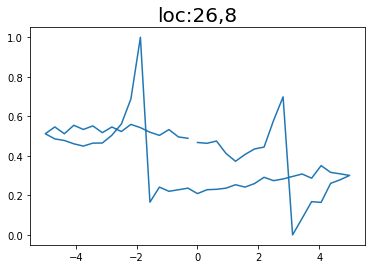

Epoch 1/200 ... Training loss: 1.9756
Epoch 10/200 ... Training loss: 1.9058
Epoch 20/200 ... Training loss: 1.8176
Epoch 30/200 ... Training loss: 1.7156
Epoch 40/200 ... Training loss: 1.6305
Epoch 50/200 ... Training loss: 1.5611
Epoch 60/200 ... Training loss: 1.5034
Epoch 70/200 ... Training loss: 1.447
Epoch 80/200 ... Training loss: 1.3841
Epoch 90/200 ... Training loss: 1.3281
Epoch 100/200 ... Training loss: 1.2804
Epoch 110/200 ... Training loss: 1.2242
Epoch 120/200 ... Training loss: 1.2068
Epoch 130/200 ... Training loss: 1.1668
Epoch 140/200 ... Training loss: 1.12
Epoch 150/200 ... Training loss: 1.1232
Epoch 160/200 ... Training loss: 1.0658
Epoch 170/200 ... Training loss: 0.9688
Epoch 180/200 ... Training loss: 1.124
Epoch 190/200 ... Training loss: 0.9919
Epoch 200/200 ... Training loss: 0.9487
step:  91
Sample #101




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


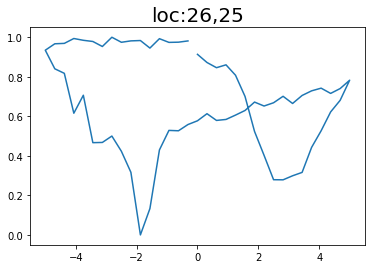

Epoch 1/200 ... Training loss: 1.9784
Epoch 10/200 ... Training loss: 1.8602
Epoch 20/200 ... Training loss: 1.7431
Epoch 30/200 ... Training loss: 1.6697
Epoch 40/200 ... Training loss: 1.6062
Epoch 50/200 ... Training loss: 1.552
Epoch 60/200 ... Training loss: 1.5022
Epoch 70/200 ... Training loss: 1.4445
Epoch 80/200 ... Training loss: 1.4527
Epoch 90/200 ... Training loss: 1.3607
Epoch 100/200 ... Training loss: 1.2937
Epoch 110/200 ... Training loss: 1.2243
Epoch 120/200 ... Training loss: 1.2466
Epoch 130/200 ... Training loss: 1.1606
Epoch 140/200 ... Training loss: 1.0867
Epoch 150/200 ... Training loss: 1.258
Epoch 160/200 ... Training loss: 1.1167
Epoch 170/200 ... Training loss: 1.0751
Epoch 180/200 ... Training loss: 1.0109
Epoch 190/200 ... Training loss: 0.9545
Epoch 200/200 ... Training loss: 0.969
step:  92
Sample #102




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


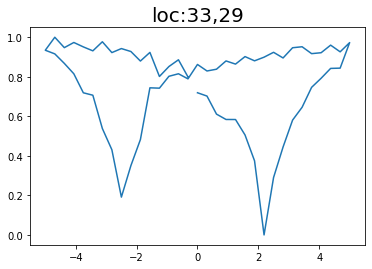

Epoch 1/200 ... Training loss: 1.9678
Epoch 10/200 ... Training loss: 1.9404
Epoch 20/200 ... Training loss: 1.8042
Epoch 30/200 ... Training loss: 1.6895
Epoch 40/200 ... Training loss: 1.6107
Epoch 50/200 ... Training loss: 1.5582
Epoch 60/200 ... Training loss: 1.5033
Epoch 70/200 ... Training loss: 1.4297
Epoch 80/200 ... Training loss: 1.3842
Epoch 90/200 ... Training loss: 1.3708
Epoch 100/200 ... Training loss: 1.32
Epoch 110/200 ... Training loss: 1.2643
Epoch 120/200 ... Training loss: 1.2178
Epoch 130/200 ... Training loss: 1.2781
Epoch 140/200 ... Training loss: 1.1796
Epoch 150/200 ... Training loss: 1.1266
Epoch 160/200 ... Training loss: 1.0909
Epoch 170/200 ... Training loss: 1.1097
Epoch 180/200 ... Training loss: 1.0759
Epoch 190/200 ... Training loss: 1.0258
Epoch 200/200 ... Training loss: 1.0224
step:  93
Sample #103




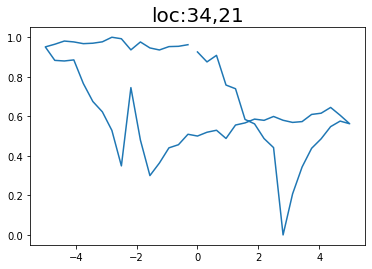

Epoch 1/200 ... Training loss: 1.9744
Epoch 10/200 ... Training loss: 1.9153
Epoch 20/200 ... Training loss: 1.7844
Epoch 30/200 ... Training loss: 1.6724
Epoch 40/200 ... Training loss: 1.5827
Epoch 50/200 ... Training loss: 1.5428
Epoch 60/200 ... Training loss: 1.5046
Epoch 70/200 ... Training loss: 1.4392
Epoch 80/200 ... Training loss: 1.3416
Epoch 90/200 ... Training loss: 1.4347
Epoch 100/200 ... Training loss: 1.2809
Epoch 110/200 ... Training loss: 1.2161
Epoch 120/200 ... Training loss: 1.2492
Epoch 130/200 ... Training loss: 1.171
Epoch 140/200 ... Training loss: 1.2051
Epoch 150/200 ... Training loss: 1.1227
Epoch 160/200 ... Training loss: 1.081
Epoch 170/200 ... Training loss: 1.0659
Epoch 180/200 ... Training loss: 1.0172
Epoch 190/200 ... Training loss: 1.0177
Epoch 200/200 ... Training loss: 0.9636
step:  94
Sample #104




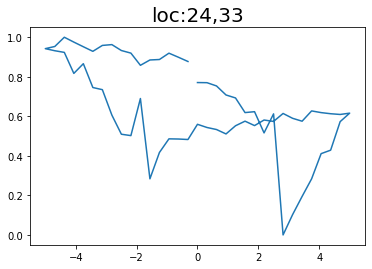

Epoch 1/200 ... Training loss: 1.9682
Epoch 10/200 ... Training loss: 1.8562
Epoch 20/200 ... Training loss: 1.7987
Epoch 30/200 ... Training loss: 1.7018
Epoch 40/200 ... Training loss: 1.6194
Epoch 50/200 ... Training loss: 1.5548
Epoch 60/200 ... Training loss: 1.5023
Epoch 70/200 ... Training loss: 1.4237
Epoch 80/200 ... Training loss: 1.3376
Epoch 90/200 ... Training loss: 1.323
Epoch 100/200 ... Training loss: 1.2591
Epoch 110/200 ... Training loss: 1.2271
Epoch 120/200 ... Training loss: 1.1875
Epoch 130/200 ... Training loss: 1.1904
Epoch 140/200 ... Training loss: 1.1038
Epoch 150/200 ... Training loss: 1.169
Epoch 160/200 ... Training loss: 1.0731
Epoch 170/200 ... Training loss: 1.0035
Epoch 180/200 ... Training loss: 0.983
Epoch 190/200 ... Training loss: 0.9509
Epoch 200/200 ... Training loss: 1.0921
step:  95
Sample #105




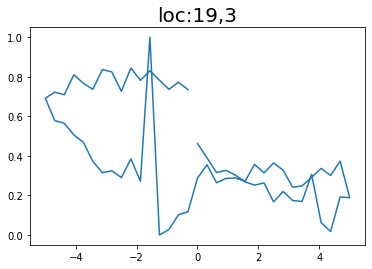

Epoch 1/200 ... Training loss: 1.9968
Epoch 10/200 ... Training loss: 1.91
Epoch 20/200 ... Training loss: 1.809
Epoch 30/200 ... Training loss: 1.7172
Epoch 40/200 ... Training loss: 1.6342
Epoch 50/200 ... Training loss: 1.5458
Epoch 60/200 ... Training loss: 1.5186
Epoch 70/200 ... Training loss: 1.4353
Epoch 80/200 ... Training loss: 1.39
Epoch 90/200 ... Training loss: 1.3337
Epoch 100/200 ... Training loss: 1.5775
Epoch 110/200 ... Training loss: 1.6127
Epoch 120/200 ... Training loss: 1.5418
Epoch 130/200 ... Training loss: 1.409
Epoch 140/200 ... Training loss: 1.3268
Epoch 150/200 ... Training loss: 1.4639
Epoch 160/200 ... Training loss: 1.3248
Epoch 170/200 ... Training loss: 1.2488
Epoch 180/200 ... Training loss: 1.2089
Epoch 190/200 ... Training loss: 1.2555
Epoch 200/200 ... Training loss: 1.2375
step:  96
Sample #106




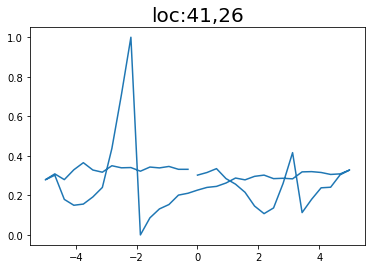

Epoch 1/200 ... Training loss: 1.9966
Epoch 10/200 ... Training loss: 1.9571
Epoch 20/200 ... Training loss: 1.8604
Epoch 30/200 ... Training loss: 1.758
Epoch 40/200 ... Training loss: 1.6823
Epoch 50/200 ... Training loss: 1.6079
Epoch 60/200 ... Training loss: 1.5479
Epoch 70/200 ... Training loss: 1.4918
Epoch 80/200 ... Training loss: 1.4429
Epoch 90/200 ... Training loss: 1.3834
Epoch 100/200 ... Training loss: 1.3217
Epoch 110/200 ... Training loss: 1.2636
Epoch 120/200 ... Training loss: 1.4539
Epoch 130/200 ... Training loss: 1.2687
Epoch 140/200 ... Training loss: 1.2202
Epoch 150/200 ... Training loss: 1.3006
Epoch 160/200 ... Training loss: 1.1863
Epoch 170/200 ... Training loss: 1.1714
Epoch 180/200 ... Training loss: 1.087
Epoch 190/200 ... Training loss: 1.073
Epoch 200/200 ... Training loss: 1.0655
step:  97
Sample #107




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


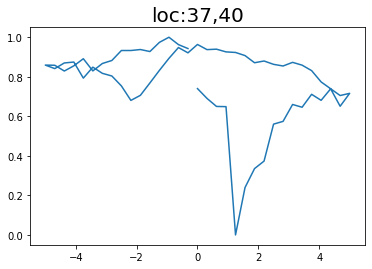

Epoch 1/200 ... Training loss: 2.0186
Epoch 10/200 ... Training loss: 1.8884
Epoch 20/200 ... Training loss: 1.8413
Epoch 30/200 ... Training loss: 1.7209
Epoch 40/200 ... Training loss: 1.6465
Epoch 50/200 ... Training loss: 1.5918
Epoch 60/200 ... Training loss: 1.5319
Epoch 70/200 ... Training loss: 1.4575
Epoch 80/200 ... Training loss: 1.4172
Epoch 90/200 ... Training loss: 1.36
Epoch 100/200 ... Training loss: 1.3236
Epoch 110/200 ... Training loss: 1.2894
Epoch 120/200 ... Training loss: 1.2917
Epoch 130/200 ... Training loss: 1.2061
Epoch 140/200 ... Training loss: 1.192
Epoch 150/200 ... Training loss: 1.2137
Epoch 160/200 ... Training loss: 1.1926
Epoch 170/200 ... Training loss: 1.1133
Epoch 180/200 ... Training loss: 1.0475
Epoch 190/200 ... Training loss: 1.1844
Epoch 200/200 ... Training loss: 1.0237
step:  98
Sample #108




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


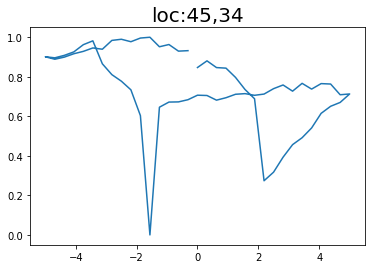

Epoch 1/200 ... Training loss: 2.0214
Epoch 10/200 ... Training loss: 1.9027
Epoch 20/200 ... Training loss: 1.823
Epoch 30/200 ... Training loss: 1.7151
Epoch 40/200 ... Training loss: 1.6319
Epoch 50/200 ... Training loss: 1.5701
Epoch 60/200 ... Training loss: 1.5162
Epoch 70/200 ... Training loss: 1.4541
Epoch 80/200 ... Training loss: 1.3685
Epoch 90/200 ... Training loss: 1.3069
Epoch 100/200 ... Training loss: 1.2972
Epoch 110/200 ... Training loss: 1.2495
Epoch 120/200 ... Training loss: 1.2389
Epoch 130/200 ... Training loss: 1.3277
Epoch 140/200 ... Training loss: 1.1963
Epoch 150/200 ... Training loss: 1.1212
Epoch 160/200 ... Training loss: 1.1166
Epoch 170/200 ... Training loss: 1.0815
Epoch 180/200 ... Training loss: 1.019
Epoch 190/200 ... Training loss: 0.9457
Epoch 200/200 ... Training loss: 0.9045
step:  99
Sample #109




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


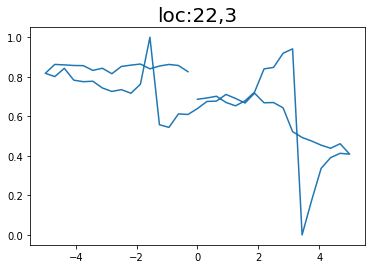

Epoch 1/200 ... Training loss: 2.0338
Epoch 10/200 ... Training loss: 1.9261
Epoch 20/200 ... Training loss: 1.8213
Epoch 30/200 ... Training loss: 1.7321
Epoch 40/200 ... Training loss: 1.6402
Epoch 50/200 ... Training loss: 1.58
Epoch 60/200 ... Training loss: 1.5126
Epoch 70/200 ... Training loss: 1.4588
Epoch 80/200 ... Training loss: 1.4201
Epoch 90/200 ... Training loss: 1.3733
Epoch 100/200 ... Training loss: 1.3118
Epoch 110/200 ... Training loss: 1.368
Epoch 120/200 ... Training loss: 1.2761
Epoch 130/200 ... Training loss: 1.2902
Epoch 140/200 ... Training loss: 1.2223
Epoch 150/200 ... Training loss: 1.3638
Epoch 160/200 ... Training loss: 1.216
Epoch 170/200 ... Training loss: 1.1231
Epoch 180/200 ... Training loss: 1.1205
Epoch 190/200 ... Training loss: 1.1234
Epoch 200/200 ... Training loss: 1.0287
step:  100
Sample #110




/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


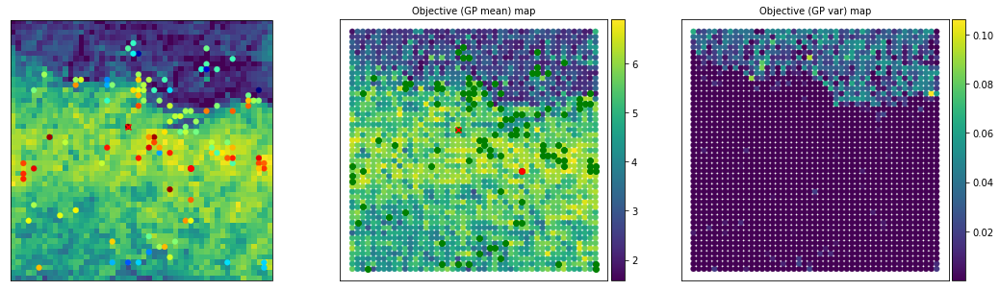

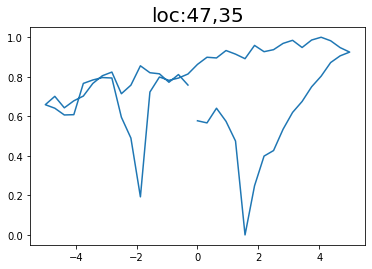

Epoch 1/200 ... Training loss: 2.0329
Epoch 10/200 ... Training loss: 1.9954
Epoch 20/200 ... Training loss: 1.8648
Epoch 30/200 ... Training loss: 1.764
Epoch 40/200 ... Training loss: 1.6679
Epoch 50/200 ... Training loss: 1.5971
Epoch 60/200 ... Training loss: 1.5432
Epoch 70/200 ... Training loss: 1.4838
Epoch 80/200 ... Training loss: 1.4316
Epoch 90/200 ... Training loss: 1.4031
Epoch 100/200 ... Training loss: 1.3557
Epoch 110/200 ... Training loss: 1.3225
Epoch 120/200 ... Training loss: 1.2463
Epoch 130/200 ... Training loss: 1.2183
Epoch 140/200 ... Training loss: 1.1609
Epoch 150/200 ... Training loss: 1.122
Epoch 160/200 ... Training loss: 1.1996
Epoch 170/200 ... Training loss: 1.2578
Epoch 180/200 ... Training loss: 1.1037
Epoch 190/200 ... Training loss: 1.0398
Epoch 200/200 ... Training loss: 1.0374


#####----Max. sampling reached, model stopped----#####


/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


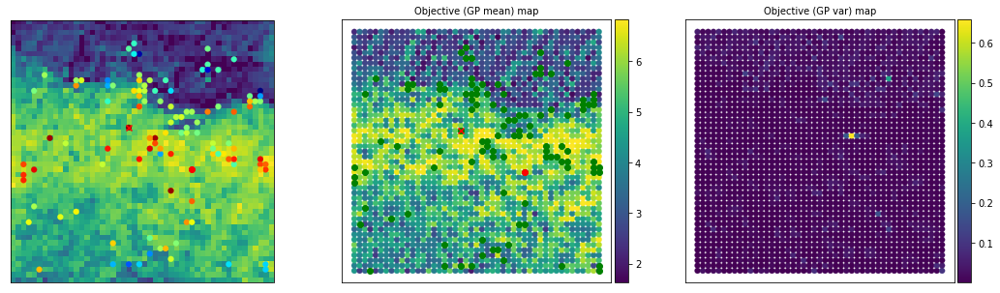

/usr/local/lib/python3.8/dist-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [16]:
## Gp model fit
# Calling function to fit and optimizize Hyperparameter of Gaussian Process (using Adam optimizer)
# Input args- Torch arrays of normalized training data, parameter X and objective eval Y
# Output args- Gaussian process model lists
switch_obj_index = 0 # This is the index parameter to switch from 0 to 1 when the user satisfy with updating target
#Set up the surrogat emodel
gp_surro = play_varTBO.optimize_dKLgp(train_X_norm, train_Y[:, 0])

for i in range(1, N + 1):
    print("step: ", i)
    print("Sample #" + str(m + 1)+ "\n\n")
    # Calculate posterior for analysis for intermidiate iterations
    y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_surro, test_X_norm)
        
    #Plot every tenth iteration after running the evaluation
    if ((i == 1) or ((i % 10) == 0)):
        #This will estimate the surrogate
        X_eval, X_GP = play_varTBO.estimate(train_indices, train_Y, indices, y_pred_means)
        #print(X_eval, X_GP)
        fig = plot_results(train_indices, train_Y, indices, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)
        #put the savefig within the plot function
        #fig.savefig('acquisition_results_step=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
    #calculate acquisition function
    acq_cand, acq_val, EI_val = play_varTBO.acqmanEI(y_pred_means, y_pred_vars, train_Y, idx)
    val = acq_val
    ind = np.random.choice(acq_cand) # When multiple points have same acq values
    idx = np.hstack((idx, ind))
    #print(new_points_measured, idx)

    ## Find next point which maximizes the learning through exploration-exploitation
    if (i == 1):
        val_ini = val
      # Check for convergence
    if ((val) < 0):  # Stop for negligible expected improvement
        print("Model converged due to sufficient learning over search space ")
        break
    else:
        nextX = np.zeros((1, test_X.shape[1]))
        nextX_norm = np.zeros((1, test_X_norm.shape[1]))
        next_indices = np.zeros((1,2))
        nextX[0,:] = test_X[ind, :]
        nextX_norm [0, :] = test_X_norm[ind, :]
        next_indices[0, :] = indices[ind, :]
        idx_x = int(next_indices[0, 0])
        idx_y = int(next_indices[0, 1])

        next_loc = np.asarray([idx_x, idx_y])
        new_points_measured = idx
        
        #polarization loop area
        IV, points_measured = return_new_measurement(targets, new_points_measured)

        new_iv = IV[points_measured,:]

        #new_spec_x = torch.from_numpy(vdc_vec)
        #new_spec_y = torch.from_numpy(new_iv)[-1]

        new_spec_x = vdc_vec
        new_spec_y = new_iv[-1]

      
        new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
        
        #clear_output(wait=True) Comment out as I need to check the run in colab
        
        eval_spec_y[idx_x, idx_y, :] = new_spec_y
        # Evaluate true function for new data, augment data
        train_X, train_X_norm, train_indices, train_Y, var_params, switch_obj_index, m =\
        play_varTBO.augment_newdata_KL(nextX, nextX_norm, next_indices, train_X, train_X_norm, train_indices, train_Y,
                                        new_spec_x, new_spec_y, eval_spec_y, img, var_params, switch_obj_index, m)


        #print(next_indices)
        # Gp model fit
        # Updating GP with augmented training data
        gp_surro = play_varTBO.optimize_dKLgp(train_X_norm, train_Y[:, 0])

    ## Final posterior prediction after all the sampling done

if (i == N):
    print("\n\n#####----Max. sampling reached, model stopped----#####")

#Optimal GP learning
gp_opt = gp_surro
# Posterior calculation with converged GP model
y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_opt, test_X_norm)

# Plotting functions to check final iteration
X_opt, X_opt_GP = play_varTBO.estimate(train_indices, train_Y, indices, y_pred_means)
plot_results(train_indices, train_Y, indices, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)

explored_data = [train_indices, train_indices, train_Y]
final_GP_estim = [y_pred_means, y_pred_vars]
user_votes = var_params[1]
optim_results = [X_opt, X_opt_GP, user_votes, explored_data]

#Save few data
np.save("optim_results", optim_results)

# Classification

Text(0.5, 1.0, 'Image classification')

<Figure size 432x288 with 0 Axes>

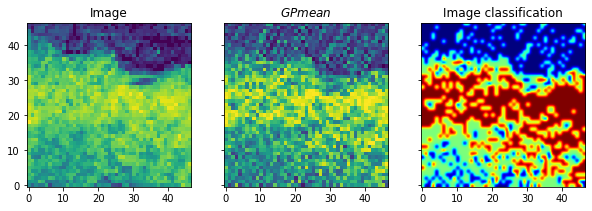

In [22]:
z1_org = final_GP_estim[0]
d1 = int(z1_org.shape[0]**(1/2))
d2 = d1
z1_org = z1_org.reshape(d1,d2)
z1_org = (z1_org-np.min(z1_org))/(np.max(z1_org)-np.min(z1_org))

#Denoising the image using bilateral filter

z1 = denoise_bilateral(z1_org, sigma_color=0.05, sigma_spatial=5)


#Determining threshold from otsu algo to separate between foreground and background images
val1 = filters.threshold_multiotsu(z1, classes = 3)
emag_z1 = np.digitize(z1, bins=val1)

plt.figure()
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 15), sharex=True, sharey=True)

ax[0].imshow(img, origin = "lower")
ax[0].set_title("Image")
ax[1].imshow(z1_org, origin="lower", cmap="viridis")
ax[1].set_title("$GP mean$")
ax[2].imshow(emag_z1, origin="lower", cmap="jet", interpolation="gaussian")
ax[2].set_title("Image classification")

